In [1]:
import torch #should be installed by default in any colab notebook
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import h5py
from time import time
from datetime import datetime
from IPython import display as display_IPython
from piqa import SSIM

assert torch.cuda.is_available(), "GPU is not enabled"

# use gpu if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Define the MODELS

In [2]:
from collections import OrderedDict

class FCModel(nn.Module):
    def __init__(self, input_size, n_layers, neurons_per_layer, dropout_per_layer, h, w, use_relu_in_last=False): 
        # last layer number of neurons will be equal to the output size!
        super(FCModel, self).__init__()
        self.input_size = input_size
        self.h=h
        self.w=w
        
        assert h*w==neurons_per_layer[-1]
        
        sequence=[(f'Linear0', nn.Linear(input_size, neurons_per_layer[0])), 
                      (f'ReLU0',nn.LeakyReLU())]
        for i in range(1,n_layers):
            if dropout_per_layer[i]!=0:
                sequence.append((f'Dropout{i}', nn.Dropout(p=dropout_per_layer[i], inplace=False)))
            sequence.append((f'Linear{i}', nn.Linear(neurons_per_layer[i-1], neurons_per_layer[i])))
            sequence.append((f'ReLU{i}', nn.LeakyReLU()))
            
        if use_relu_in_last==False:
            sequence=sequence[:-1]
        self.network = nn.Sequential(OrderedDict( sequence ))

    def forward(self, x):
        x = x.view(-1, self.input_size) # [N_batch, input_size]
        return torch.reshape(self.network(x), (x.shape[0], self.h, self.w) ) # [N_batch, neurons_per_layer[-1]]


class PrintLayer(nn.Module):
    def __init__(self):
        super(PrintLayer, self).__init__()
    
    def forward(self, x):
        # Do your print / debug stuff here
        print(x.shape)
        return x

class FC_CNN_Model(nn.Module):
    def __init__(self, input_size, n_fc_layers, neurons_per_layer, h, w, 
                 unflatten_shape, n_cnn_layers, filter_size_per_layer,
                 channels_per_layer,
                 use_relu_in_last=False): 
        # last layer number of neurons will be equal to the output size!
        super(FC_CNN_Model, self).__init__()
        self.input_size = input_size
        self.h=h
        self.w=w
        
        assert unflatten_shape[0]*unflatten_shape[1]*unflatten_shape[2]==neurons_per_layer[-1]        
        
        sequence=[(f'Linear0', nn.Linear(input_size, neurons_per_layer[0])), 
                      (f'ReLU0',nn.LeakyReLU())]
        #sequence.append((f'print', PrintLayer()))

        for i in range(1,n_fc_layers):
            sequence.append((f'Linear{i}', nn.Linear(neurons_per_layer[i-1], neurons_per_layer[i])))
            sequence.append((f'ReLU{i}', nn.LeakyReLU()))
            #sequence.append((f'print{i}', PrintLayer()))
        
        sequence.append((f'Unflatten', nn.Unflatten(dim=1, unflattened_size=unflatten_shape)))
        #sequence.append((f'print0', PrintLayer()))

        sequence.append((f'CNN0', nn.ConvTranspose2d(in_channels=unflatten_shape[0],
                                               out_channels=channels_per_layer[0], 
                                               kernel_size = filter_size_per_layer[0]))) 
        sequence.append((f'ReLU0cnn', nn.LeakyReLU()))

        #sequence.append((f'print00', PrintLayer()))

        for i in range(1,n_cnn_layers):
            sequence.append((f'CNN{i}', nn.ConvTranspose2d(in_channels=channels_per_layer[i-1],
                                                    out_channels=channels_per_layer[i], 
                                                kernel_size = filter_size_per_layer[i])))
            sequence.append((f'ReLU{i+n_fc_layers}', nn.LeakyReLU()))
            #sequence.append((f'print{i+n_fc_layers}', PrintLayer()))
            
        if use_relu_in_last==False:
            sequence=sequence[:-1]
        self.network = nn.Sequential(OrderedDict( sequence ))

    def forward(self, x):
        x = x.view(-1, self.input_size) # [N_batch, output_size]
        return torch.reshape(self.network(x), (x.shape[0], self.h, self.w) ) # [N_batch, neurons_per_layer[-1]]
    


In [3]:
def get_n_params(model):
    np=0
    for p in list(model.parameters()):
        np += p.numel()
    return np

# Instantiate a custom Dataset class

In [4]:
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

class Audio_Image_Dataset(Dataset):
    def __init__(self, h5f_full_path):
        self.h5f = h5py.File(f"{h5f_full_path}", 'r')
        self.im_shape = np.array(self.h5f[ "0_im" ]).shape
        self.aud_shape = np.array(self.h5f[ "0_aud" ]).shape
        self.num_samples = len(self.h5f)//2
        print(f"There are {self.num_samples} images and audios\nwith {self.im_shape} sized images\nand {self.aud_shape} sized audios")

    def __len__(self):
        return self.num_samples

    def __getitem__(self, idx):
        image = torch.tensor(np.array(self.h5f[f"{idx}_im"]), dtype=torch.float32)
        audio = torch.tensor(np.array(self.h5f[f"{idx}_aud"]), dtype=torch.float32)
        return audio, image

In [5]:
batch_size = 100
partition = 0.95
path_to_h5f = "/home/melanie/Desktop/Reconstructing_Space_with_Time/DATASETS_DEPTH_IMAGE_ECHO_RECORDINGS/Dataset_5000_setup_Day1/Dataset.h5"

torch.manual_seed(666)
full_dataset = Audio_Image_Dataset( path_to_h5f )
train_size = int(partition * len(full_dataset))
test_size = len(full_dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(full_dataset, [train_size, test_size])

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1)
val_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=1)
print(f"Train loader has {len(train_loader)*train_loader.batch_size}\nTest loader has {len(val_loader)*val_loader.batch_size}")

There are 5650 images and audios
with (57, 68) sized images
and (1450,) sized audios
Train loader has 5400
Test loader has 300


# Train and Validation Loops

In [6]:
@torch.no_grad()  # prevent this function from computing gradients 
def validate_epoch(criterion, model, dataloader): 
    val_loss = 0

    model.eval() # disable the dropout, among others

    for batch_idx, (data, target) in enumerate(dataloader):  
        data, target = data.to(device), target.to(device)
        prediction = model(data)
        target = target.view(prediction.shape)
        loss = criterion(prediction, target)
        val_loss += loss.item()             

    val_loss /= len(dataloader)
    print(f'\nValidation set: Average loss: {val_loss:.4f} \n')
    return val_loss


def train_epoch(epoch, criterion, model, optimizer, dataloader, print_loss_every_batches=20,
                optimizer_step_every_batches=1):
    
    total_loss = 0.0

    model.train()

    optimizer.zero_grad()
    #t = time()
    for batch_idx, (data, target) in enumerate(dataloader):  
        data, target = data.to(device), target.to(device)
        prediction = model(data) # data is [batch_size, embedding_dim]
        loss = criterion(prediction, target)
        loss.backward()
        
        if batch_idx % optimizer_step_every_batches==optimizer_step_every_batches-1:
            optimizer.step()
            optimizer.zero_grad()
        # print loss every N batches
        if batch_idx % print_loss_every_batches == print_loss_every_batches-1:
            print(f'Train Epoch: {epoch} [{(batch_idx+1) * len(data)}/{len(dataloader)*dataloader.batch_size} ({100*(batch_idx+1)*len(data) / (len(dataloader)*dataloader.batch_size):.0f}%)]\t Loss: {loss.item():.6f}')
            
        total_loss += loss.item()

    return total_loss / len(dataloader)

## Full training loop

In [7]:
def full_training_loop(model, criterion, optimizer, train_loader, test_loader, epochs=10,
                       print_loss_every_batches=20, validate_every_epochs=2, optimizer_step_every_batches=1,
                      image_path=None, save_model_every_epochs=1, model_path=None, best_model_path=None):
    losses = {"train": [], "val": []}
    %matplotlib inline
    for epoch in range(epochs):

        train_loss = train_epoch(epoch, criterion, model, optimizer, train_loader,
                                 print_loss_every_batches=print_loss_every_batches,
                                optimizer_step_every_batches=optimizer_step_every_batches
                                )
        if epoch%validate_every_epochs==0 and epoch!=0:
            val_loss = validate_epoch(criterion, model, test_loader)
        else:
            try:
                val_loss = losses["val"][-1]
            except:
                val_loss = train_loss
        if epoch and train_loss<=min(losses["train"]) and best_model_path:
            torch.save({
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            }, best_model_path)
        
        losses["train"].append(train_loss)
        losses["val"].append(val_loss)        
        plt.plot(losses["train"], label="training loss")
        plt.plot(losses["val"], label="validation loss")
        #plt.yscale('log')
        plt.legend()
        if image_path is not None:
            plt.savefig(image_path)
            plt.clf()
        else:
            display_IPython.clear_output(wait=True)
            plt.pause(0.001)
            plt.show()
        if epoch % save_model_every_epochs==save_model_every_epochs-1 and model_path:
            torch.save({
            'model': model.state_dict(),
            'optimizer': optimizer.state_dict(),
            }, model_path)

    return losses

# Fix the Hyperparameters and Initialize the Model and the Optimizer

In [8]:
# Fully Connected
input_size = full_dataset.aud_shape[0]
h = full_dataset.im_shape[0]
w = full_dataset.im_shape[1]

neurons_per_layer = [input_size, input_size, input_size//2, input_size//2, input_size, input_size, h*w]
dropout_per_layer = [0.15, 0.0,0.15, 0.0, 0.15, 0.15, 0.0]
exp_name = f"FC_{neurons_per_layer}"
n_layers = len(neurons_per_layer)
use_relu_in_last = True

'''
# FC + Convolutional
input_size= full_dataset.aud_shape[0]
# neurons_per_layer=[input_size, input_size, 3*input_size//4, input_size, 900] # A
neurons_per_layer=[input_size, input_size//2, input_size//2, 900] # B
n_fc_layers=len(neurons_per_layer)
h=full_dataset.im_shape[0]
w=full_dataset.im_shape[1]
unflatten_shape=(1, 30,30)
filter_size_per_layer=[[6,6], [6,6], [6,6], [6,6], [8,19]] #(57, 68)
channels_per_layer=[10, 10, 10, 10, 1]
n_cnn_layers=len(filter_size_per_layer)
use_relu_in_last=False
exp_name = f"FC_CNN_fc_ns{neurons_per_layer}_ker_siz{filter_size_per_layer}_chans_l{channels_per_layer}"
'''

# other params

total_epochs = 1000
validate_every_epochs = 2
optimizer_step_every_batches = 1
save_model_every_epochs = 2

class SSIMLoss(SSIM):
    def __init__(self):
        super(SSIMLoss, self).__init__(n_channels=1)
        self.n_channels=1

    def forward(self, x, y):
        x=torch.abs(x.unsqueeze(1))
        return 1. - super().forward(x/x.max(), y.unsqueeze(1))

In [9]:
model = FCModel(input_size=input_size, n_layers=n_layers, neurons_per_layer=neurons_per_layer,
                dropout_per_layer=dropout_per_layer,
                h=h, w=w, use_relu_in_last=use_relu_in_last)

#model = FC_CNN_Model(input_size=input_size, n_fc_layers=n_fc_layers, neurons_per_layer=neurons_per_layer,
#                     h=h, w=w, unflatten_shape=unflatten_shape, n_cnn_layers=n_cnn_layers,
#                     filter_size_per_layer=filter_size_per_layer, channels_per_layer=channels_per_layer,
#                 use_relu_in_last=use_relu_in_last)

print(f"Number of parameters {get_n_params(model)}")

# In case we wish to transfer the learned parameters of another run
out_path = "/home/melanie/Desktop/Reconstructing_Space_with_Time/DEEP_LEARNING_LAB/Networks/"
#check_file="Model_and_Optimizer_2022-05-15 22:35:53.740264_FC_CNN_fc_ns[1920, 960, 960, 900]_ker_siz[[6, 6], [6, 6], [6, 6], [6, 6], [8, 19]]_chans_l[10, 10, 10, 10, 1].pt"
#checkpoint = torch.load(f"{out_path}/{check_file}")

# move model to gpu if available
model.to(device)

#model.load_state_dict(checkpoint['model'])

# Initialize the weights of the model! Default initialization might already be fine!

# we can use a MSE loss for the regression task we have in hands
criterion = nn.MSELoss()
#criterion = SSIMLoss().cuda() # if you need GPU support

# we will choose as optimizer the 
#optimizer = torch.optim.Adagrad(model.parameters(), lr=0.1, lr_decay=0.01, weight_decay=0.3,
#                                initial_accumulator_value=0, eps=1e-10)

optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, betas=(0.99, 0.999), 
                             eps=1e-08, weight_decay=0, amsgrad=False)
#optimizer.load_state_dict(checkpoint['optimizer'])
print(model)

Number of parameters 14566951
FCModel(
  (network): Sequential(
    (Linear0): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU0): LeakyReLU(negative_slope=0.01)
    (Linear1): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU1): LeakyReLU(negative_slope=0.01)
    (Dropout2): Dropout(p=0.15, inplace=False)
    (Linear2): Linear(in_features=1450, out_features=725, bias=True)
    (ReLU2): LeakyReLU(negative_slope=0.01)
    (Linear3): Linear(in_features=725, out_features=725, bias=True)
    (ReLU3): LeakyReLU(negative_slope=0.01)
    (Dropout4): Dropout(p=0.15, inplace=False)
    (Linear4): Linear(in_features=725, out_features=1450, bias=True)
    (ReLU4): LeakyReLU(negative_slope=0.01)
    (Dropout5): Dropout(p=0.15, inplace=False)
    (Linear5): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU5): LeakyReLU(negative_slope=0.01)
    (Linear6): Linear(in_features=1450, out_features=3876, bias=True)
    (ReLU6): LeakyReLU(negative_slope=0.01)
 

# Run the Training

In [10]:
%%time
losses = full_training_loop(model, criterion, optimizer, train_loader, val_loader, 
                    epochs=total_epochs, print_loss_every_batches=40,
                            validate_every_epochs=validate_every_epochs,
                           optimizer_step_every_batches=optimizer_step_every_batches,
                           image_path=out_path+ f"/Training_Loss_{datetime.now()}_{exp_name}.png",
                           save_model_every_epochs=save_model_every_epochs, 
                            model_path=out_path+f"/Model_and_Optimizer_{datetime.now()}_{exp_name}.pt",
                            best_model_path=out_path+f"/BEST_Model_and_Optimizer_{datetime.now()}_{exp_name}.pt"
                           )
# Execute the training and validation

Train Epoch: 0 [4000/5400 (74%)]	 Loss: 3052.109131
Train Epoch: 1 [4000/5400 (74%)]	 Loss: 3339.116943
Train Epoch: 2 [4000/5400 (74%)]	 Loss: 2956.170410

Validation set: Average loss: 2738.9061 

Train Epoch: 3 [4000/5400 (74%)]	 Loss: 2275.902588
Train Epoch: 4 [4000/5400 (74%)]	 Loss: 1829.221680

Validation set: Average loss: 1943.6415 

Train Epoch: 5 [4000/5400 (74%)]	 Loss: 1623.298218
Train Epoch: 6 [4000/5400 (74%)]	 Loss: 1391.610596

Validation set: Average loss: 1630.0508 

Train Epoch: 7 [4000/5400 (74%)]	 Loss: 1429.787354
Train Epoch: 8 [4000/5400 (74%)]	 Loss: 1313.648193

Validation set: Average loss: 1574.0345 

Train Epoch: 9 [4000/5400 (74%)]	 Loss: 1520.847046
Train Epoch: 10 [4000/5400 (74%)]	 Loss: 1185.238892

Validation set: Average loss: 1467.8640 

Train Epoch: 11 [4000/5400 (74%)]	 Loss: 1091.450439
Train Epoch: 12 [4000/5400 (74%)]	 Loss: 929.268982

Validation set: Average loss: 1381.6794 

Train Epoch: 13 [4000/5400 (74%)]	 Loss: 1124.318359
Train Epoch

Train Epoch: 112 [4000/5400 (74%)]	 Loss: 297.349396

Validation set: Average loss: 1164.2067 

Train Epoch: 113 [4000/5400 (74%)]	 Loss: 245.024643
Train Epoch: 114 [4000/5400 (74%)]	 Loss: 263.444702

Validation set: Average loss: 1166.9579 

Train Epoch: 115 [4000/5400 (74%)]	 Loss: 261.457916
Train Epoch: 116 [4000/5400 (74%)]	 Loss: 272.789825

Validation set: Average loss: 1182.3161 

Train Epoch: 117 [4000/5400 (74%)]	 Loss: 324.808899
Train Epoch: 118 [4000/5400 (74%)]	 Loss: 248.569595

Validation set: Average loss: 1151.0468 

Train Epoch: 119 [4000/5400 (74%)]	 Loss: 323.466431
Train Epoch: 120 [4000/5400 (74%)]	 Loss: 279.507294

Validation set: Average loss: 1182.8160 

Train Epoch: 121 [4000/5400 (74%)]	 Loss: 288.288055
Train Epoch: 122 [4000/5400 (74%)]	 Loss: 275.000702

Validation set: Average loss: 1150.2286 

Train Epoch: 123 [4000/5400 (74%)]	 Loss: 279.995026
Train Epoch: 124 [4000/5400 (74%)]	 Loss: 250.188568

Validation set: Average loss: 1176.1079 

Train Epoc

KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

# Inference

In [9]:
# Fully Connected
input_size = full_dataset.aud_shape[0]
h = full_dataset.im_shape[0]
w = full_dataset.im_shape[1]

neurons_per_layer = [input_size, input_size, input_size//2, input_size//2, input_size, input_size, h*w]
dropout_per_layer = [0.15, 0.0,0.15, 0.0, 0.15, 0.15, 0.0]
exp_name = f"FC_{neurons_per_layer}"
n_layers = len(neurons_per_layer)
use_relu_in_last = True

'''
# FC + Convolutional
input_size= full_dataset.aud_shape[0]
# neurons_per_layer=[input_size, input_size, 3*input_size//4, input_size, 900] # A
neurons_per_layer=[input_size, input_size//2, input_size//2, 900] # B
n_fc_layers=len(neurons_per_layer)
h=full_dataset.im_shape[0]
w=full_dataset.im_shape[1]
unflatten_shape=(1, 30,30)
filter_size_per_layer=[[6,6], [6,6], [6,6], [6,6], [8,19]] #(57, 68)
channels_per_layer=[10, 10, 10, 10, 1]
n_cnn_layers=len(filter_size_per_layer)
use_relu_in_last=False
exp_name = f"FC_CNN_fc_ns{neurons_per_layer}_ker_siz{filter_size_per_layer}_chans_l{channels_per_layer}"
'''


in_path = "/home/melanie/Desktop/Reconstructing_Space_with_Time/DEEP_LEARNING_LAB/Networks/"



model = FCModel(input_size=input_size, n_layers=n_layers, neurons_per_layer=neurons_per_layer,
                dropout_per_layer=dropout_per_layer,
                h=h, w=w, use_relu_in_last=use_relu_in_last)

#model = FC_CNN_Model(input_size=input_size, n_fc_layers=n_fc_layers, neurons_per_layer=neurons_per_layer,
#                     h=h, w=w, unflatten_shape=unflatten_shape, n_cnn_layers=n_cnn_layers,
#                    filter_size_per_layer=filter_size_per_layer, channels_per_layer=channels_per_layer,
#                 use_relu_in_last=use_relu_in_last)

print(f"Number of parameters {get_n_params(model)}")

# In case we wish to transfer the learned parameters of another run
out_path = "/home/melanie/Desktop/Reconstructing_Space_with_Time/DEEP_LEARNING_LAB/Networks/"
check_file=f"FC/Dataset_Malo/Model_and_Optimizer_2022-05-17 21:22:25.261832_FC_[1450, 1450, 725, 725, 1450, 1450, 3876].pt"
checkpoint = torch.load(f"{in_path}/{check_file}")
criterion = nn.MSELoss()

model.load_state_dict(checkpoint['model'])


model.eval() # disable the dropout, among others

# move model to gpu if available
model.to(device)

Number of parameters 14566951


FCModel(
  (network): Sequential(
    (Linear0): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU0): LeakyReLU(negative_slope=0.01)
    (Linear1): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU1): LeakyReLU(negative_slope=0.01)
    (Dropout2): Dropout(p=0.15, inplace=False)
    (Linear2): Linear(in_features=1450, out_features=725, bias=True)
    (ReLU2): LeakyReLU(negative_slope=0.01)
    (Linear3): Linear(in_features=725, out_features=725, bias=True)
    (ReLU3): LeakyReLU(negative_slope=0.01)
    (Dropout4): Dropout(p=0.15, inplace=False)
    (Linear4): Linear(in_features=725, out_features=1450, bias=True)
    (ReLU4): LeakyReLU(negative_slope=0.01)
    (Dropout5): Dropout(p=0.15, inplace=False)
    (Linear5): Linear(in_features=1450, out_features=1450, bias=True)
    (ReLU5): LeakyReLU(negative_slope=0.01)
    (Linear6): Linear(in_features=1450, out_features=3876, bias=True)
    (ReLU6): LeakyReLU(negative_slope=0.01)
  )
)

# FC




Batch 0 ###############


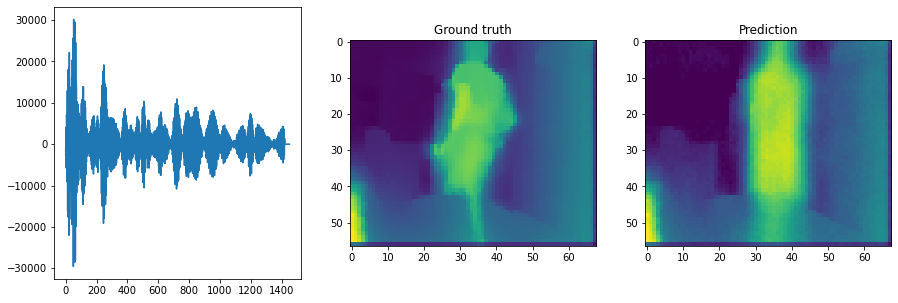

<Figure size 432x288 with 0 Axes>

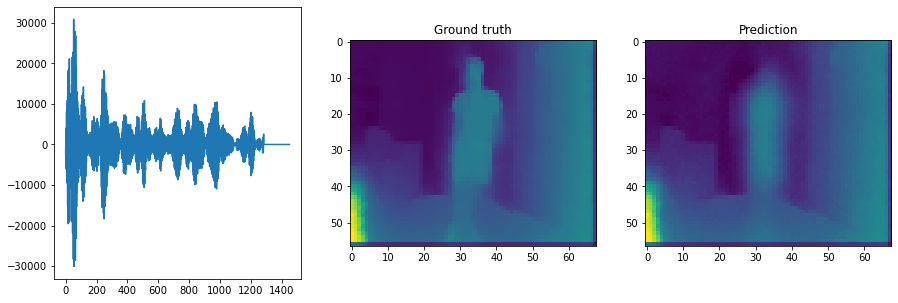

<Figure size 432x288 with 0 Axes>

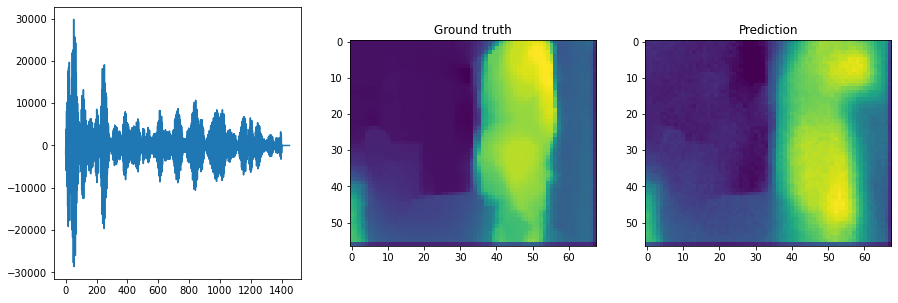

<Figure size 432x288 with 0 Axes>

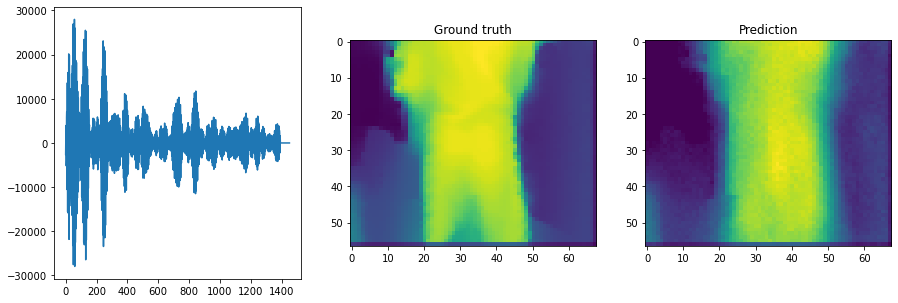

<Figure size 432x288 with 0 Axes>

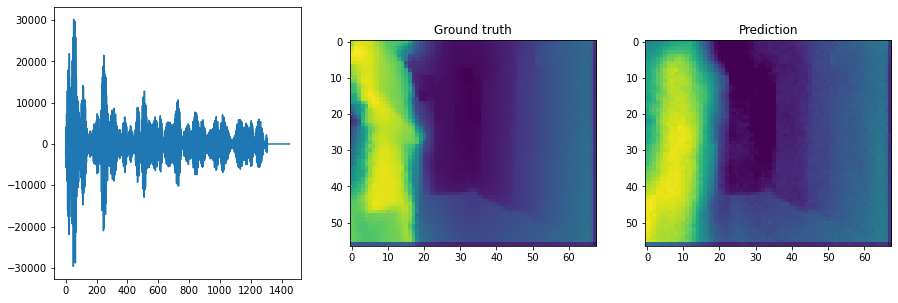

<Figure size 432x288 with 0 Axes>

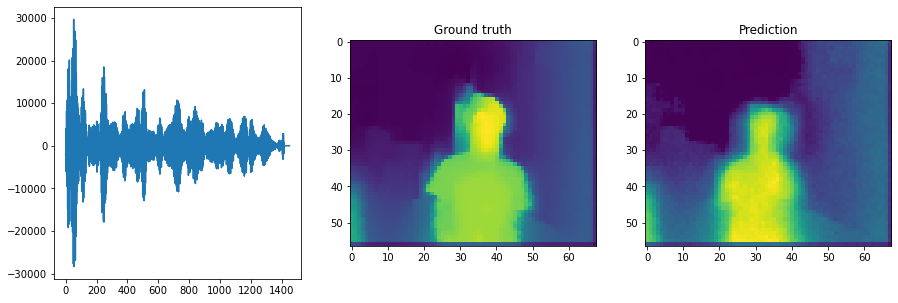

<Figure size 432x288 with 0 Axes>

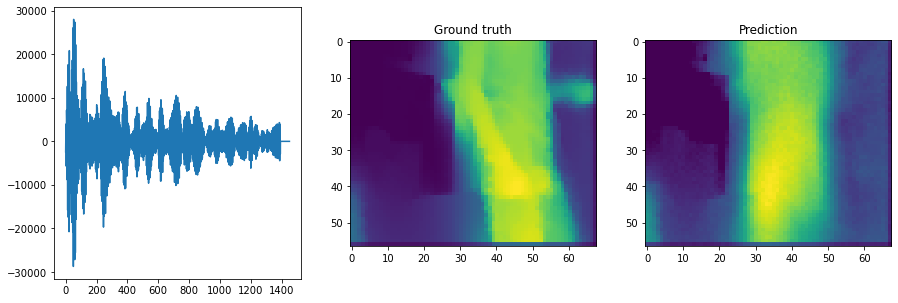

<Figure size 432x288 with 0 Axes>

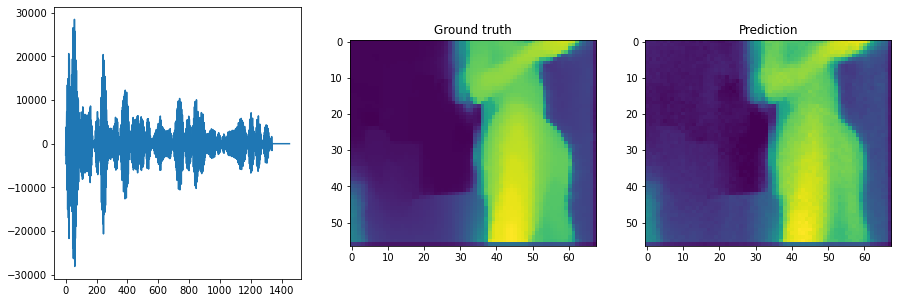

<Figure size 432x288 with 0 Axes>

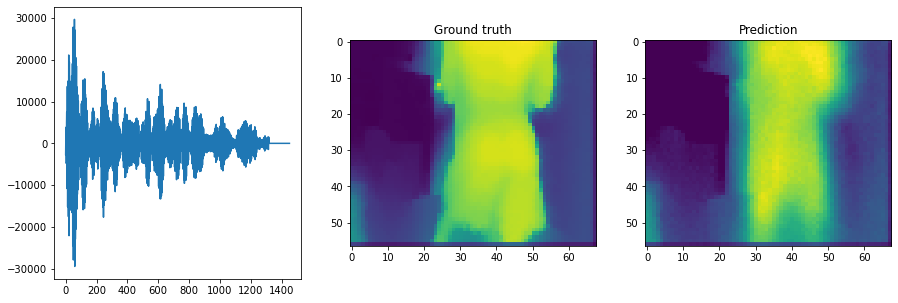

<Figure size 432x288 with 0 Axes>

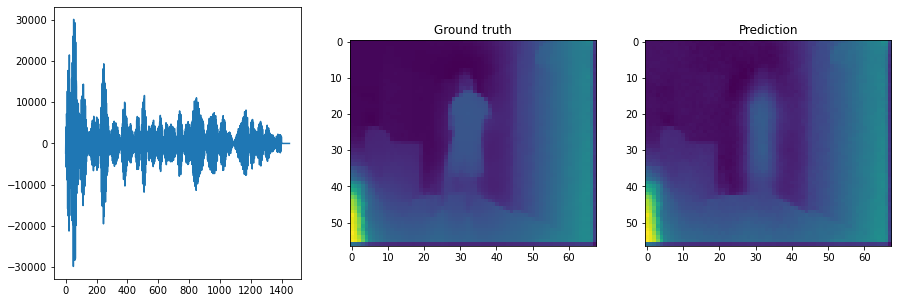

<Figure size 432x288 with 0 Axes>

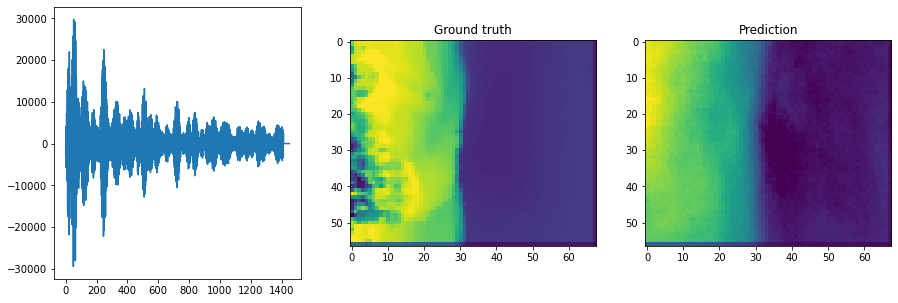

<Figure size 432x288 with 0 Axes>

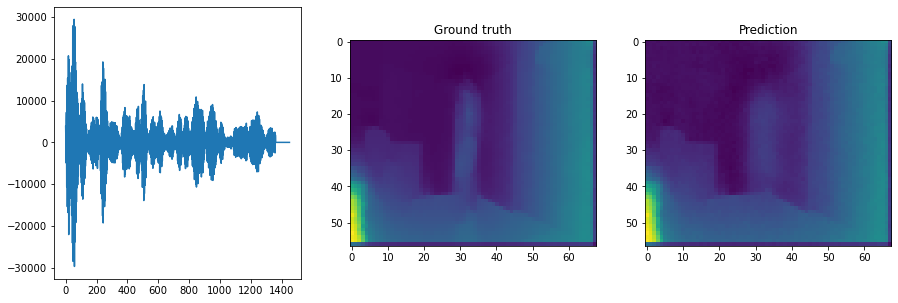

<Figure size 432x288 with 0 Axes>

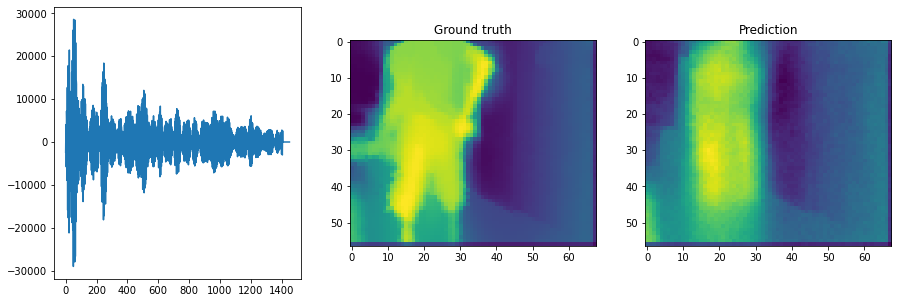

<Figure size 432x288 with 0 Axes>

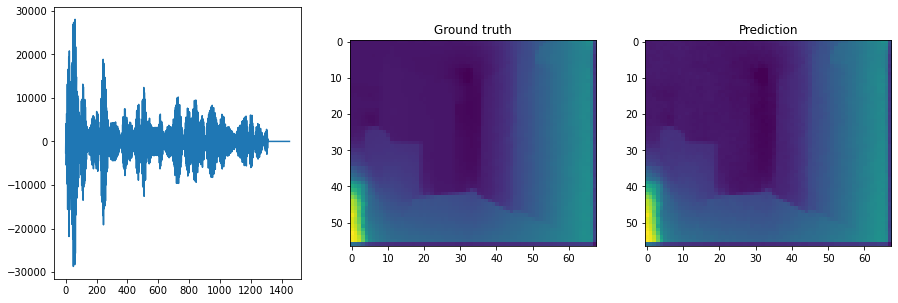

<Figure size 432x288 with 0 Axes>

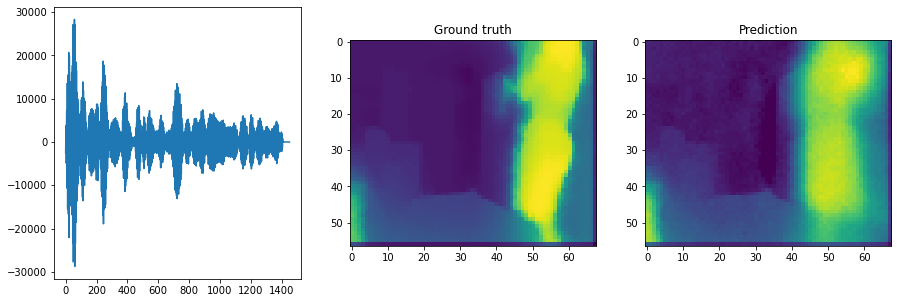

<Figure size 432x288 with 0 Axes>

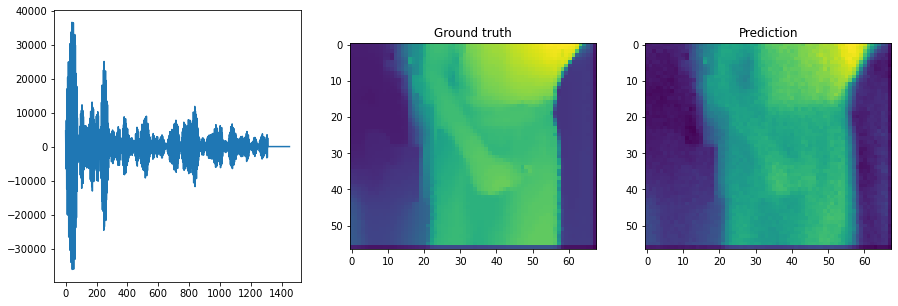



Batch 1 ###############


Batch 2 ###############
Average MSE: 0.019206738099455833; Average SSIM: 0.7161136269569397


<Figure size 432x288 with 0 Axes>

In [10]:
MSE_metric = []
SSIM_metric = []
criterion_MSE = nn.MSELoss()
criterion_SSIM = SSIM(n_channels=1).cuda()

for idx, (audios, images) in enumerate(val_loader):
    audios, images = audios.to(device), images.to(device)
    pred_ims = model(audios)
    MSE_metric.append(criterion_MSE( (pred_ims.unsqueeze(1)-pred_ims.min())/(pred_ims.max()-pred_ims.min()),
                                      (images.unsqueeze(1)-images.min())/(images.max()-images.min())))
    SSIM_metric.append(criterion_SSIM( (pred_ims.unsqueeze(1)-pred_ims.min())/(pred_ims.max()-pred_ims.min()),
                                      (images.unsqueeze(1)-images.min())/(images.max()-images.min())))
    print(f"\n\nBatch {idx} ###############")
    if idx<1:
        for k, (audio, image, pred_image) in enumerate(zip(audios, images, pred_ims)):
            if k>15:
                break
            audio_np = np.array(audio.to('cpu').detach().numpy())
            image_np = np.array(image.to('cpu').detach().numpy())
            pred_image_np = np.array(pred_image.to('cpu').detach().numpy())
            fig, axs = plt.subplots(1,3, figsize=(15,5))
            axs[0].plot(audio_np)
            axs[1].imshow(image_np)
            axs[1].set_title("Ground truth")
            axs[2].imshow(pred_image_np)
            axs[2].set_title("Prediction")
            plt.show()
            plt.clf()
print(f"Average MSE: {torch.mean(torch.tensor(MSE_metric))}; Average SSIM: {torch.mean(torch.tensor(SSIM_metric))}")



Batch 0 ###############
MSE 92.52777862548828


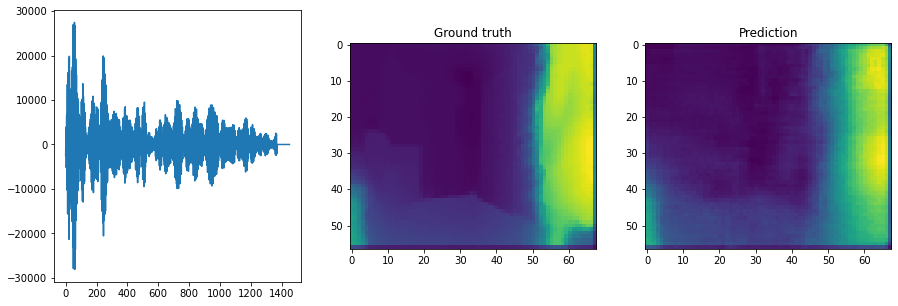

MSE 147.51295471191406


<Figure size 432x288 with 0 Axes>

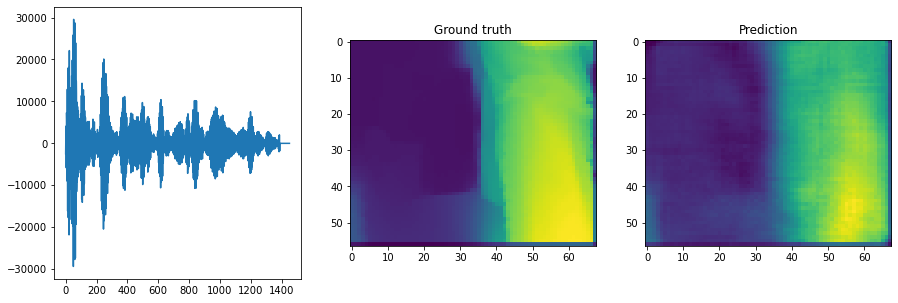

MSE 51.31467819213867


<Figure size 432x288 with 0 Axes>

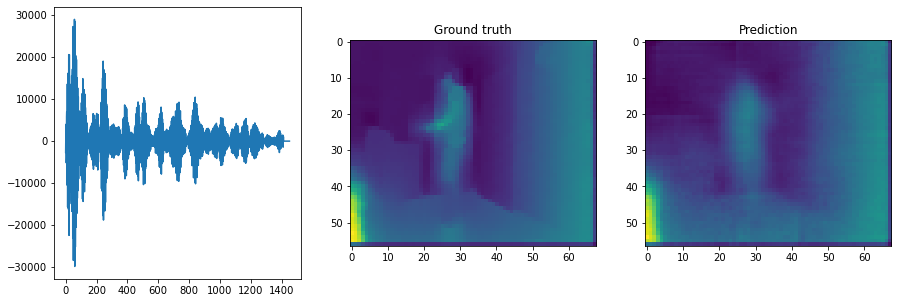

MSE 255.7881317138672


<Figure size 432x288 with 0 Axes>

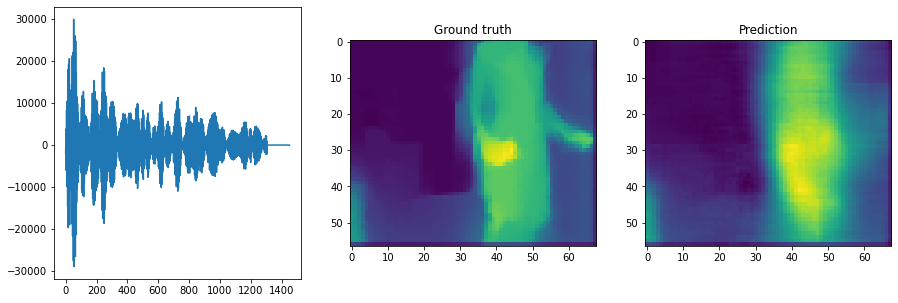

MSE 57.79485321044922


<Figure size 432x288 with 0 Axes>

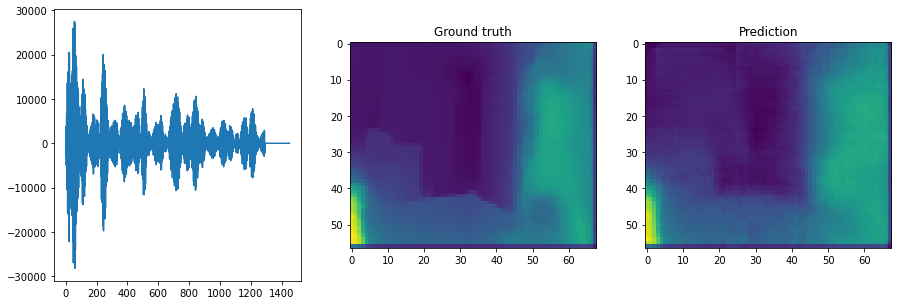

MSE 135.7609405517578


<Figure size 432x288 with 0 Axes>

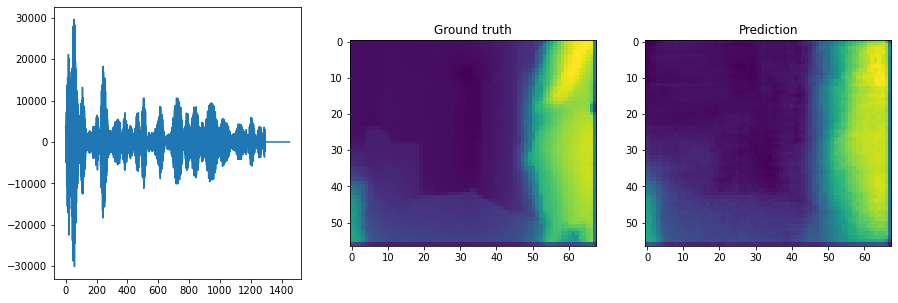

MSE 278.53753662109375


<Figure size 432x288 with 0 Axes>

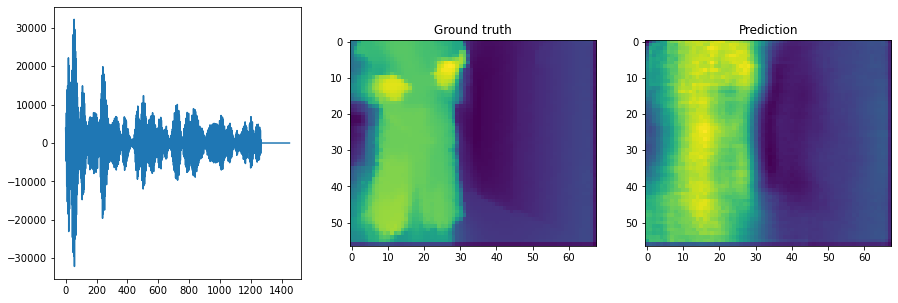

MSE 43.651756286621094


<Figure size 432x288 with 0 Axes>

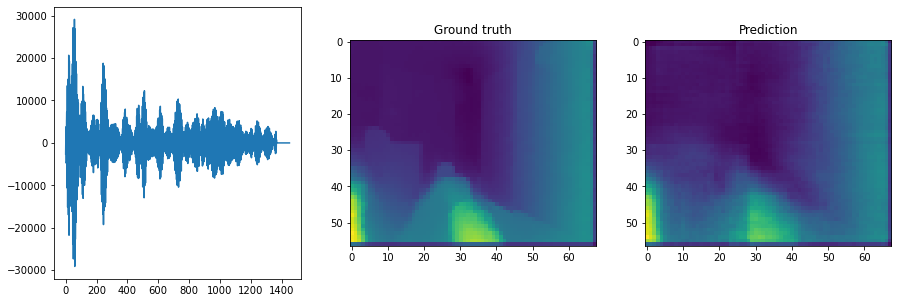

MSE 301.8179931640625


<Figure size 432x288 with 0 Axes>

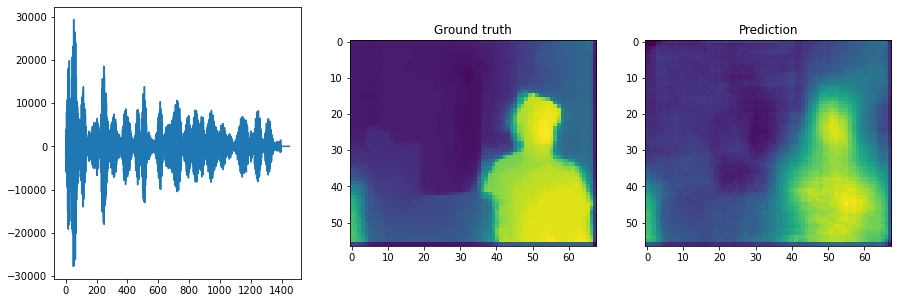

MSE 14.140305519104004


<Figure size 432x288 with 0 Axes>

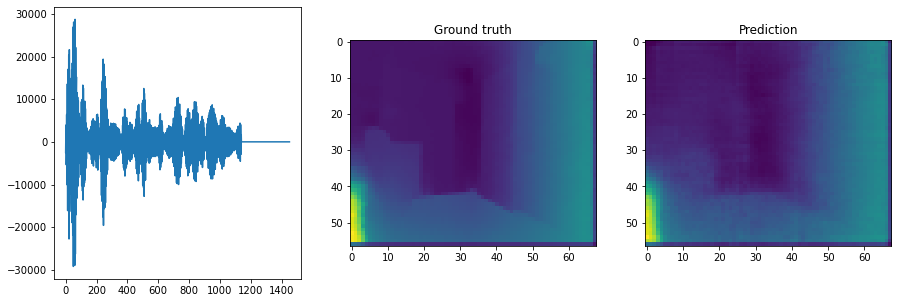

MSE 13.175681114196777


<Figure size 432x288 with 0 Axes>

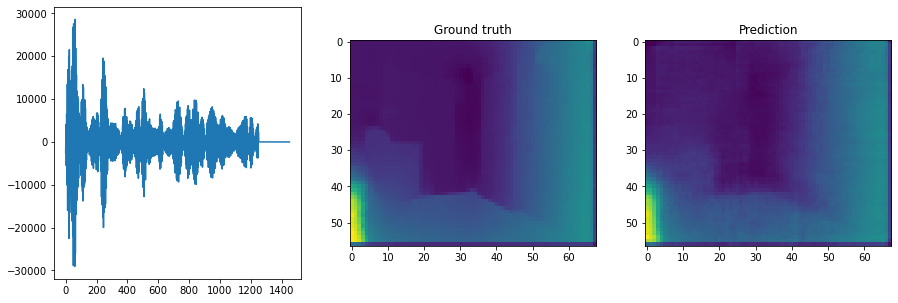

MSE 271.2322692871094


<Figure size 432x288 with 0 Axes>

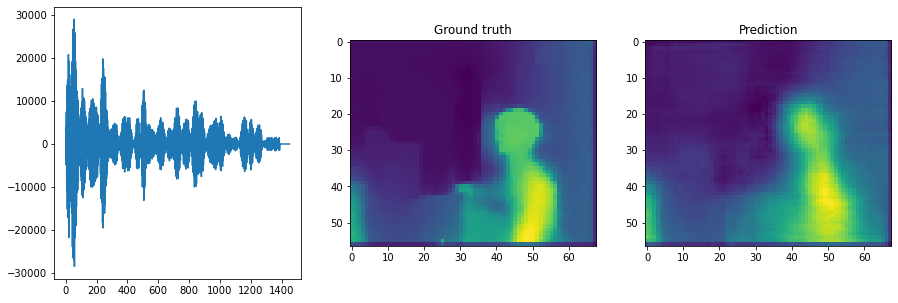

MSE 368.79473876953125


<Figure size 432x288 with 0 Axes>

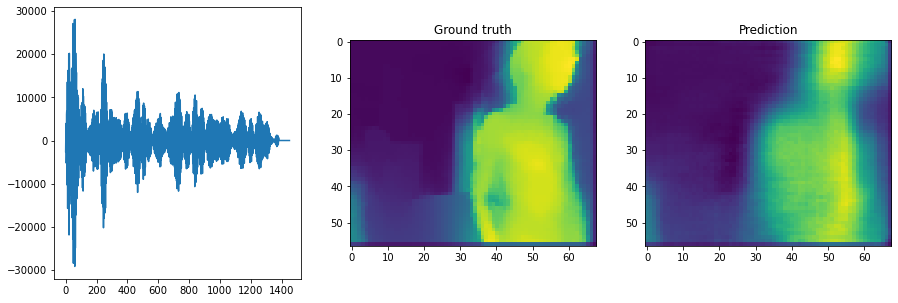

MSE 158.30770874023438


<Figure size 432x288 with 0 Axes>

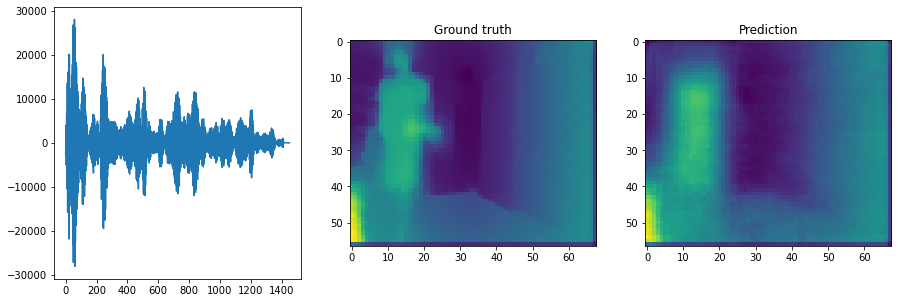

MSE 42.73354721069336


<Figure size 432x288 with 0 Axes>

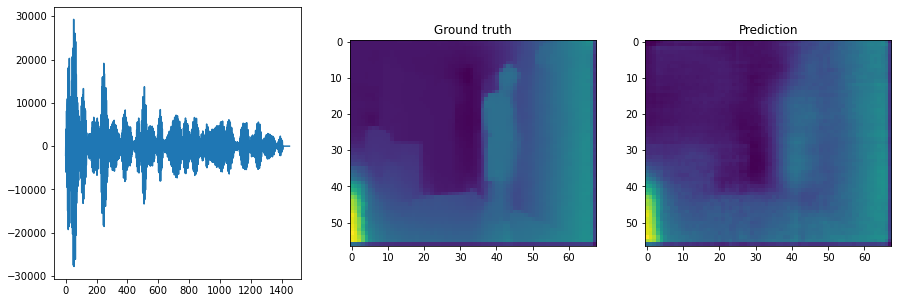

MSE 326.77142333984375


<Figure size 432x288 with 0 Axes>

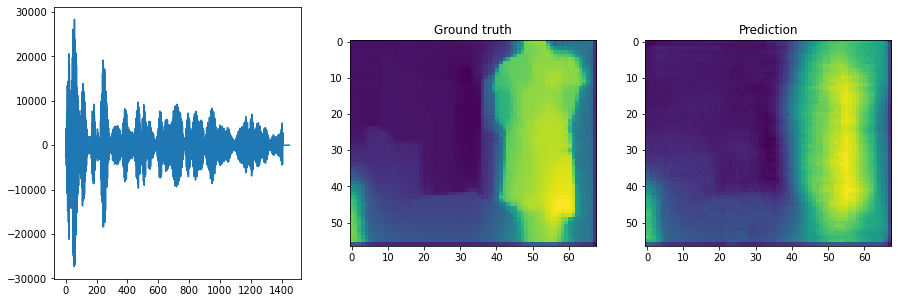

MSE 579.19384765625


<Figure size 432x288 with 0 Axes>

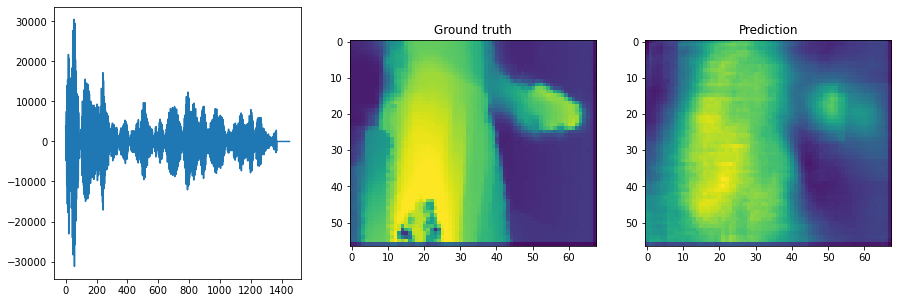

MSE 423.03790283203125


<Figure size 432x288 with 0 Axes>

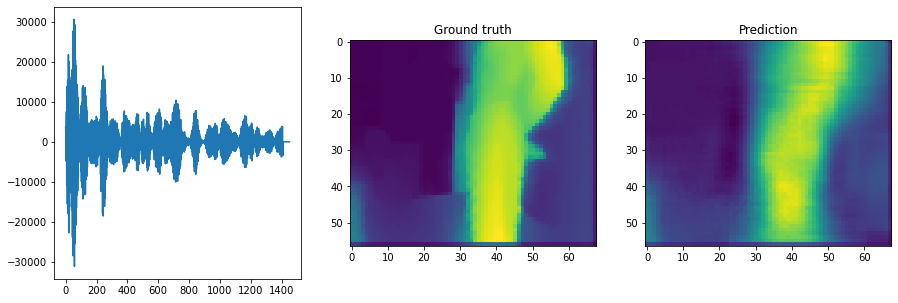

MSE 410.4212341308594


<Figure size 432x288 with 0 Axes>

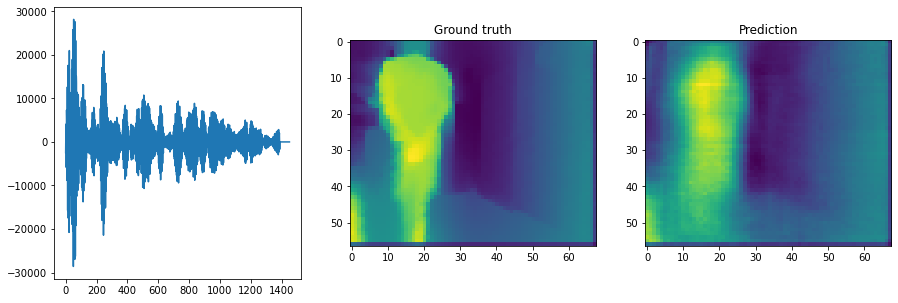

MSE 513.9331665039062


<Figure size 432x288 with 0 Axes>

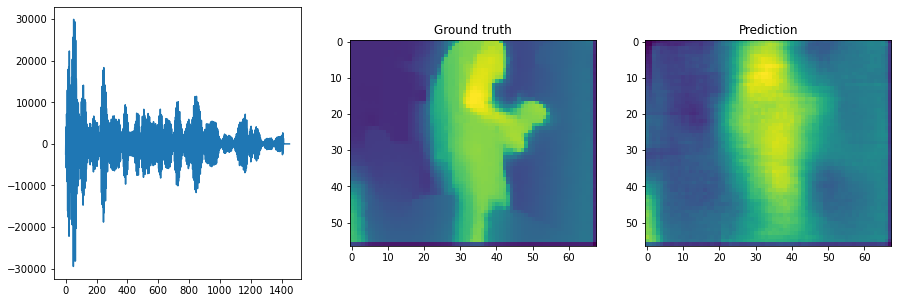

MSE 259.9789123535156


<Figure size 432x288 with 0 Axes>

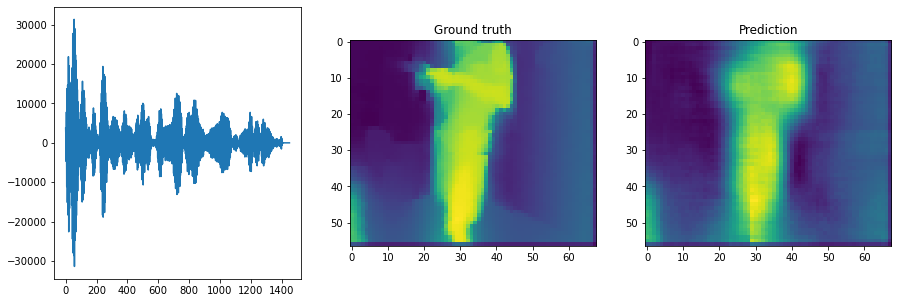

MSE 395.9114685058594


<Figure size 432x288 with 0 Axes>

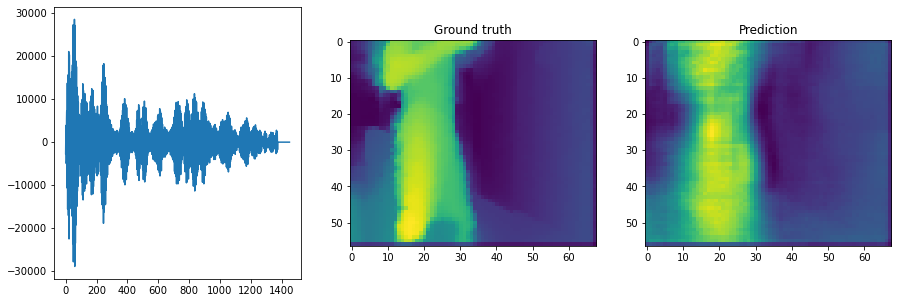

MSE 481.8166198730469


<Figure size 432x288 with 0 Axes>

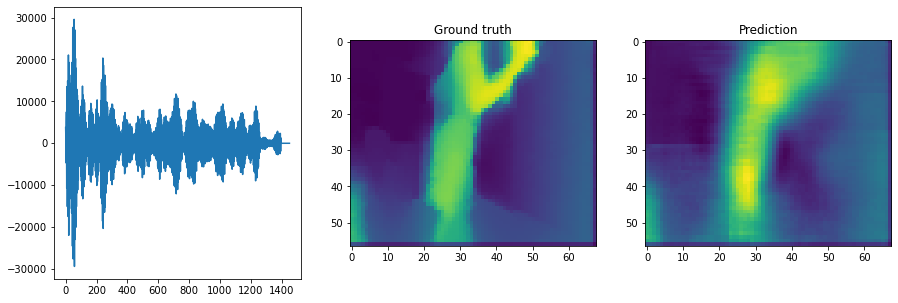

MSE 244.96875


<Figure size 432x288 with 0 Axes>

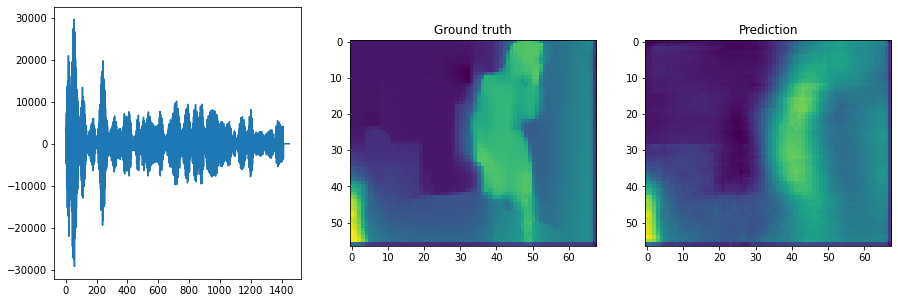

MSE 185.6793212890625


<Figure size 432x288 with 0 Axes>

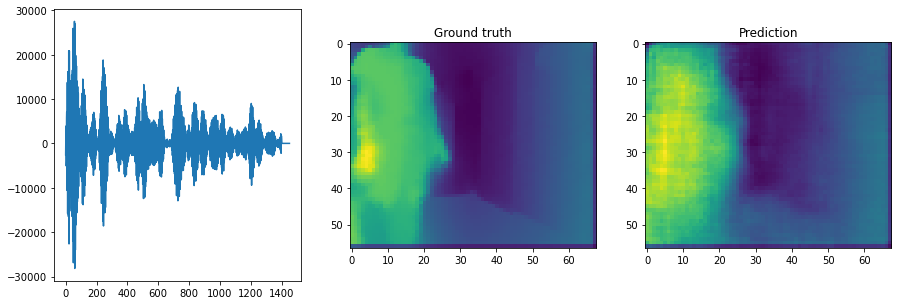

MSE 29.999252319335938


<Figure size 432x288 with 0 Axes>

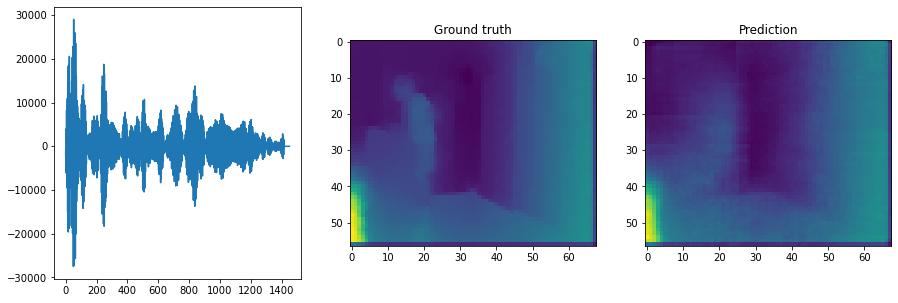

MSE 388.4657287597656


<Figure size 432x288 with 0 Axes>

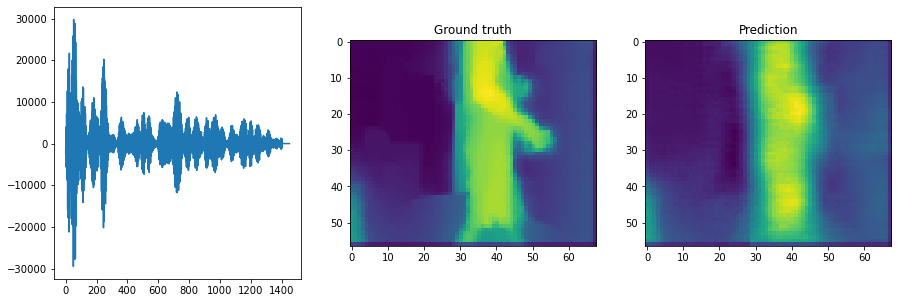

MSE 14.753925323486328


<Figure size 432x288 with 0 Axes>

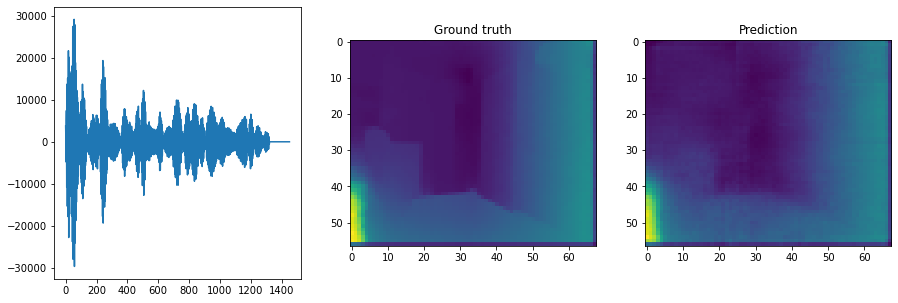

MSE 165.21824645996094


<Figure size 432x288 with 0 Axes>

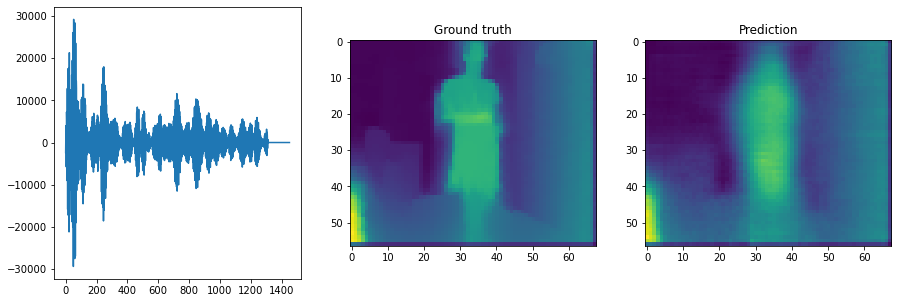

MSE 69.01341247558594


<Figure size 432x288 with 0 Axes>

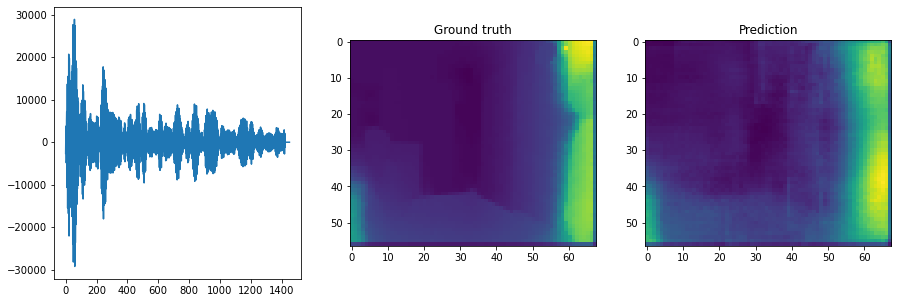

MSE 555.5458984375


<Figure size 432x288 with 0 Axes>

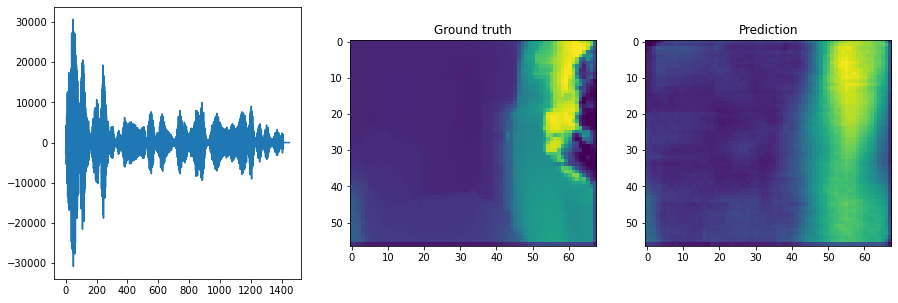

MSE 288.4869079589844


<Figure size 432x288 with 0 Axes>

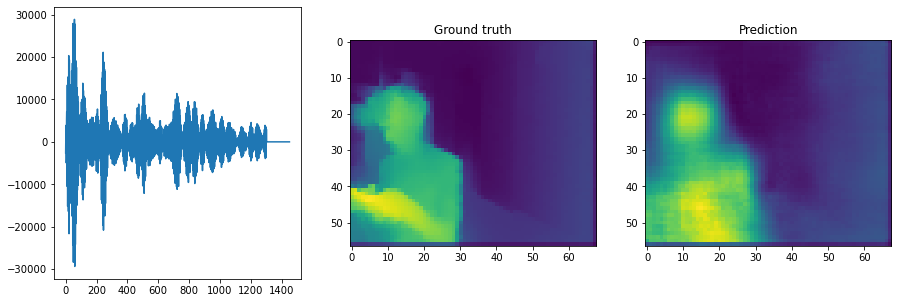

MSE 264.4909362792969


<Figure size 432x288 with 0 Axes>

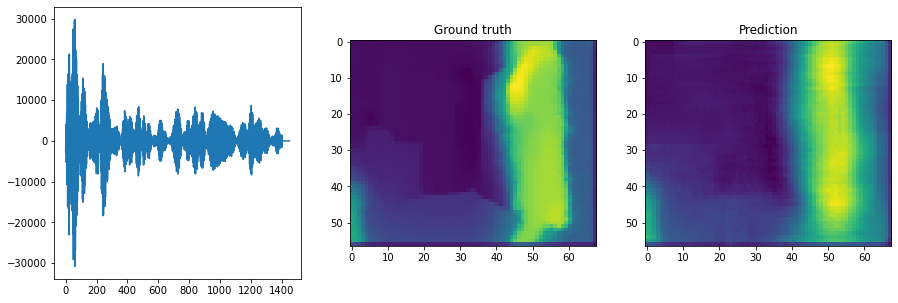

MSE 378.387451171875


<Figure size 432x288 with 0 Axes>

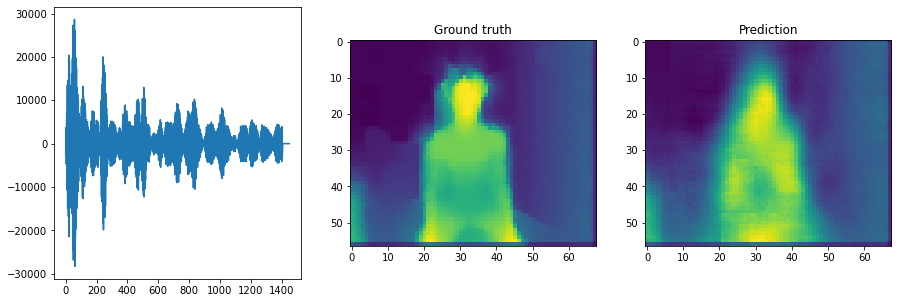

MSE 814.4099731445312


<Figure size 432x288 with 0 Axes>

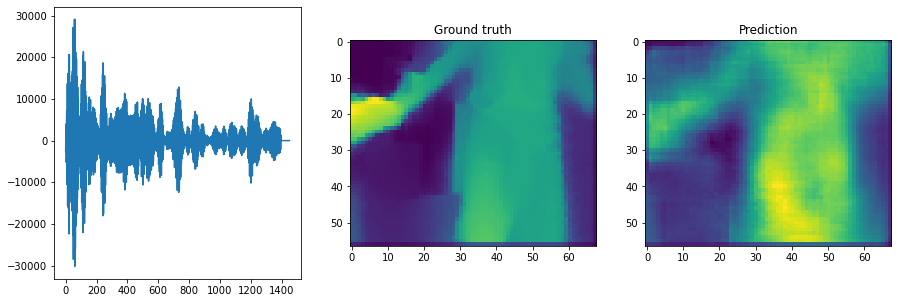

MSE 315.2743225097656


<Figure size 432x288 with 0 Axes>

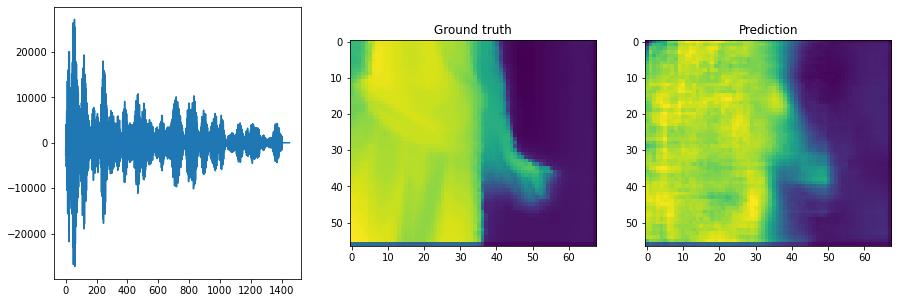

MSE 66.3089828491211


<Figure size 432x288 with 0 Axes>

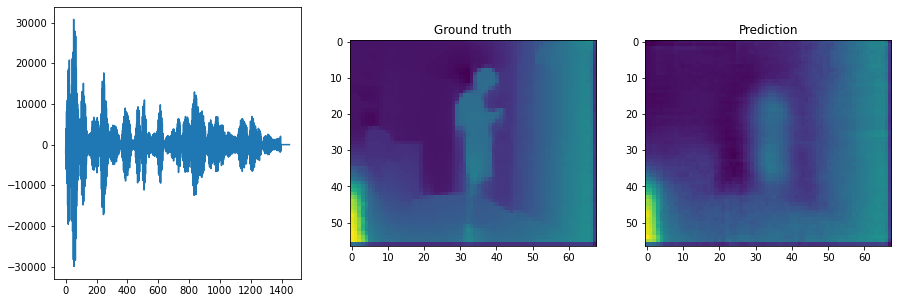

MSE 327.6087341308594


<Figure size 432x288 with 0 Axes>

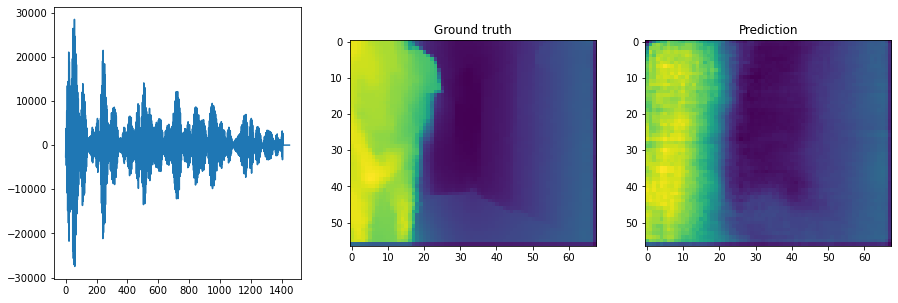

MSE 388.2209167480469


<Figure size 432x288 with 0 Axes>

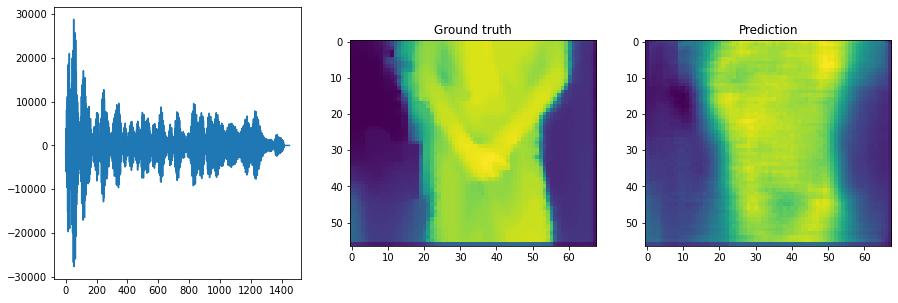

MSE 310.253662109375


<Figure size 432x288 with 0 Axes>

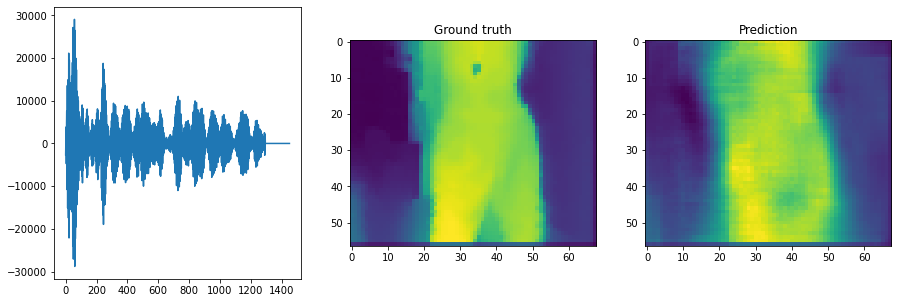

MSE 491.4166564941406


<Figure size 432x288 with 0 Axes>

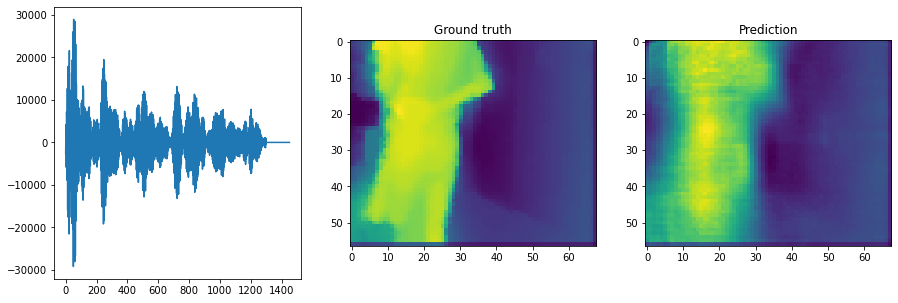

MSE 262.1675109863281


<Figure size 432x288 with 0 Axes>

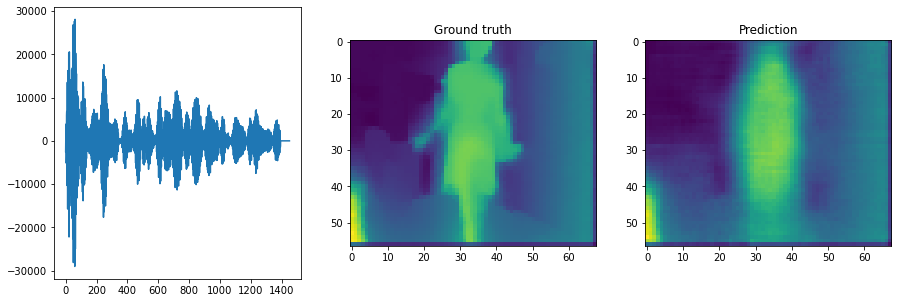

MSE 282.5532531738281


<Figure size 432x288 with 0 Axes>

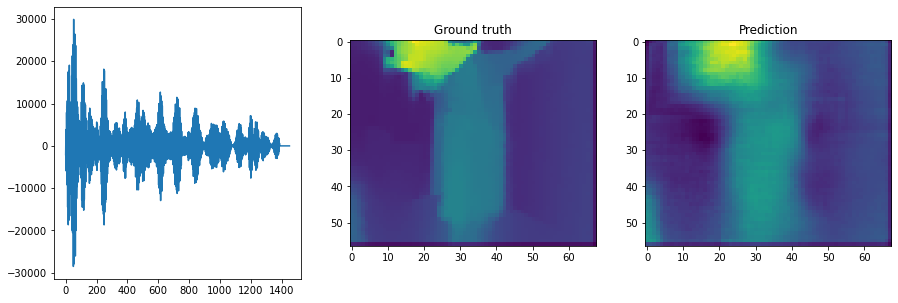

MSE 260.3789367675781


<Figure size 432x288 with 0 Axes>

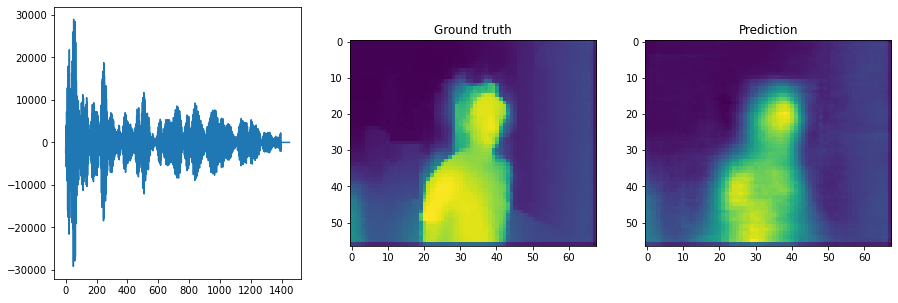

MSE 67.87808227539062


<Figure size 432x288 with 0 Axes>

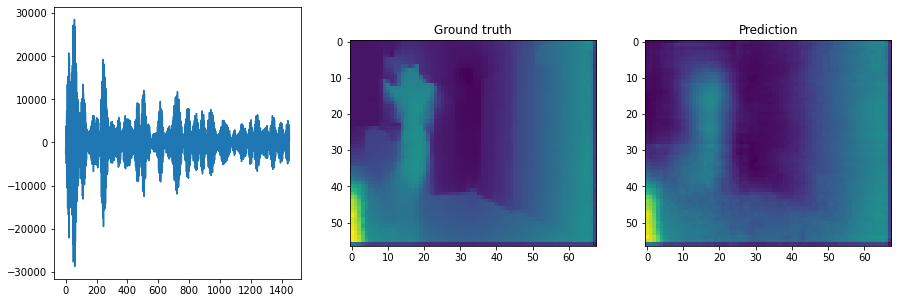

MSE 24.875917434692383


<Figure size 432x288 with 0 Axes>

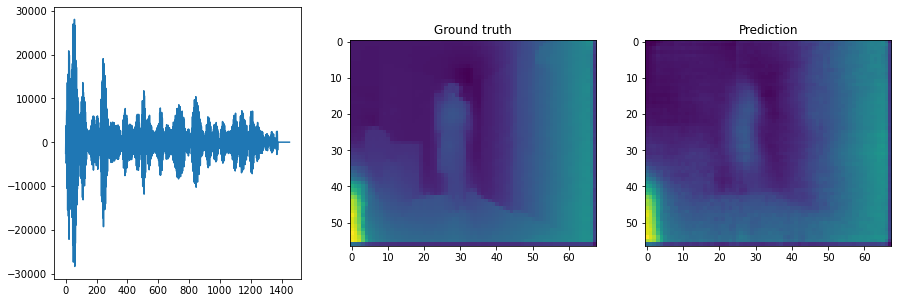

MSE 375.2893981933594


<Figure size 432x288 with 0 Axes>

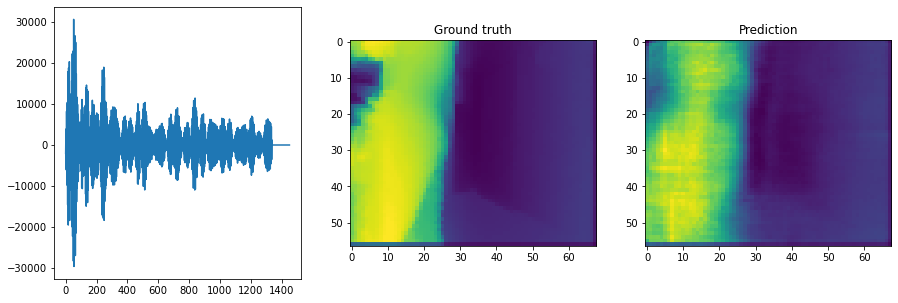

MSE 298.14404296875


<Figure size 432x288 with 0 Axes>

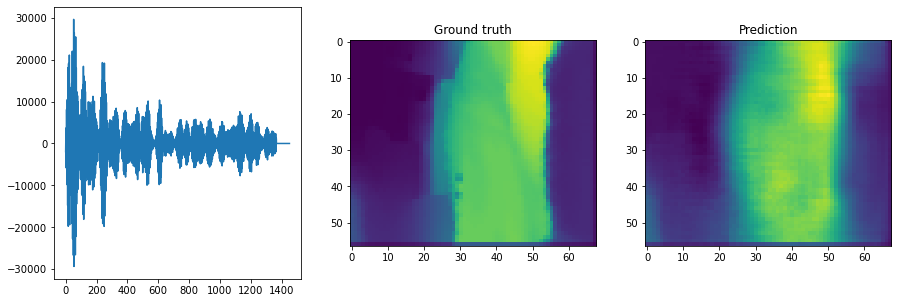

MSE 157.38877868652344


<Figure size 432x288 with 0 Axes>

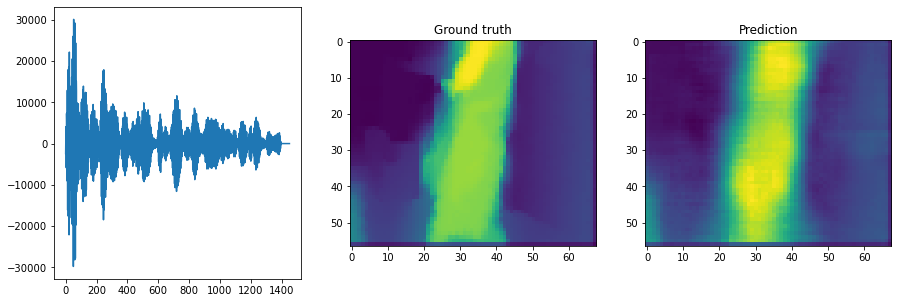

MSE 281.6022033691406


<Figure size 432x288 with 0 Axes>

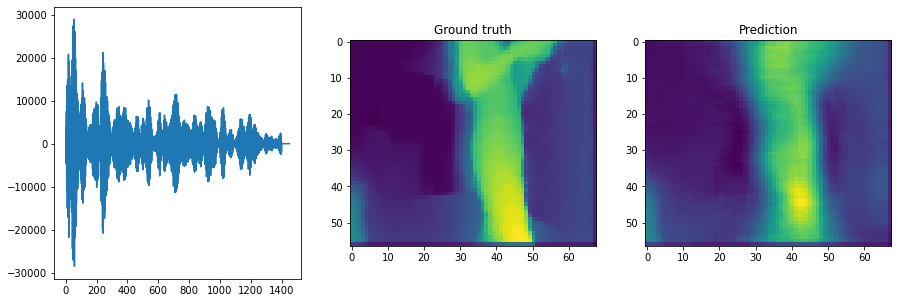

MSE 215.34506225585938


<Figure size 432x288 with 0 Axes>

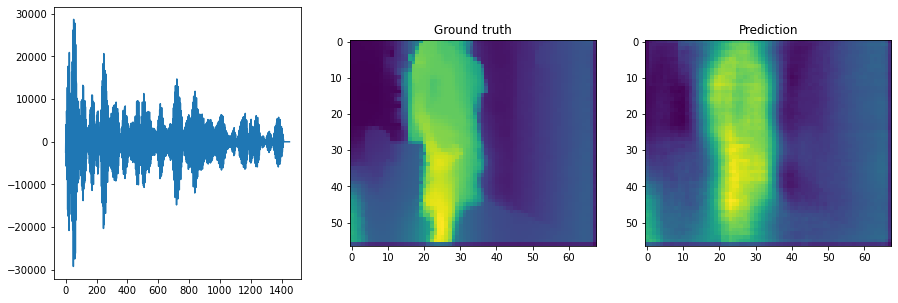

MSE 212.60984802246094


<Figure size 432x288 with 0 Axes>

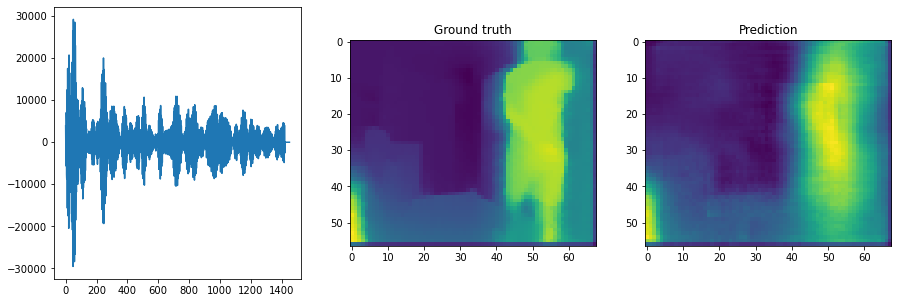

MSE 230.03794860839844


<Figure size 432x288 with 0 Axes>

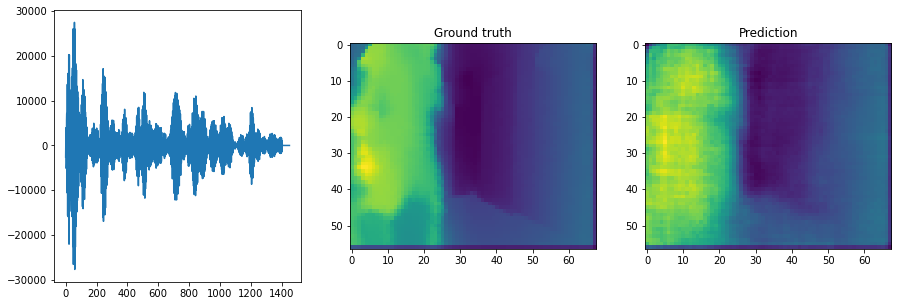

MSE 310.86102294921875


<Figure size 432x288 with 0 Axes>

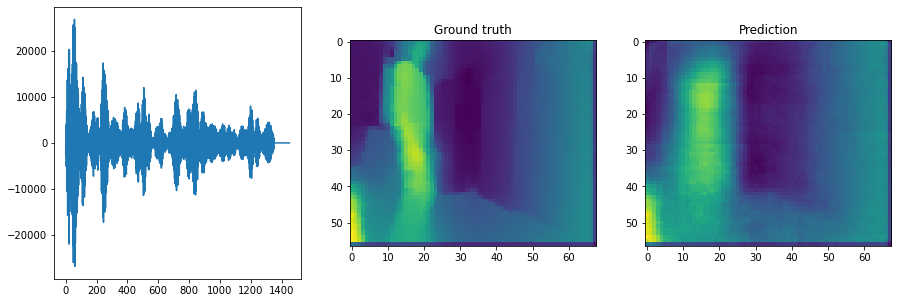

MSE 119.06095886230469


<Figure size 432x288 with 0 Axes>

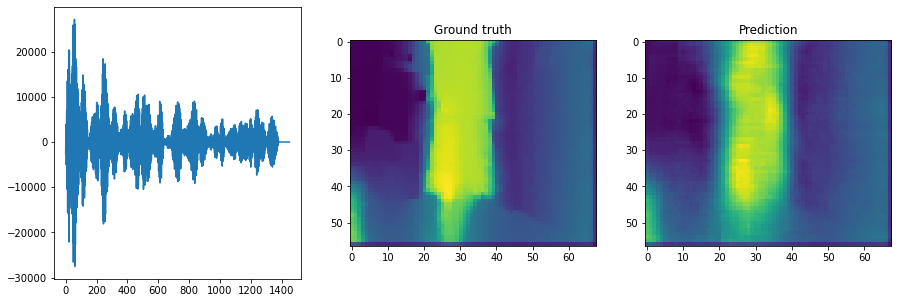

MSE 37.741607666015625


<Figure size 432x288 with 0 Axes>

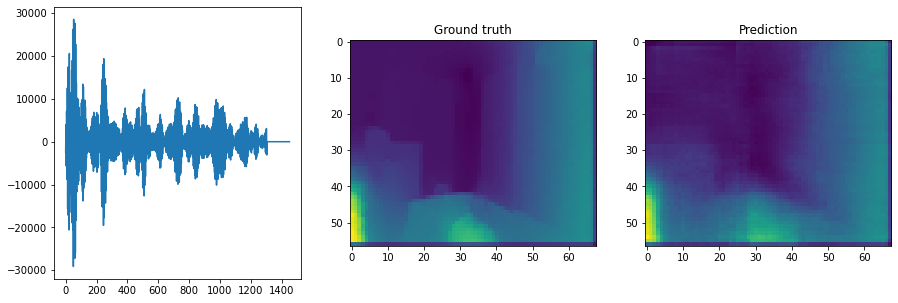

MSE 304.10626220703125


<Figure size 432x288 with 0 Axes>

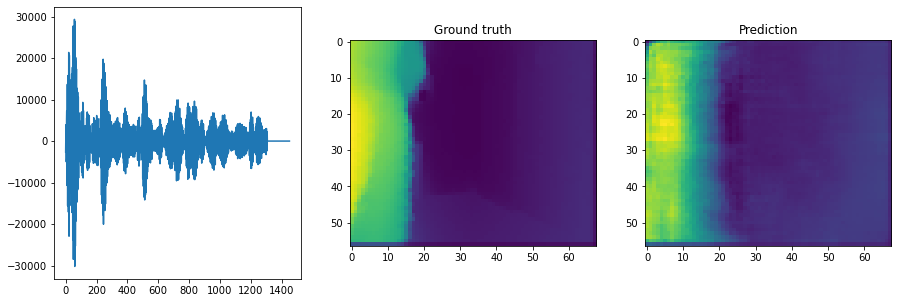

MSE 29.54731559753418


<Figure size 432x288 with 0 Axes>

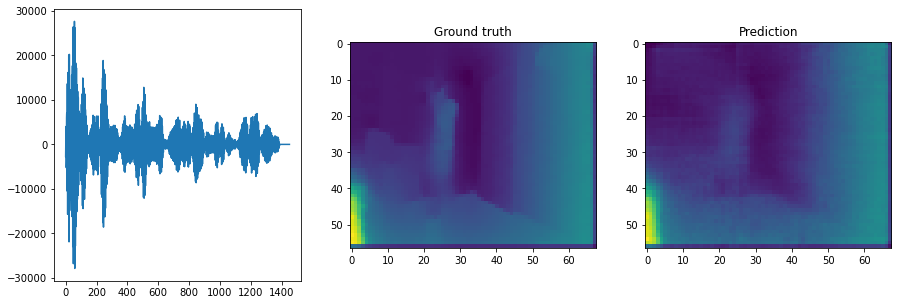

MSE 29.104202270507812


<Figure size 432x288 with 0 Axes>

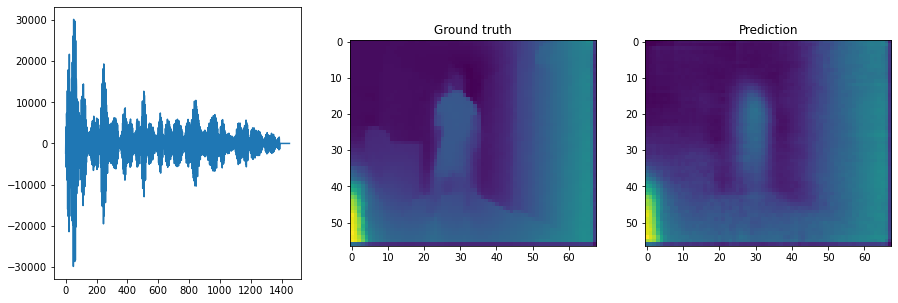

MSE 288.76123046875


<Figure size 432x288 with 0 Axes>

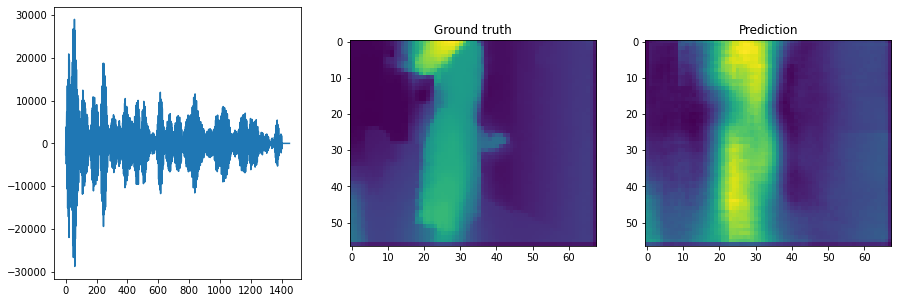

MSE 285.2620849609375


<Figure size 432x288 with 0 Axes>

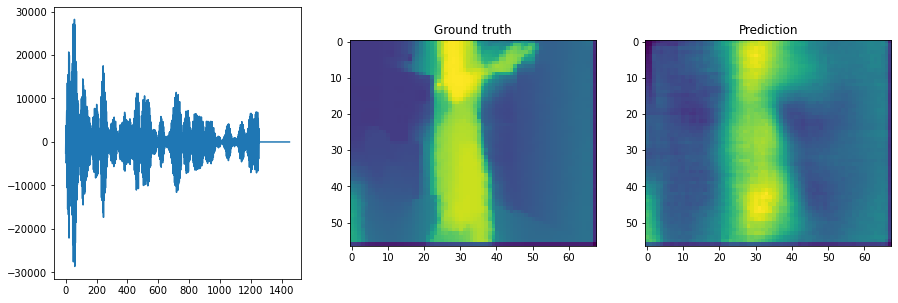

MSE 20.447246551513672


<Figure size 432x288 with 0 Axes>

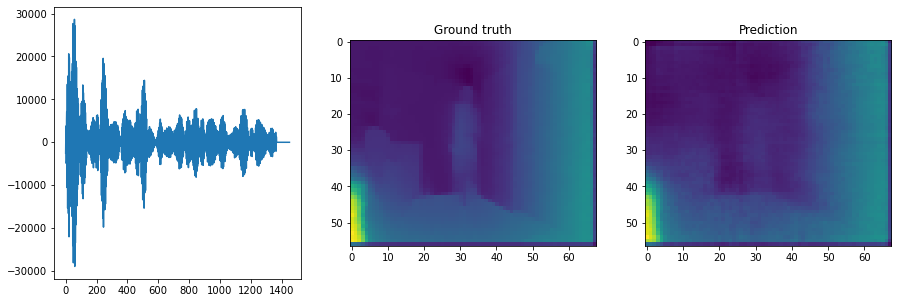

MSE 349.2268981933594


<Figure size 432x288 with 0 Axes>

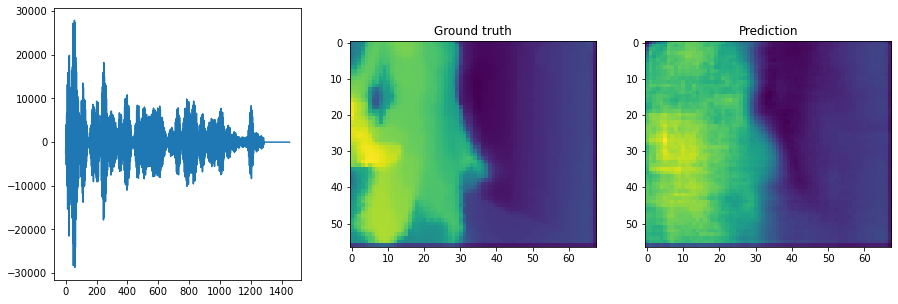

MSE 181.12020874023438


<Figure size 432x288 with 0 Axes>

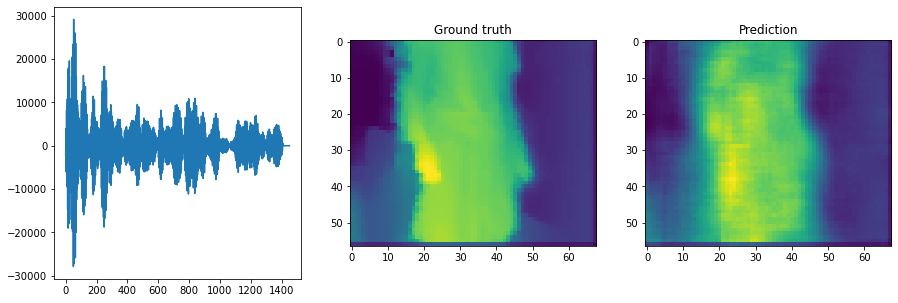

MSE 135.0850067138672


<Figure size 432x288 with 0 Axes>

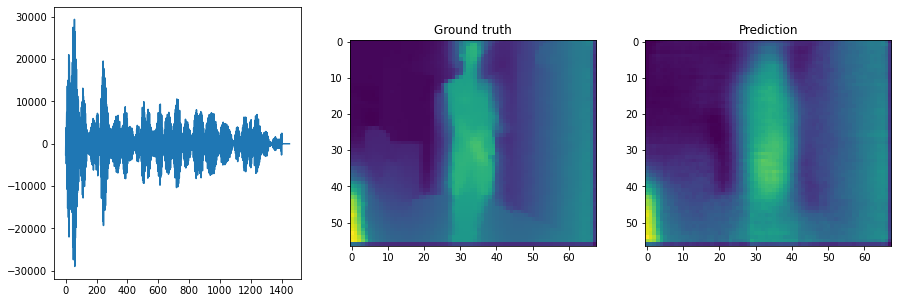

MSE 25.221899032592773


<Figure size 432x288 with 0 Axes>

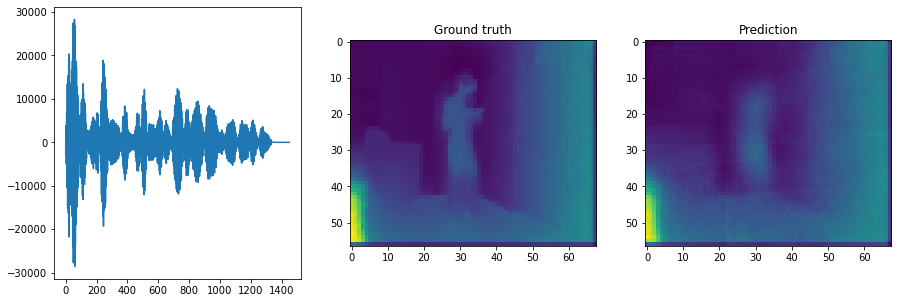

MSE 206.9199676513672


<Figure size 432x288 with 0 Axes>

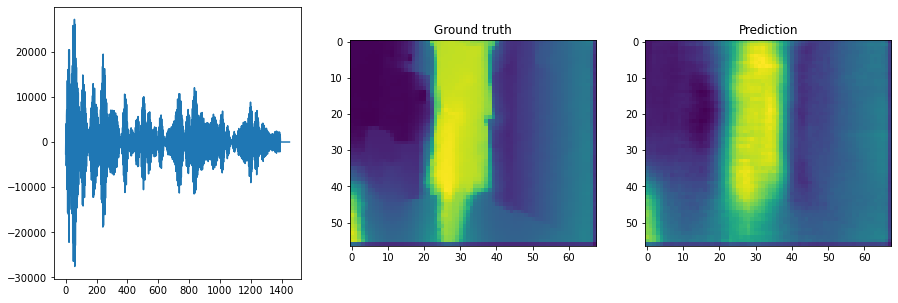

MSE 238.3360137939453


<Figure size 432x288 with 0 Axes>

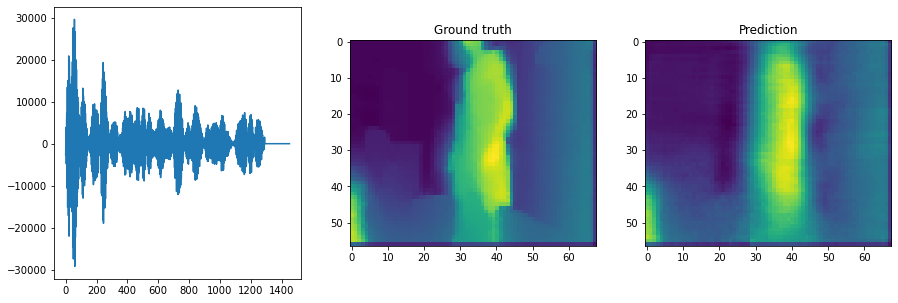

MSE 275.1924133300781


<Figure size 432x288 with 0 Axes>

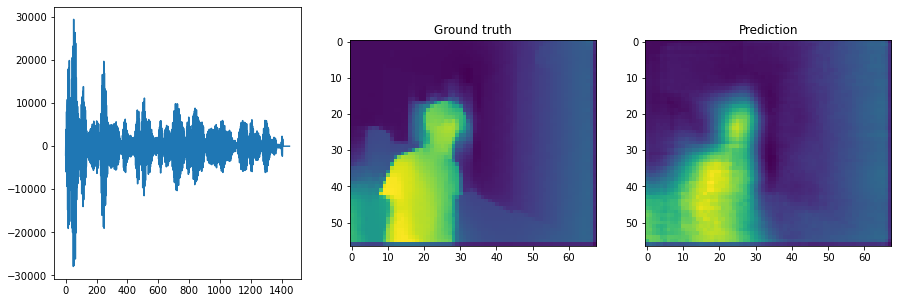

MSE 495.7991027832031


<Figure size 432x288 with 0 Axes>

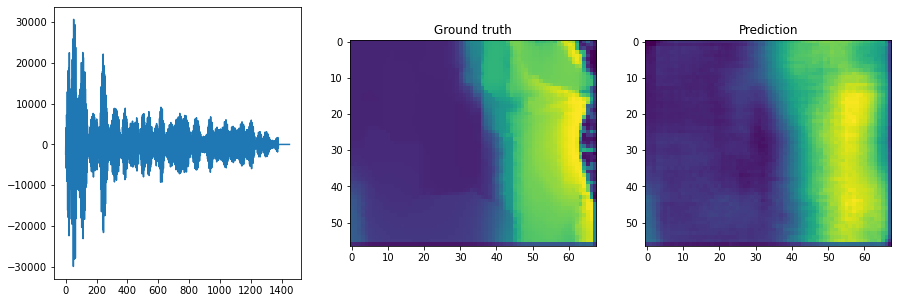

MSE 266.92156982421875


<Figure size 432x288 with 0 Axes>

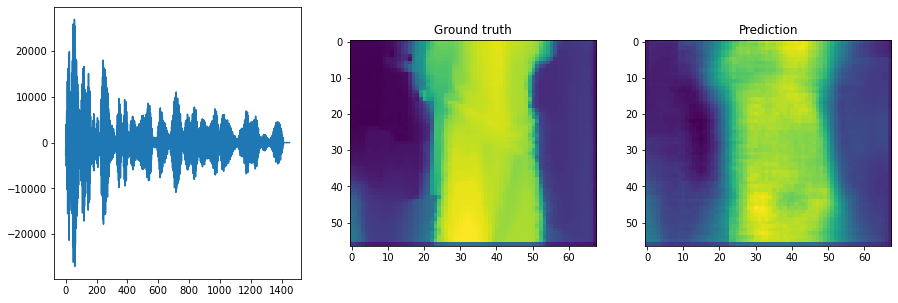

MSE 216.09483337402344


<Figure size 432x288 with 0 Axes>

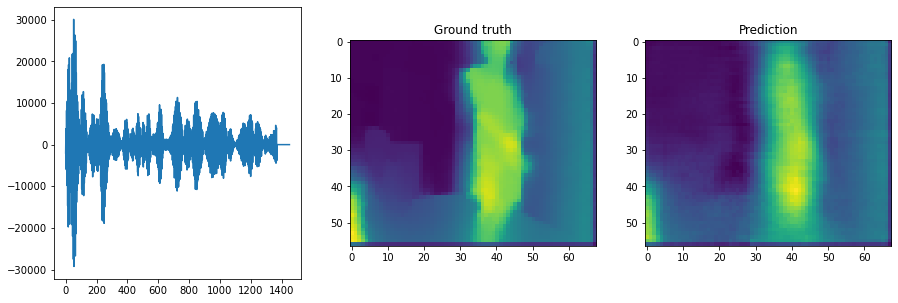

MSE 17.370285034179688


<Figure size 432x288 with 0 Axes>

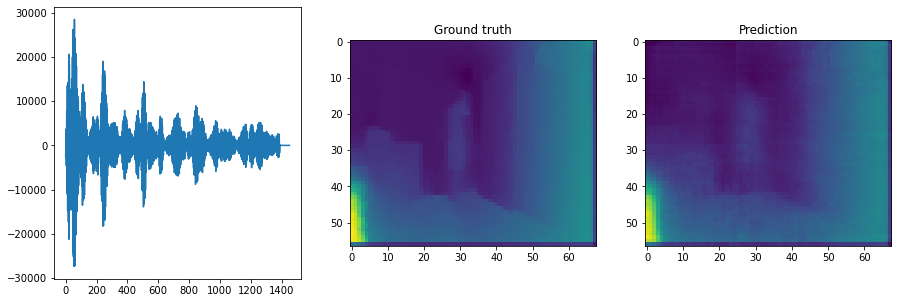

MSE 122.84622955322266


<Figure size 432x288 with 0 Axes>

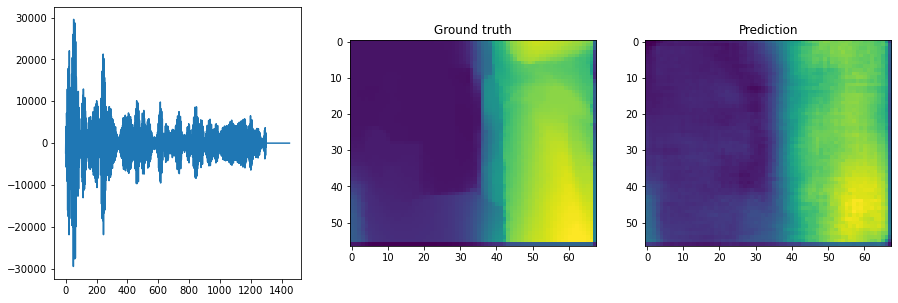

MSE 15.553110122680664


<Figure size 432x288 with 0 Axes>

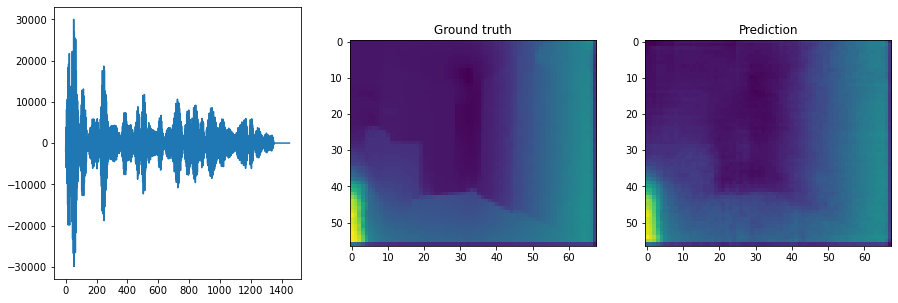

MSE 26.345998764038086


<Figure size 432x288 with 0 Axes>

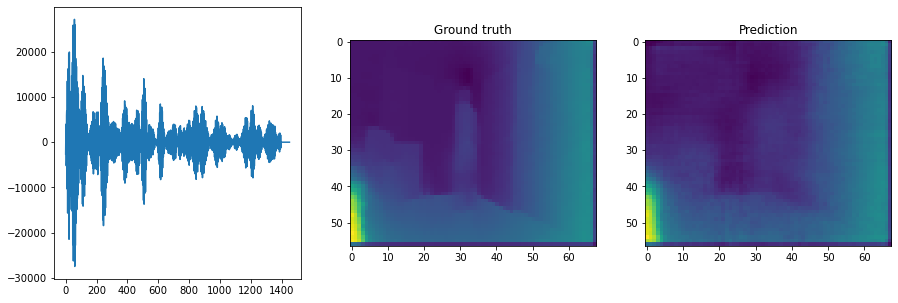

MSE 133.70272827148438


<Figure size 432x288 with 0 Axes>

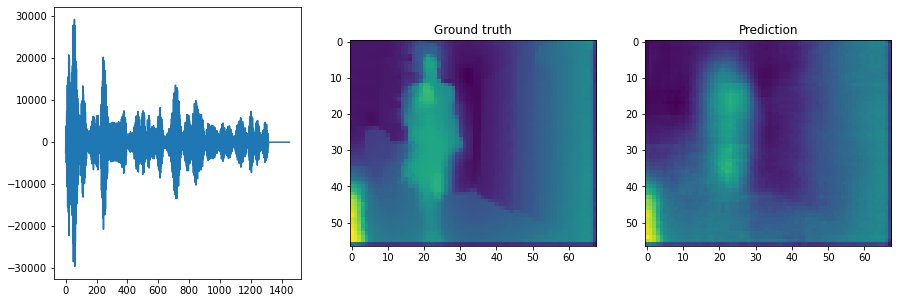

MSE 12.970715522766113


<Figure size 432x288 with 0 Axes>

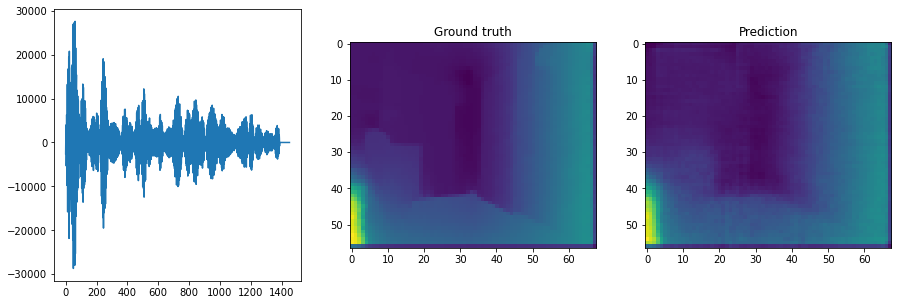

MSE 78.32592010498047


<Figure size 432x288 with 0 Axes>

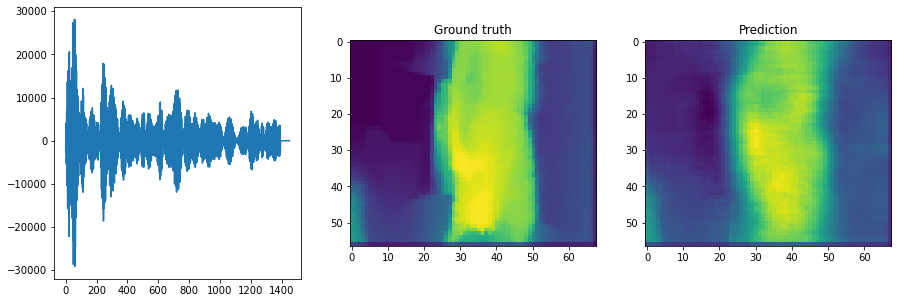

MSE 65.38092803955078


<Figure size 432x288 with 0 Axes>

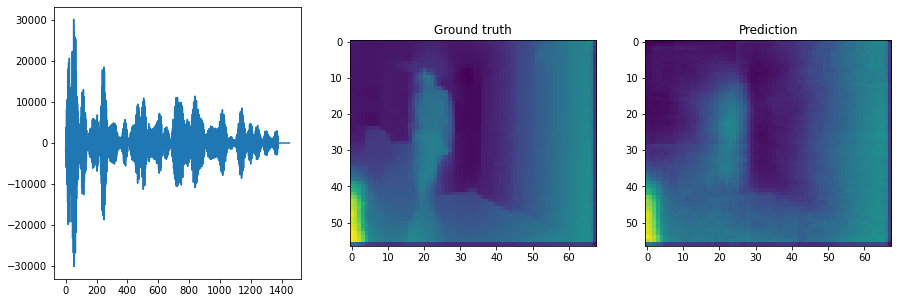

MSE 181.71937561035156


<Figure size 432x288 with 0 Axes>

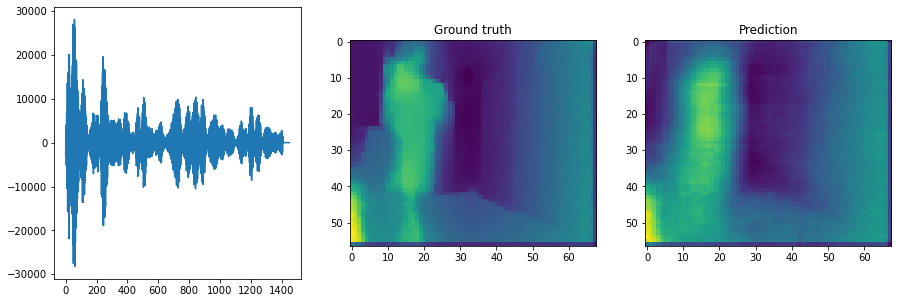

MSE 76.72539520263672


<Figure size 432x288 with 0 Axes>

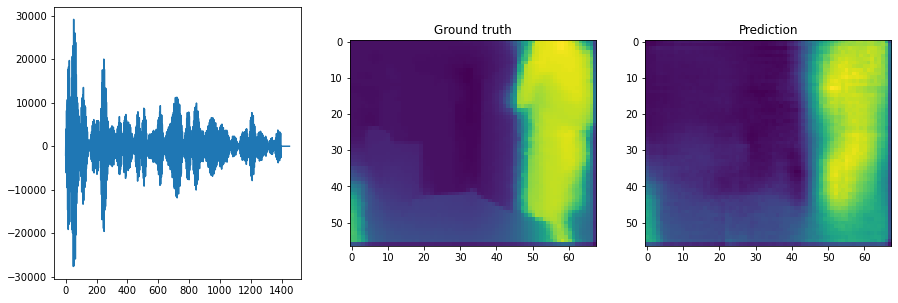

MSE 213.41409301757812


<Figure size 432x288 with 0 Axes>

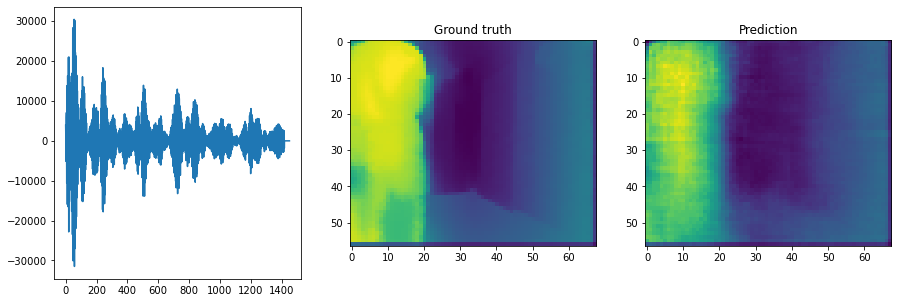

MSE 212.8271026611328


<Figure size 432x288 with 0 Axes>

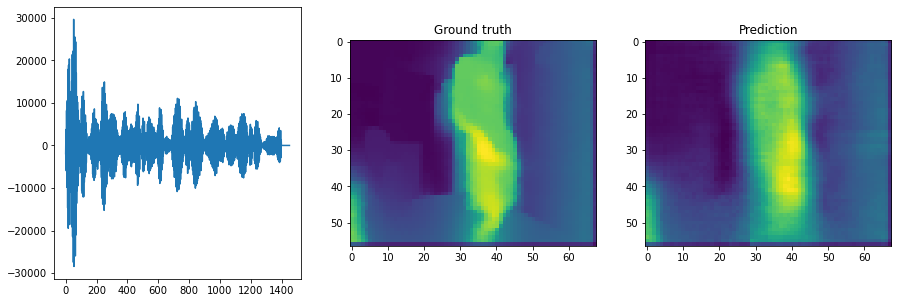

MSE 20.628803253173828


<Figure size 432x288 with 0 Axes>

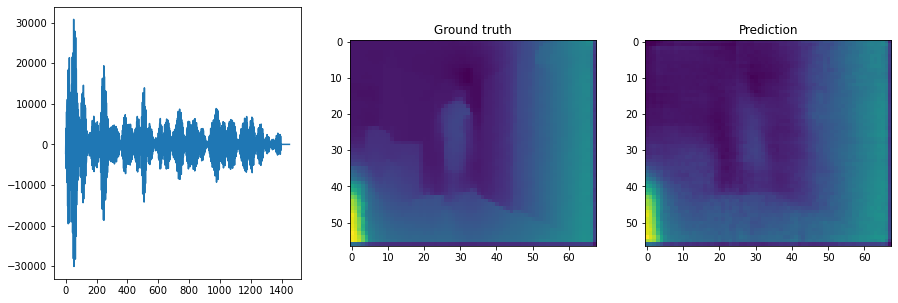

MSE 247.3412322998047


<Figure size 432x288 with 0 Axes>

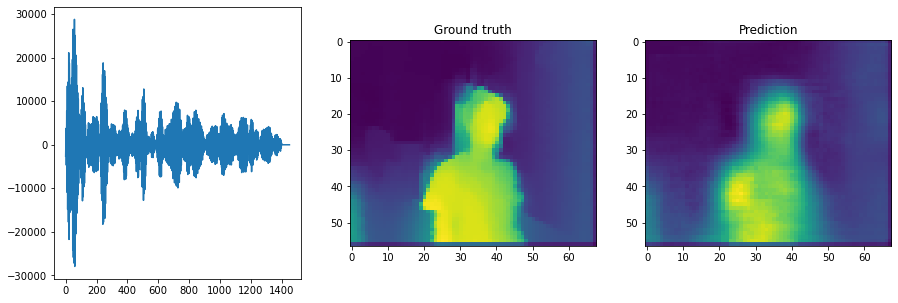

MSE 125.11199188232422


<Figure size 432x288 with 0 Axes>

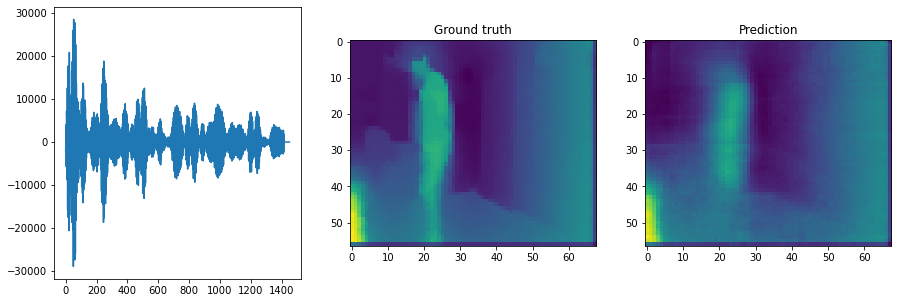

MSE 261.0765075683594


<Figure size 432x288 with 0 Axes>

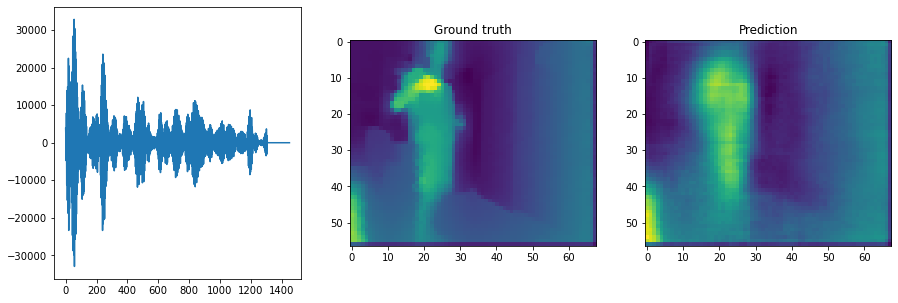

MSE 259.9001770019531


<Figure size 432x288 with 0 Axes>

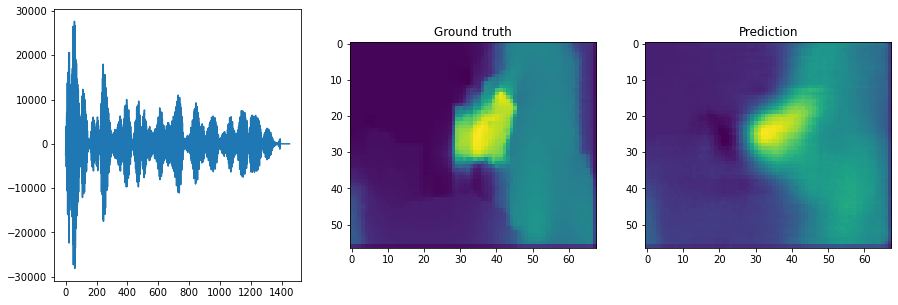

MSE 25.124916076660156


<Figure size 432x288 with 0 Axes>

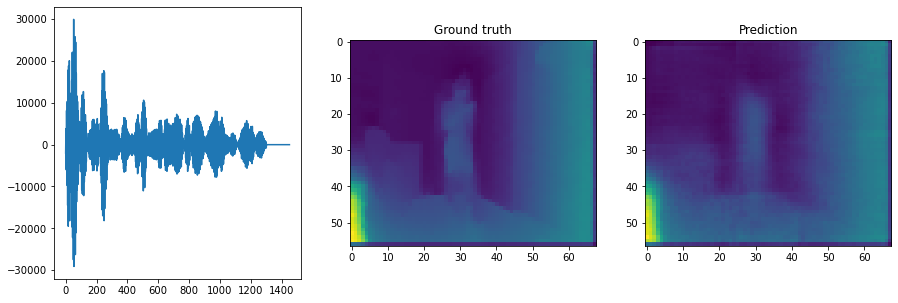

MSE 234.08633422851562


<Figure size 432x288 with 0 Axes>

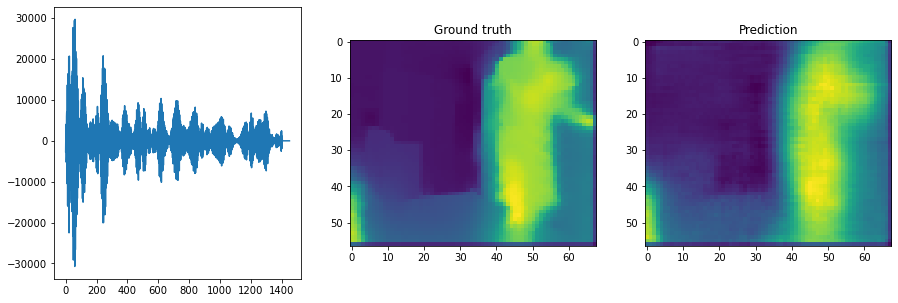

MSE 265.66046142578125


<Figure size 432x288 with 0 Axes>

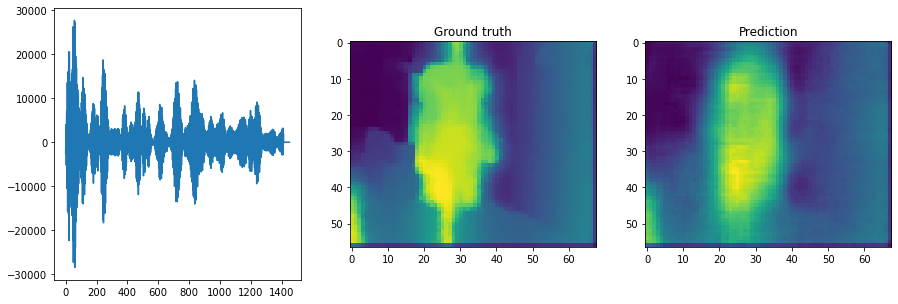

MSE 18.59694480895996


<Figure size 432x288 with 0 Axes>

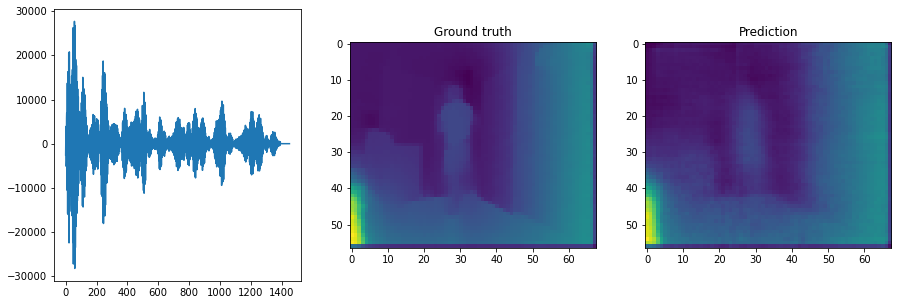

MSE 255.82492065429688


<Figure size 432x288 with 0 Axes>

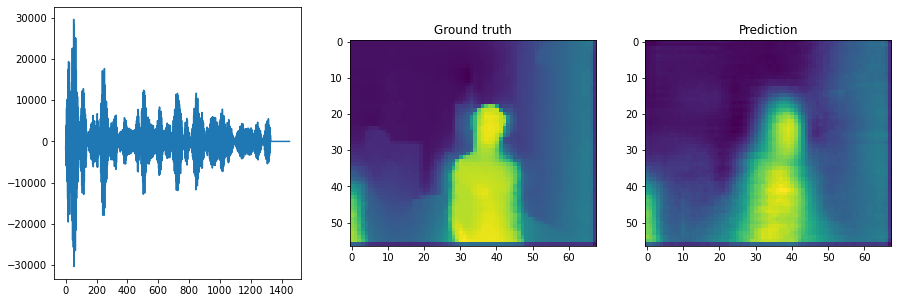

MSE 424.6181335449219


<Figure size 432x288 with 0 Axes>

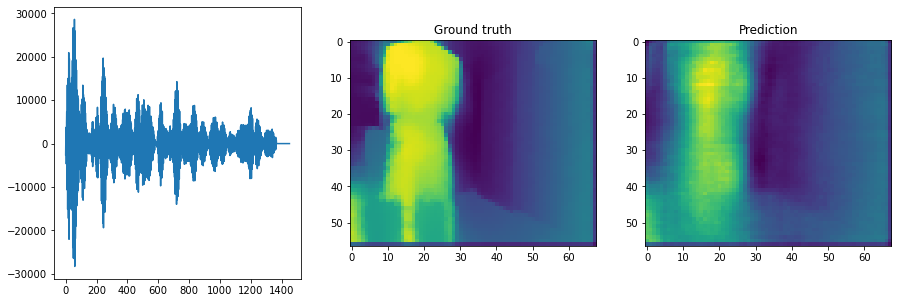

MSE 146.5516815185547


<Figure size 432x288 with 0 Axes>

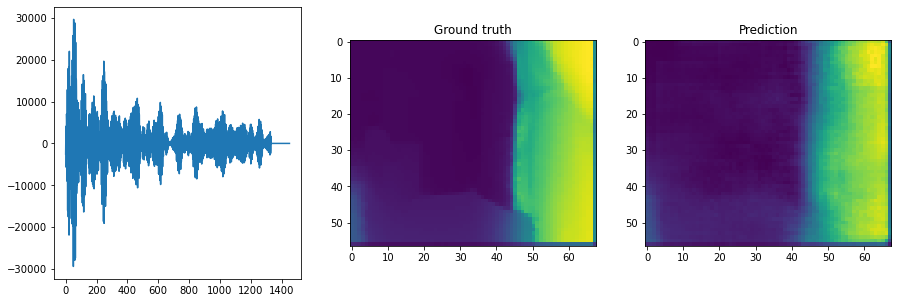

MSE 415.32958984375


<Figure size 432x288 with 0 Axes>

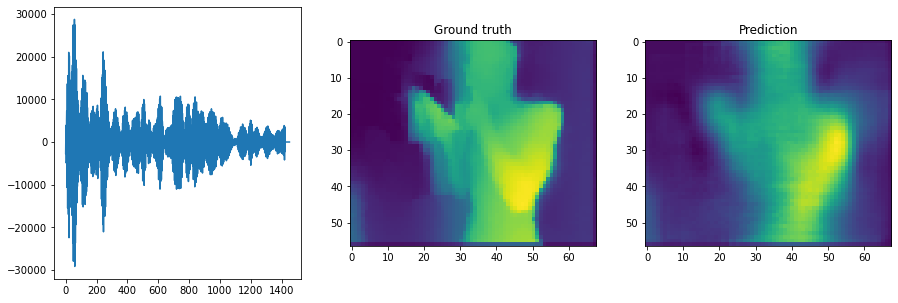

MSE 15.066925048828125


<Figure size 432x288 with 0 Axes>

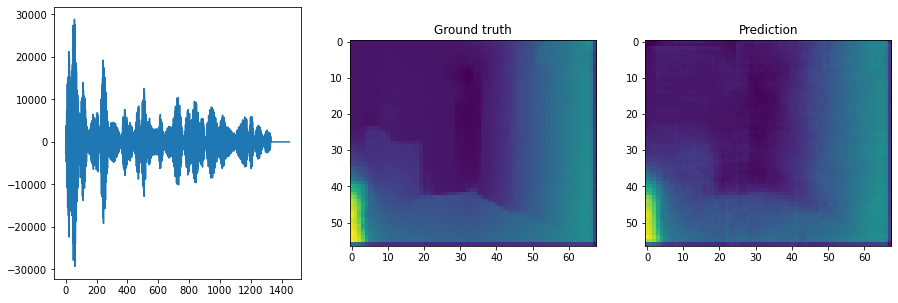

MSE 205.80267333984375


<Figure size 432x288 with 0 Axes>

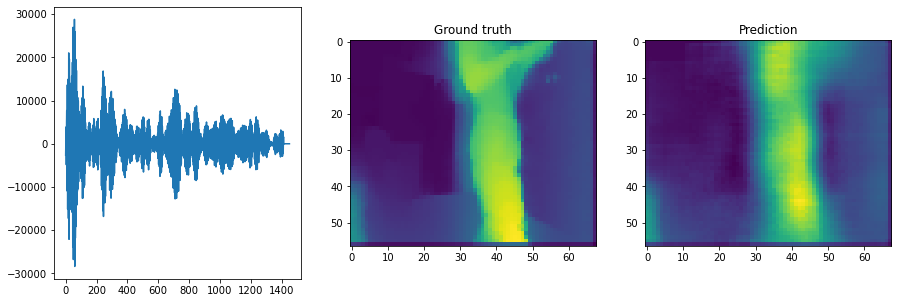

MSE 227.09658813476562


<Figure size 432x288 with 0 Axes>

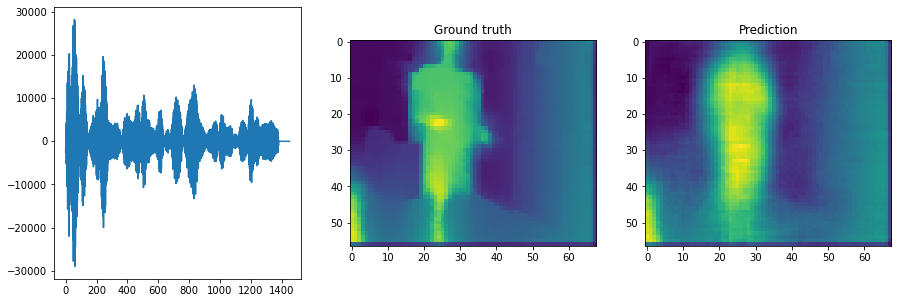

<Figure size 432x288 with 0 Axes>

In [12]:
model.eval()
for idx, (audios, images) in enumerate(train_loader):
    audios = audios.to(device)
    pred_ims = model(audios)
    print(f"\n\nBatch {idx} ###############")
    for audio, image, pred_image in zip(audios, images, pred_ims):
        print(f"MSE {criterion( pred_image, image.to(device))}")
        audio_np = np.array(audio.to('cpu').detach().numpy())
        image_np = np.array(image.to('cpu').detach().numpy())
        pred_image_np = np.array(pred_image.to('cpu').detach().numpy())
        fig, axs = plt.subplots(1,3, figsize=(15,5))
        axs[0].plot(audio_np)
        axs[1].imshow(image_np)
        axs[1].set_title("Ground truth")
        axs[2].imshow(pred_image_np)
        axs[2].set_title("Prediction")
        plt.show()
        plt.clf()
    if idx==0:
        break

# FC+Conv




Batch 0 ###############


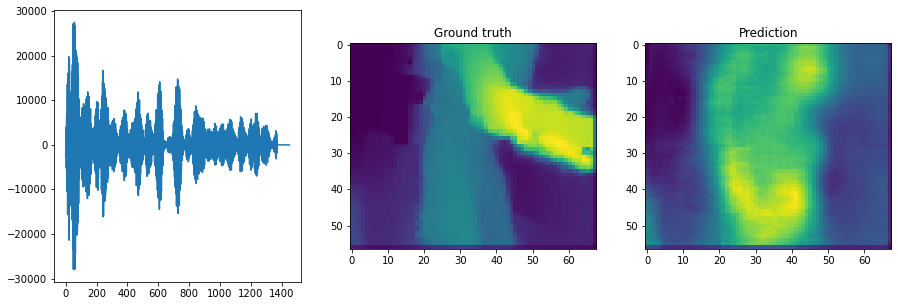

<Figure size 432x288 with 0 Axes>

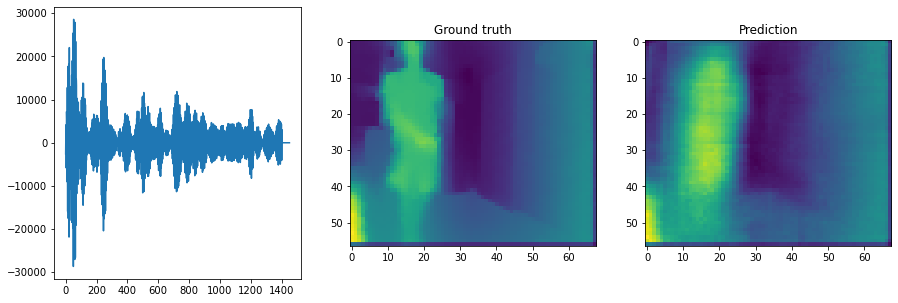

<Figure size 432x288 with 0 Axes>

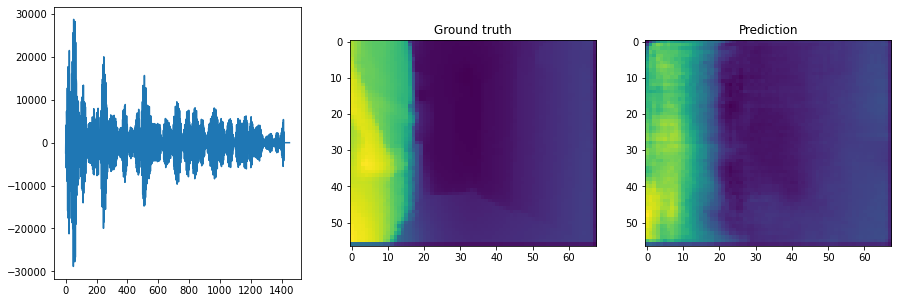

<Figure size 432x288 with 0 Axes>

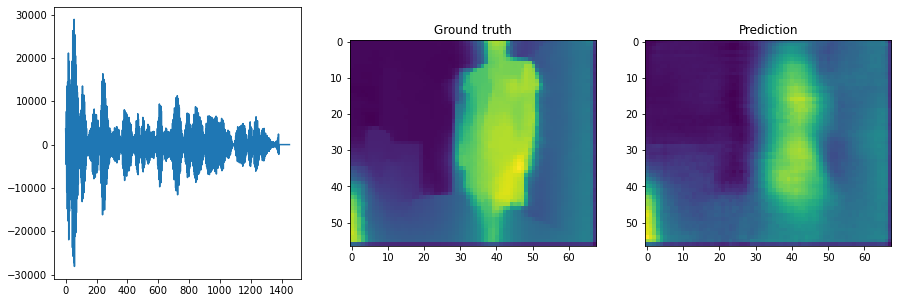

<Figure size 432x288 with 0 Axes>

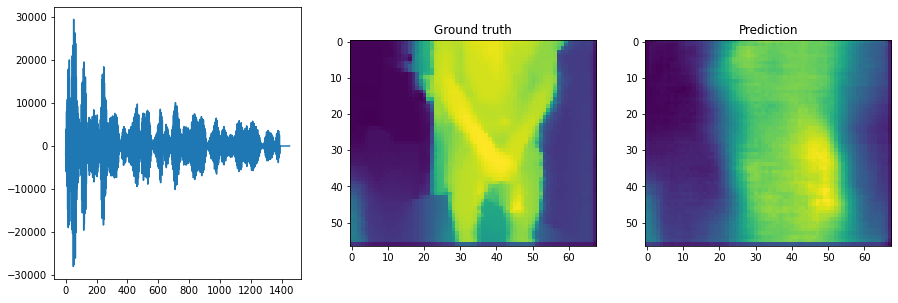

<Figure size 432x288 with 0 Axes>

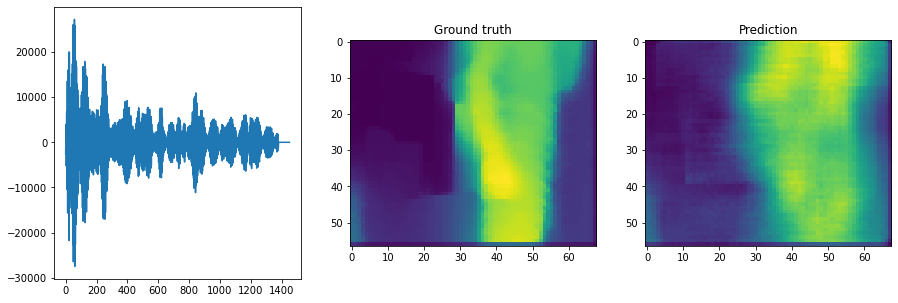

<Figure size 432x288 with 0 Axes>

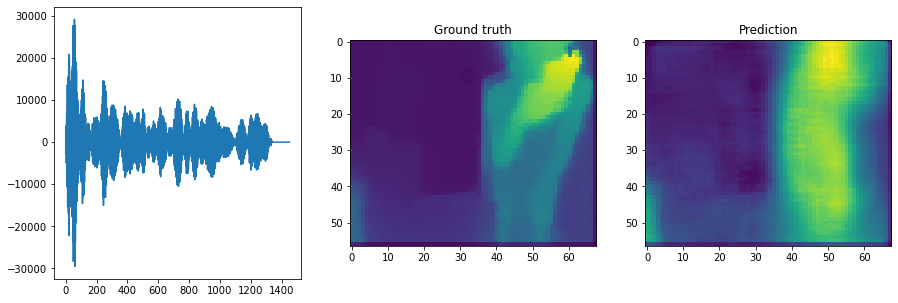

<Figure size 432x288 with 0 Axes>

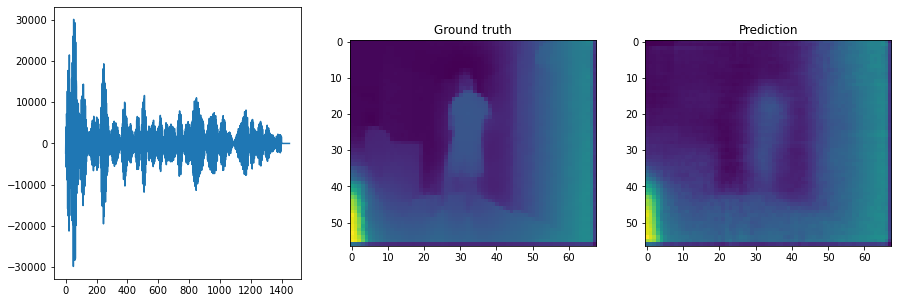

<Figure size 432x288 with 0 Axes>

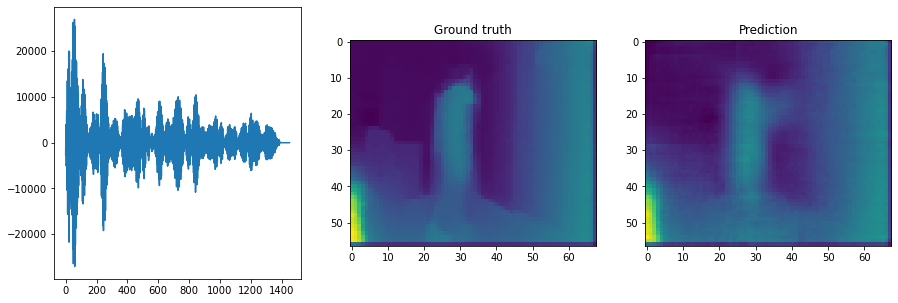

<Figure size 432x288 with 0 Axes>

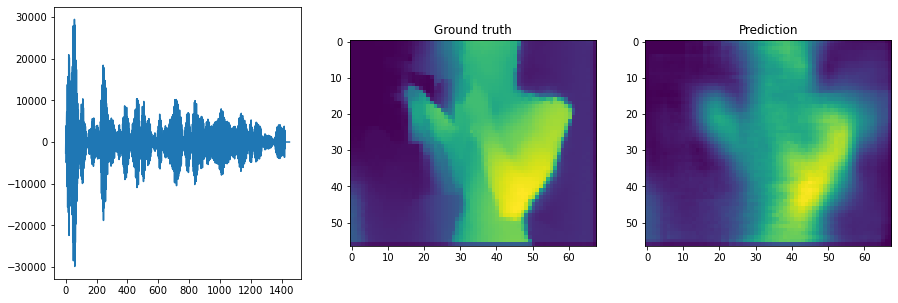

<Figure size 432x288 with 0 Axes>

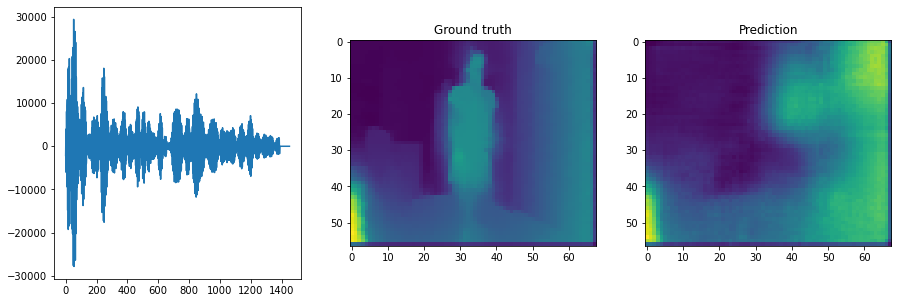

<Figure size 432x288 with 0 Axes>

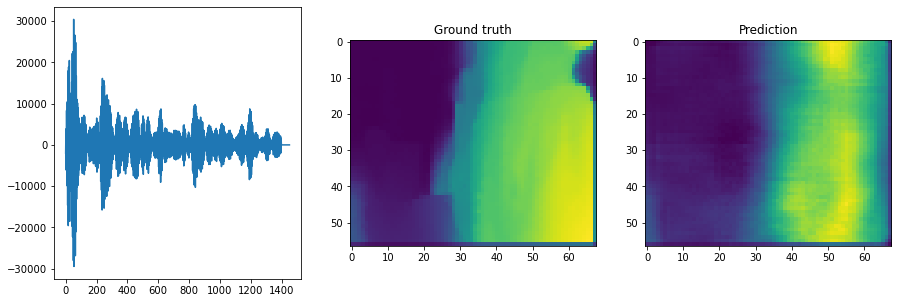

<Figure size 432x288 with 0 Axes>

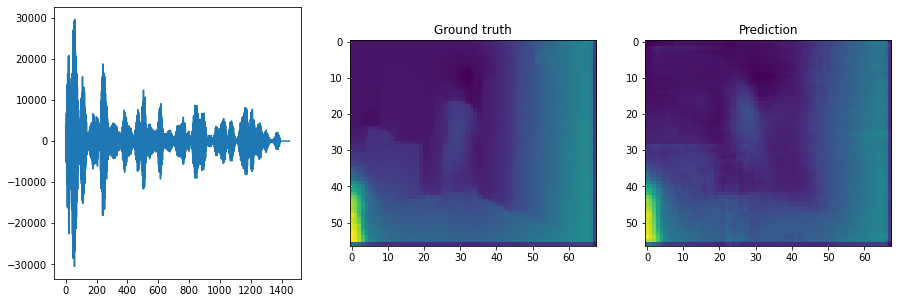

<Figure size 432x288 with 0 Axes>

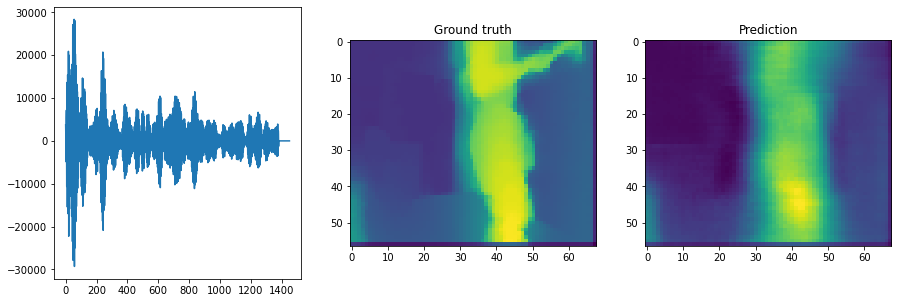

<Figure size 432x288 with 0 Axes>

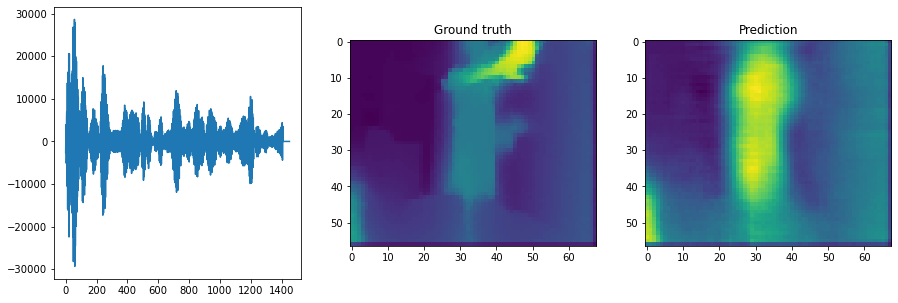

<Figure size 432x288 with 0 Axes>

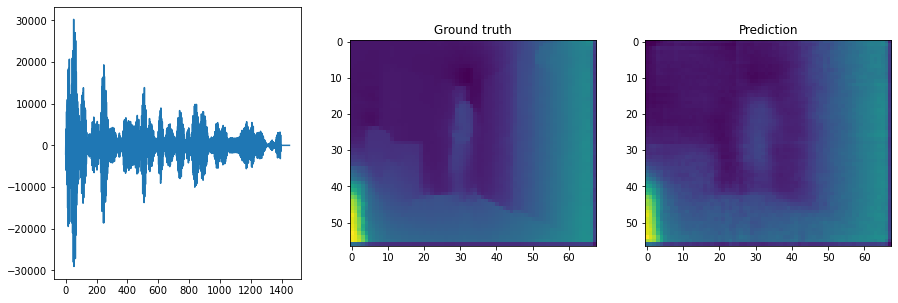



Batch 1 ###############


Batch 2 ###############
Average MSE: 0.02112676203250885; Average SSIM: 0.657313346862793


<Figure size 432x288 with 0 Axes>

In [10]:
MSE_metric = []
SSIM_metric = []
criterion_MSE = nn.MSELoss()
criterion_SSIM = SSIM(n_channels=1).cuda()

for idx, (audios, images) in enumerate(val_loader):
    audios, images = audios.to(device), images.to(device)
    pred_ims = model(audios)
    MSE_metric.append(criterion_MSE( (pred_ims.unsqueeze(1)-pred_ims.min())/(pred_ims.max()-pred_ims.min()),
                                      (images.unsqueeze(1)-images.min())/(images.max()-images.min())))
    SSIM_metric.append(criterion_SSIM( (pred_ims.unsqueeze(1)-pred_ims.min())/(pred_ims.max()-pred_ims.min()),
                                      (images.unsqueeze(1)-images.min())/(images.max()-images.min())))
    print(f"\n\nBatch {idx} ###############")
    if idx<1:
        for k, (audio, image, pred_image) in enumerate(zip(audios, images, pred_ims)):
            if k>15:
                break
            audio_np = np.array(audio.to('cpu').detach().numpy())
            image_np = np.array(image.to('cpu').detach().numpy())
            pred_image_np = np.array(pred_image.to('cpu').detach().numpy())
            fig, axs = plt.subplots(1,3, figsize=(15,5))
            axs[0].plot(audio_np)
            axs[1].imshow(image_np)
            axs[1].set_title("Ground truth")
            axs[2].imshow(pred_image_np)
            axs[2].set_title("Prediction")
            plt.show()
            plt.clf()
print(f"Average MSE: {torch.mean(torch.tensor(MSE_metric))}; Average SSIM: {torch.mean(torch.tensor(SSIM_metric))}")



Batch 0 ###############
MSE 92.52777862548828


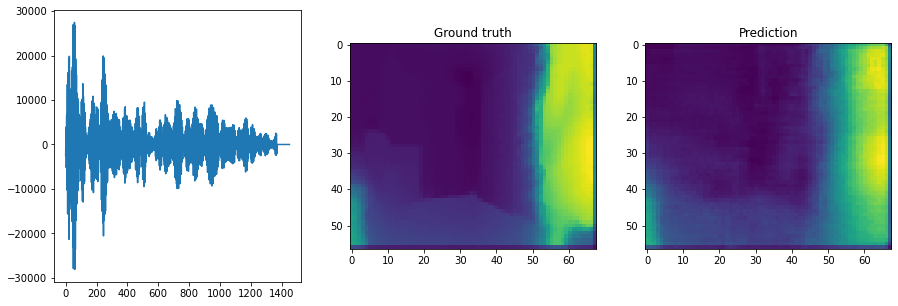

MSE 147.51295471191406


<Figure size 432x288 with 0 Axes>

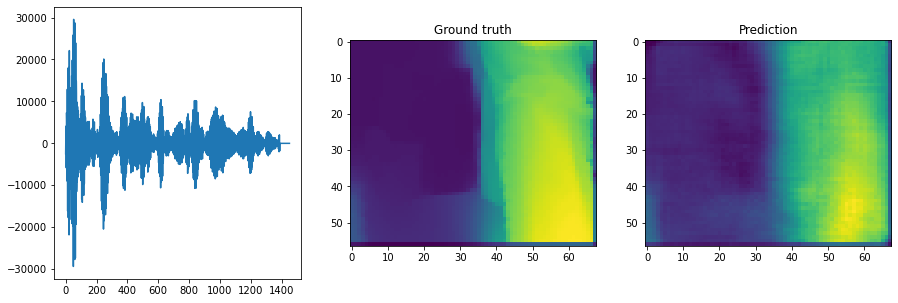

MSE 51.31467819213867


<Figure size 432x288 with 0 Axes>

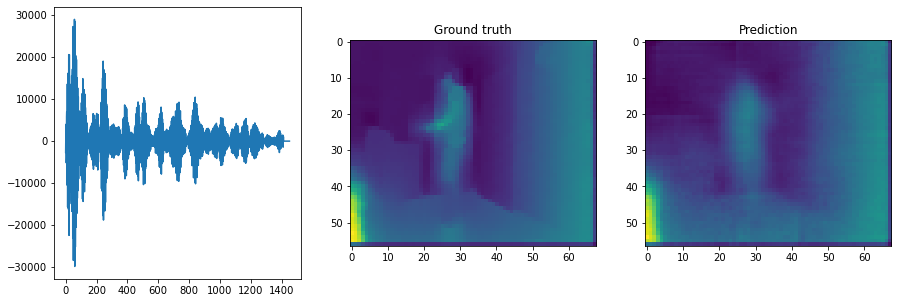

MSE 255.7881317138672


<Figure size 432x288 with 0 Axes>

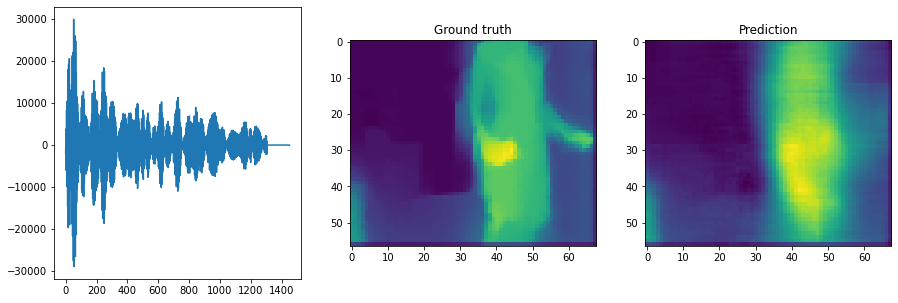

MSE 57.79485321044922


<Figure size 432x288 with 0 Axes>

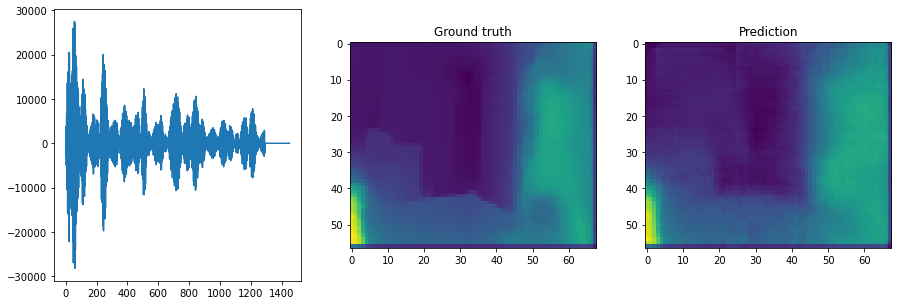

MSE 135.7609405517578


<Figure size 432x288 with 0 Axes>

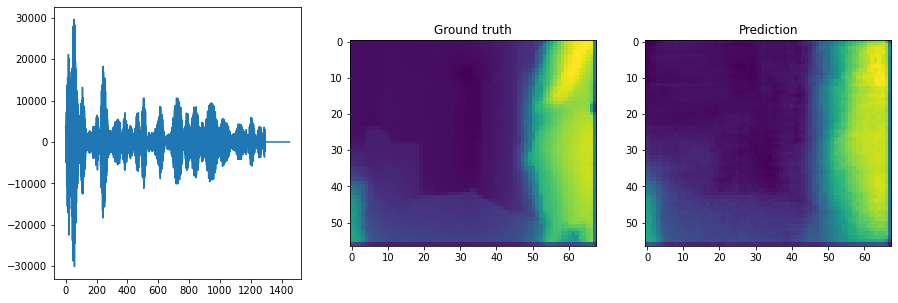

MSE 278.53753662109375


<Figure size 432x288 with 0 Axes>

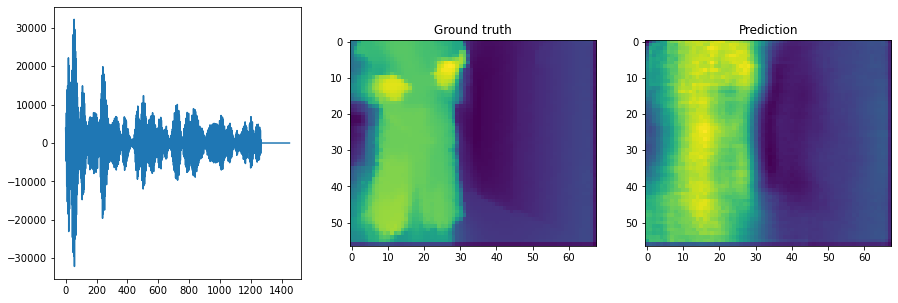

MSE 43.651756286621094


<Figure size 432x288 with 0 Axes>

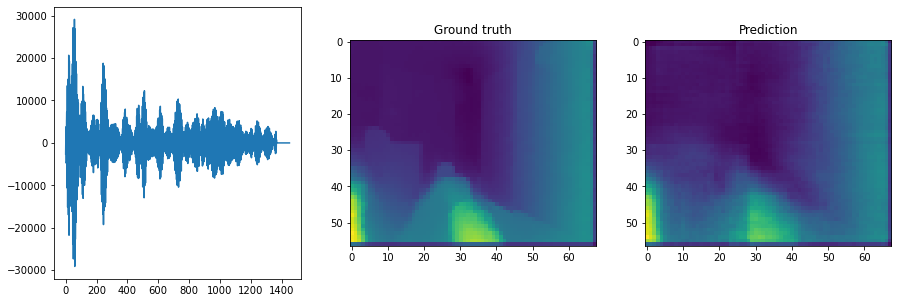

MSE 301.8179931640625


<Figure size 432x288 with 0 Axes>

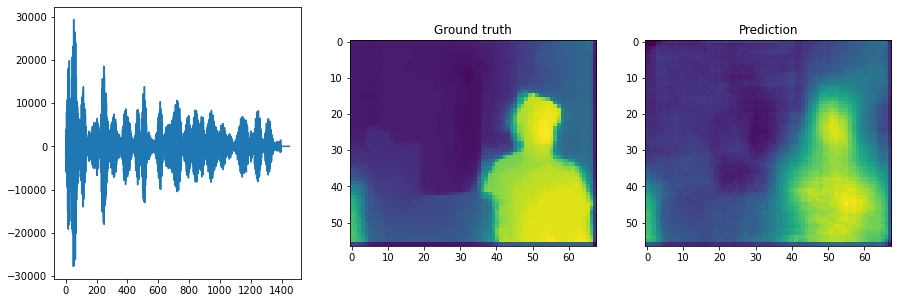

MSE 14.140305519104004


<Figure size 432x288 with 0 Axes>

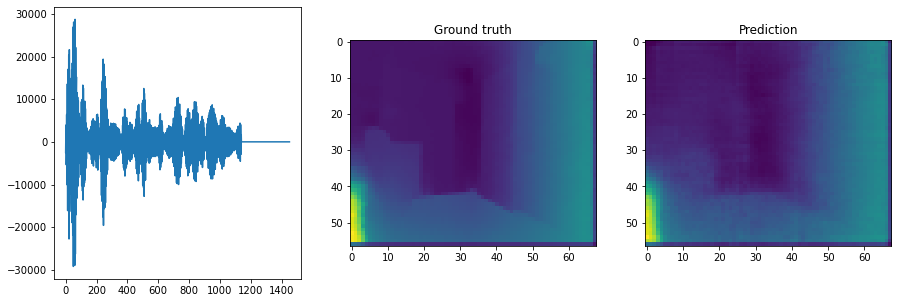

MSE 13.175681114196777


<Figure size 432x288 with 0 Axes>

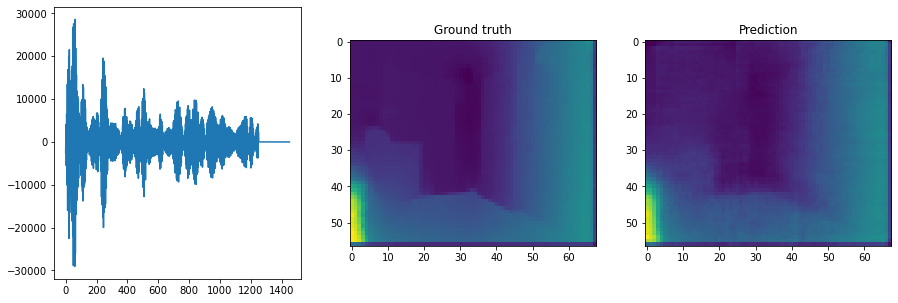

MSE 271.2322692871094


<Figure size 432x288 with 0 Axes>

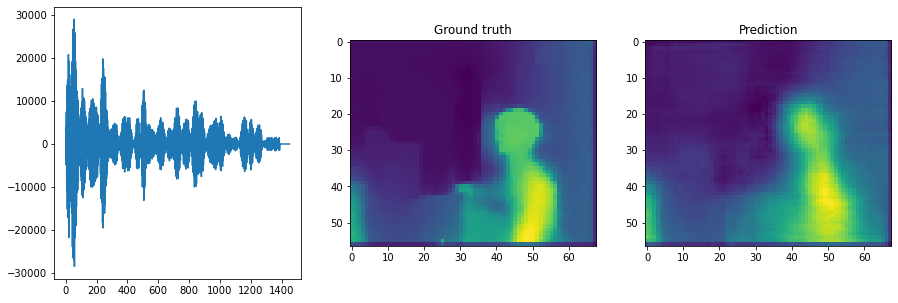

MSE 368.79473876953125


<Figure size 432x288 with 0 Axes>

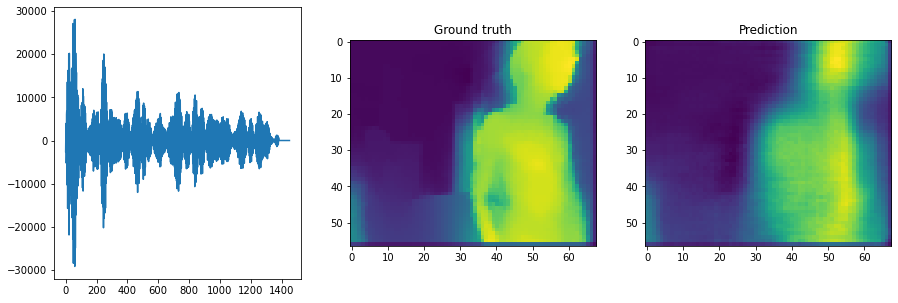

MSE 158.30770874023438


<Figure size 432x288 with 0 Axes>

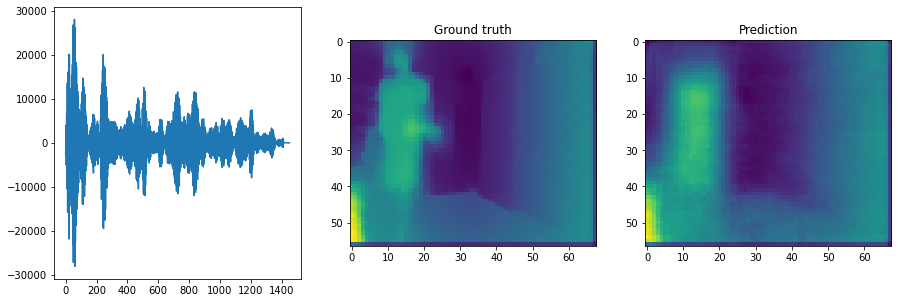

MSE 42.73354721069336


<Figure size 432x288 with 0 Axes>

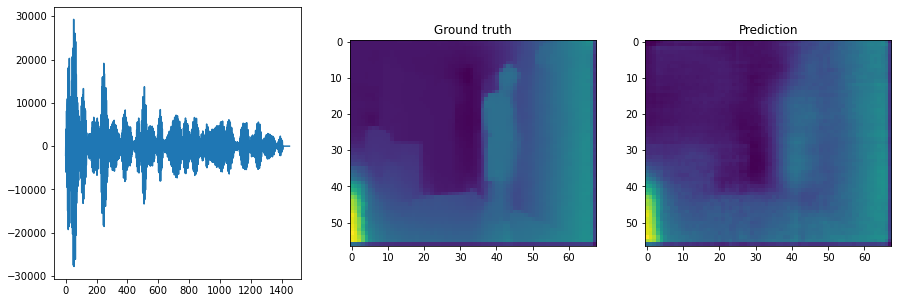

MSE 326.77142333984375


<Figure size 432x288 with 0 Axes>

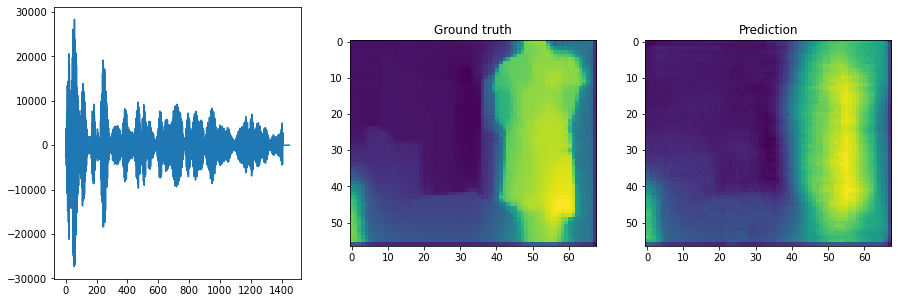

MSE 579.19384765625


<Figure size 432x288 with 0 Axes>

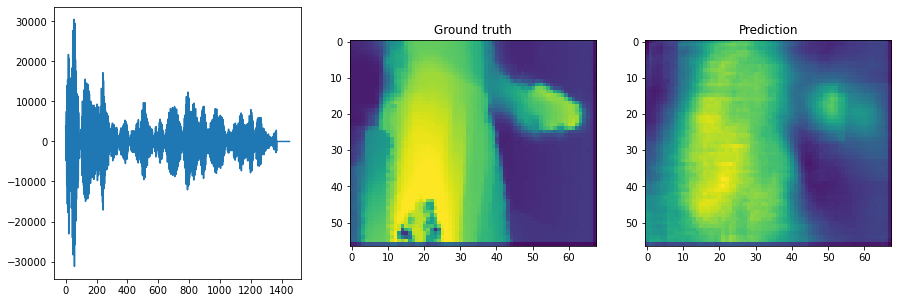

MSE 423.03790283203125


<Figure size 432x288 with 0 Axes>

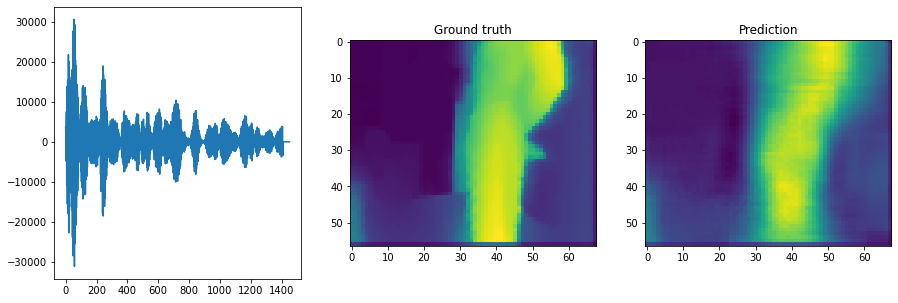

MSE 410.4212341308594


<Figure size 432x288 with 0 Axes>

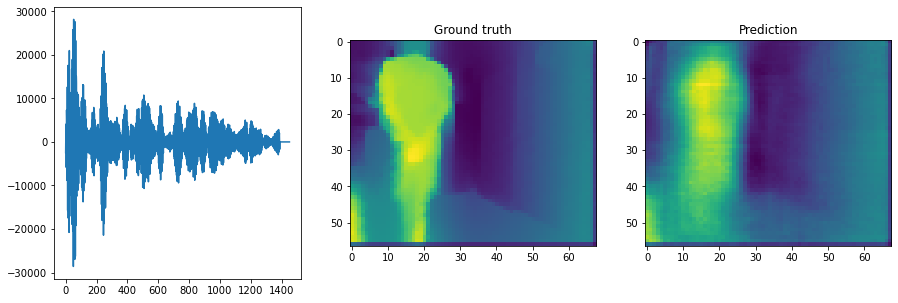

MSE 513.9331665039062


<Figure size 432x288 with 0 Axes>

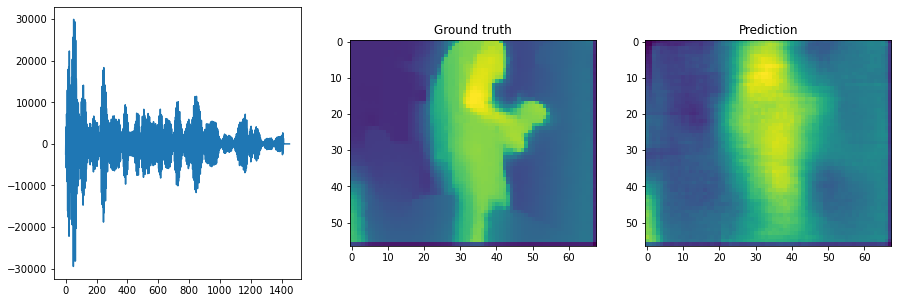

MSE 259.9789123535156


<Figure size 432x288 with 0 Axes>

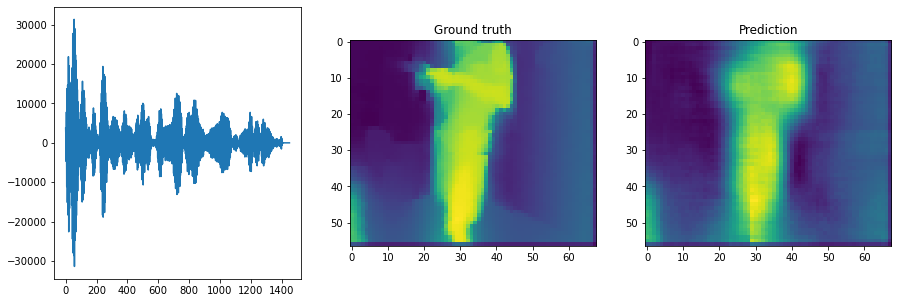

MSE 395.9114685058594


<Figure size 432x288 with 0 Axes>

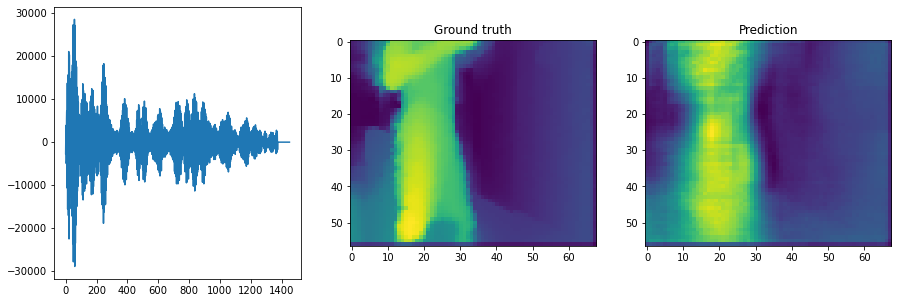

MSE 481.8166198730469


<Figure size 432x288 with 0 Axes>

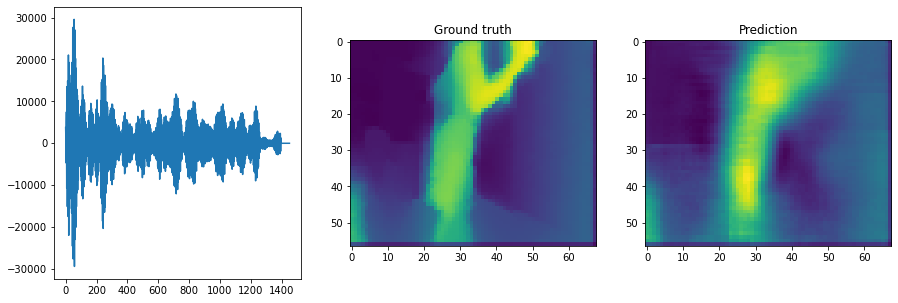

MSE 244.96875


<Figure size 432x288 with 0 Axes>

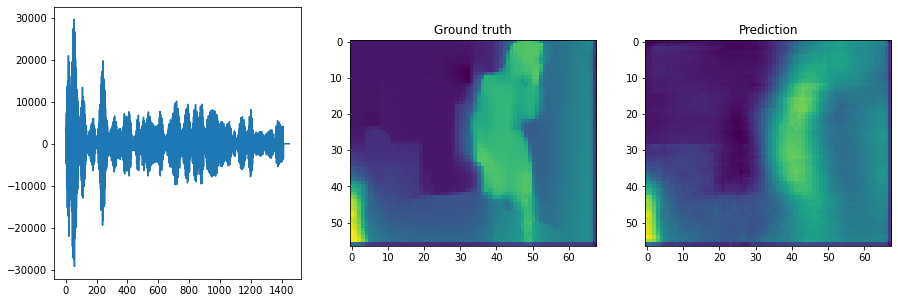

MSE 185.6793212890625


<Figure size 432x288 with 0 Axes>

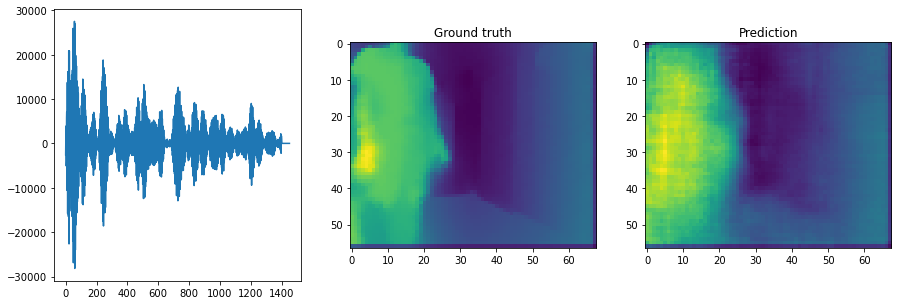

MSE 29.999252319335938


<Figure size 432x288 with 0 Axes>

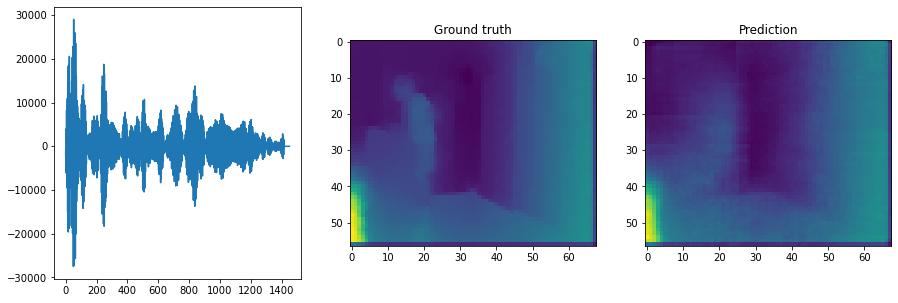

MSE 388.4657287597656


<Figure size 432x288 with 0 Axes>

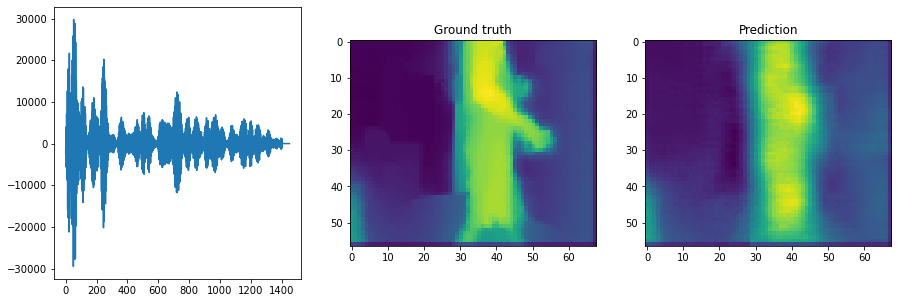

MSE 14.753925323486328


<Figure size 432x288 with 0 Axes>

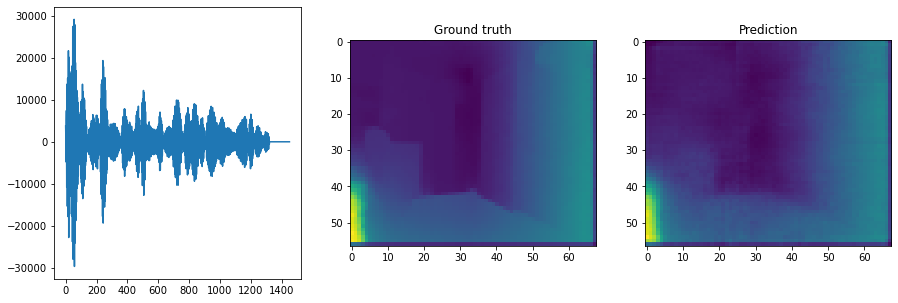

MSE 165.21824645996094


<Figure size 432x288 with 0 Axes>

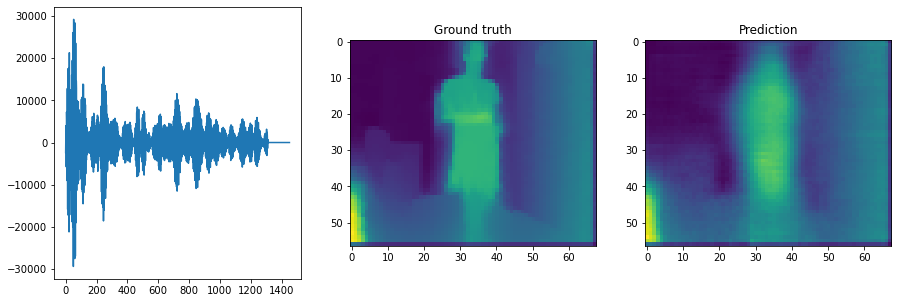

MSE 69.01341247558594


<Figure size 432x288 with 0 Axes>

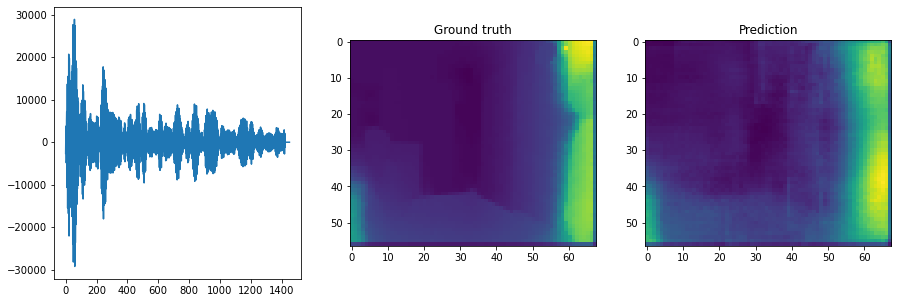

MSE 555.5458984375


<Figure size 432x288 with 0 Axes>

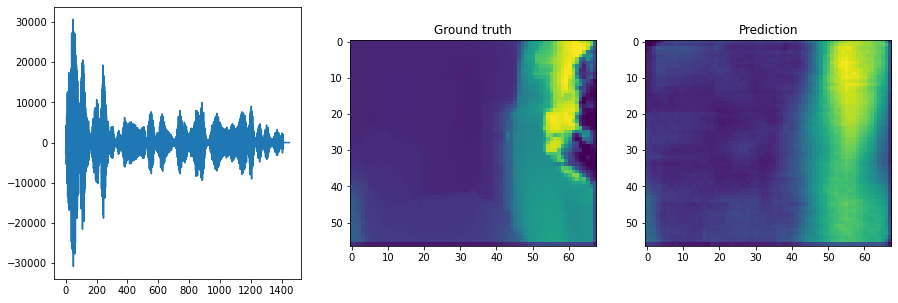

MSE 288.4869079589844


<Figure size 432x288 with 0 Axes>

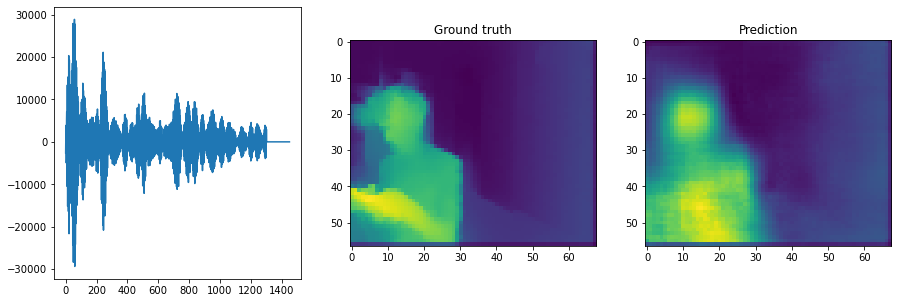

MSE 264.4909362792969


<Figure size 432x288 with 0 Axes>

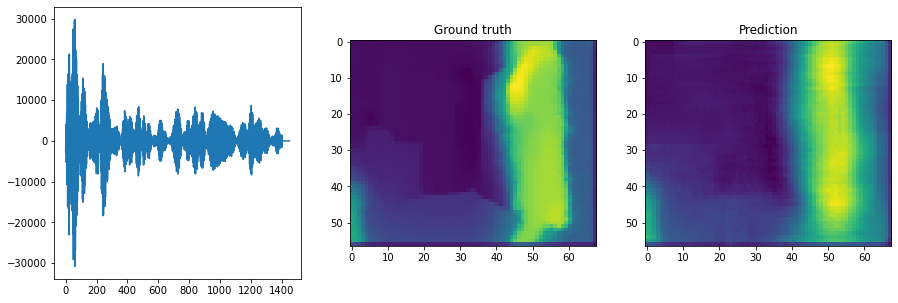

MSE 378.387451171875


<Figure size 432x288 with 0 Axes>

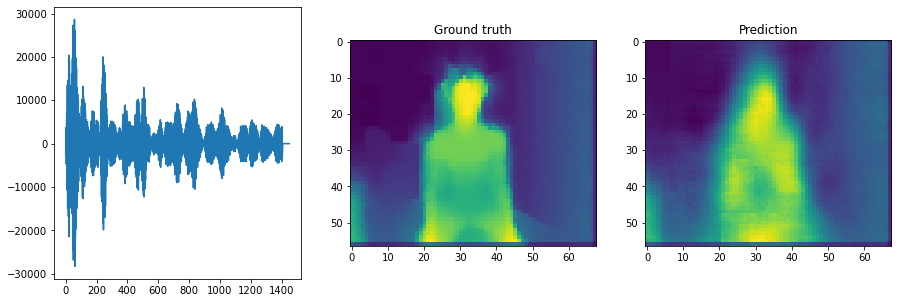

MSE 814.4099731445312


<Figure size 432x288 with 0 Axes>

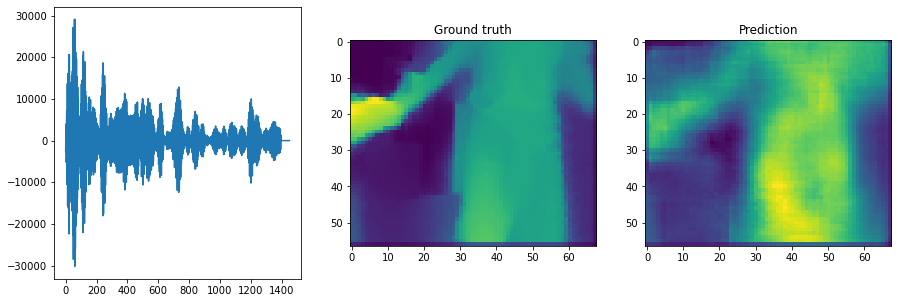

MSE 315.2743225097656


<Figure size 432x288 with 0 Axes>

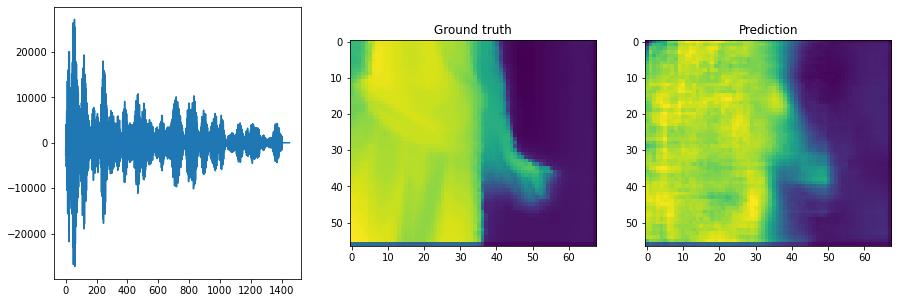

MSE 66.3089828491211


<Figure size 432x288 with 0 Axes>

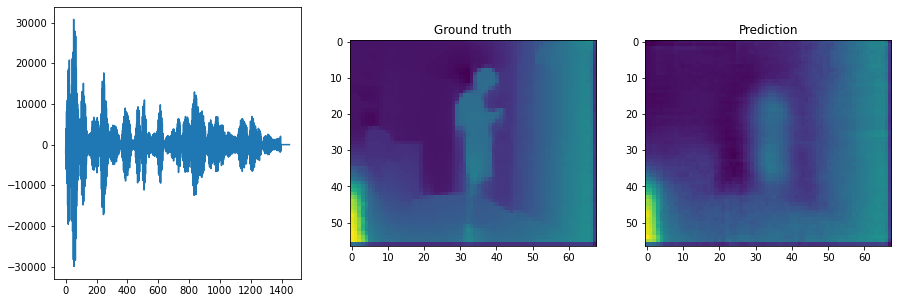

MSE 327.6087341308594


<Figure size 432x288 with 0 Axes>

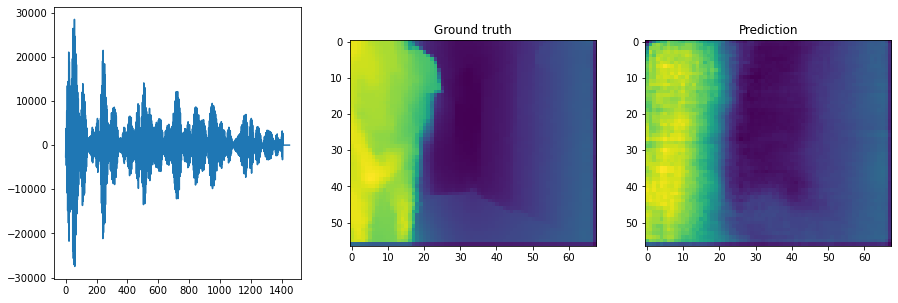

MSE 388.2209167480469


<Figure size 432x288 with 0 Axes>

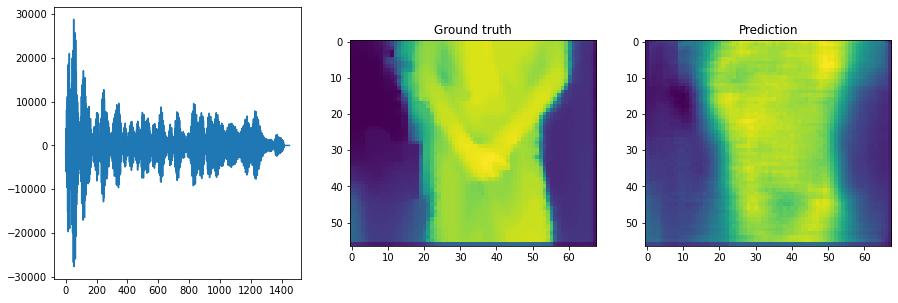

MSE 310.253662109375


<Figure size 432x288 with 0 Axes>

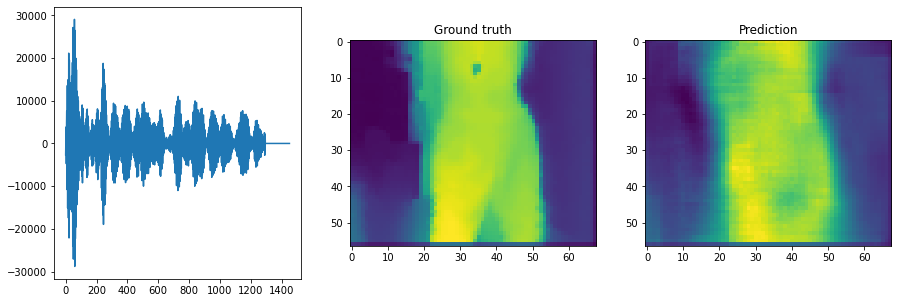

MSE 491.4166564941406


<Figure size 432x288 with 0 Axes>

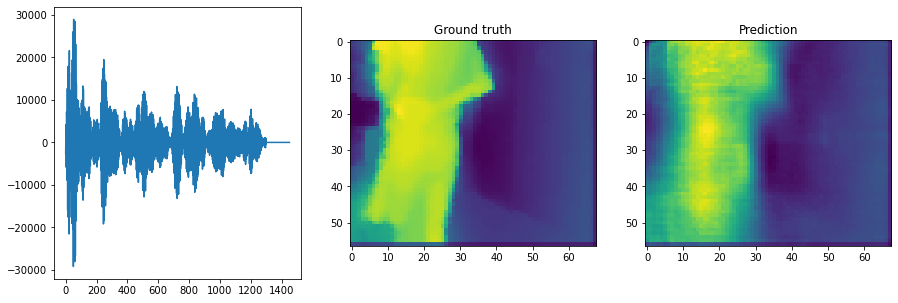

MSE 262.1675109863281


<Figure size 432x288 with 0 Axes>

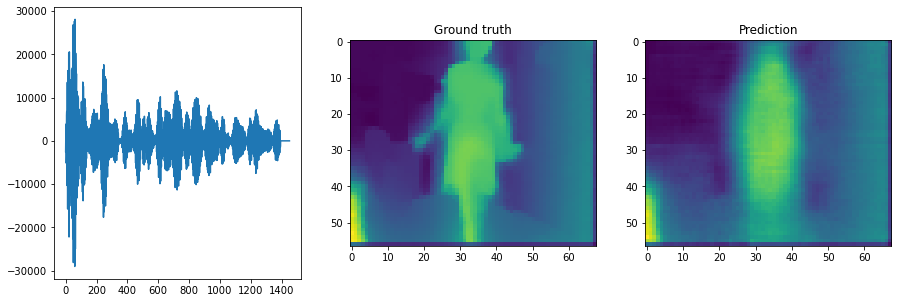

MSE 282.5532531738281


<Figure size 432x288 with 0 Axes>

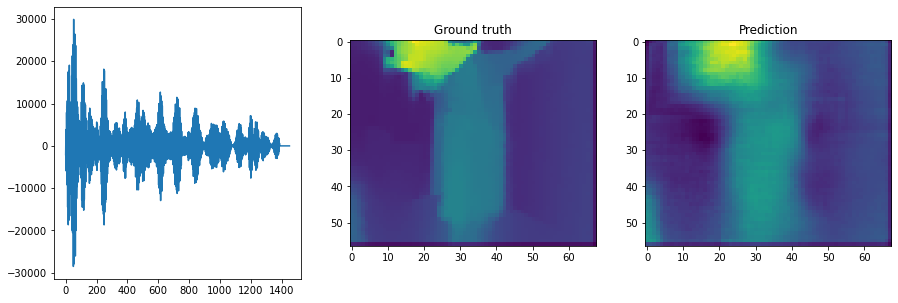

MSE 260.3789367675781


<Figure size 432x288 with 0 Axes>

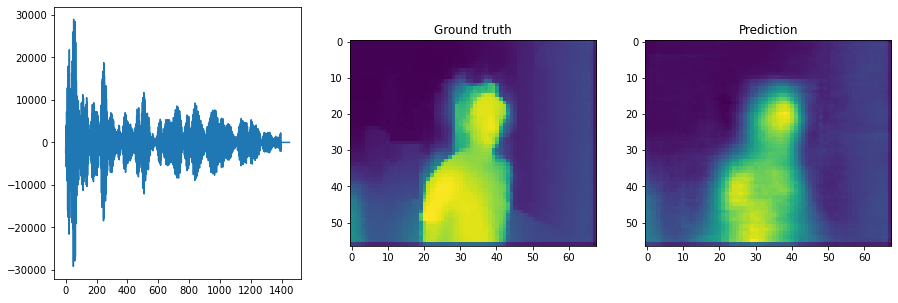

MSE 67.87808227539062


<Figure size 432x288 with 0 Axes>

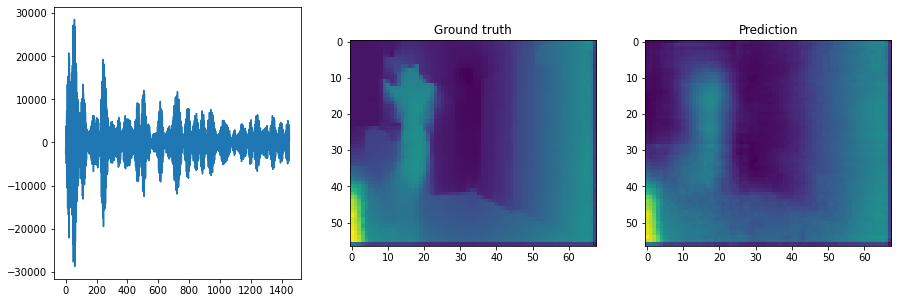

MSE 24.875917434692383


<Figure size 432x288 with 0 Axes>

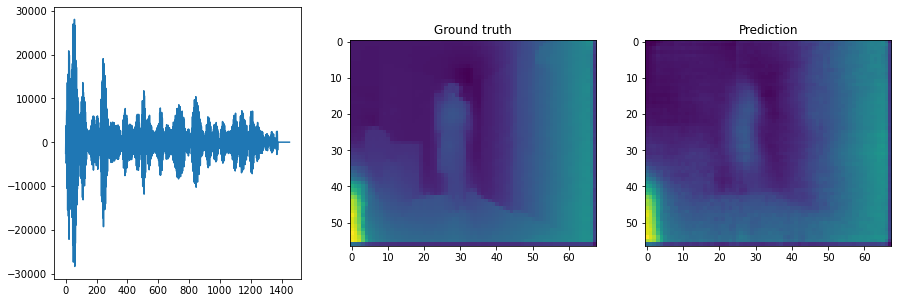

MSE 375.2893981933594


<Figure size 432x288 with 0 Axes>

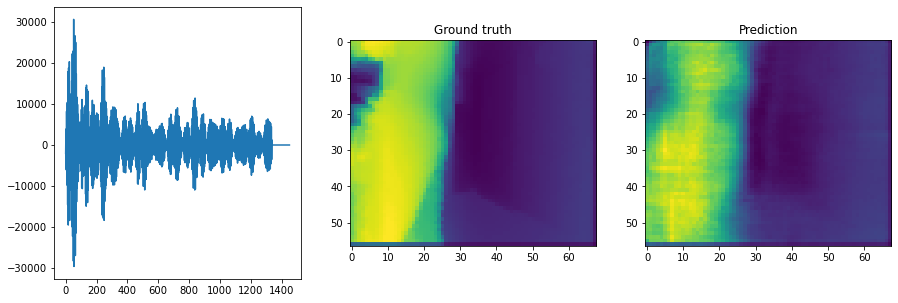

MSE 298.14404296875


<Figure size 432x288 with 0 Axes>

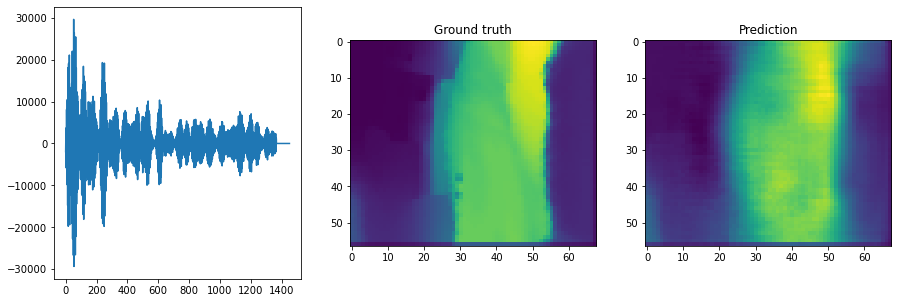

MSE 157.38877868652344


<Figure size 432x288 with 0 Axes>

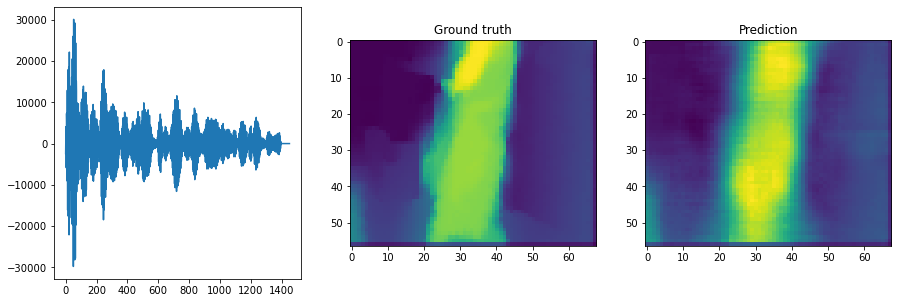

MSE 281.6022033691406


<Figure size 432x288 with 0 Axes>

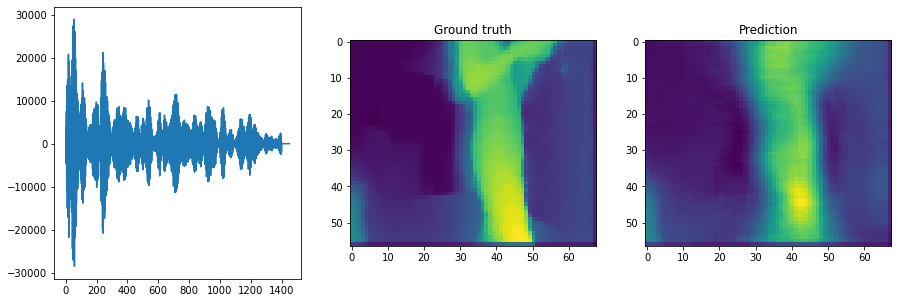

MSE 215.34506225585938


<Figure size 432x288 with 0 Axes>

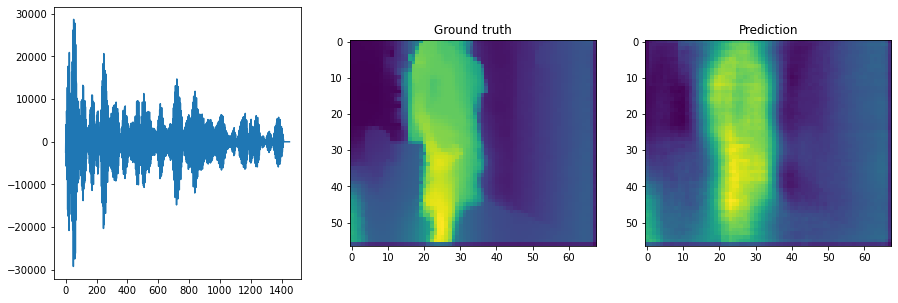

MSE 212.60984802246094


<Figure size 432x288 with 0 Axes>

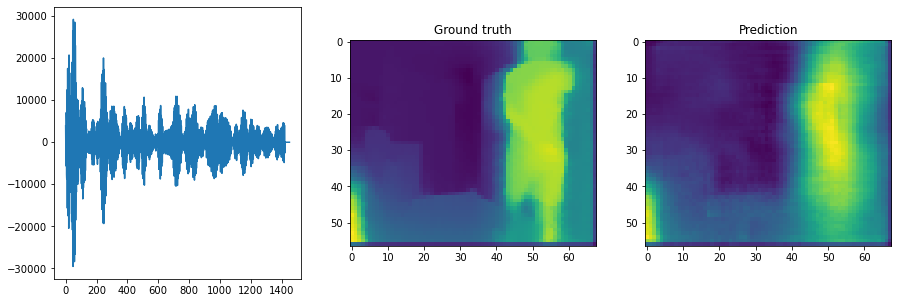

MSE 230.03794860839844


<Figure size 432x288 with 0 Axes>

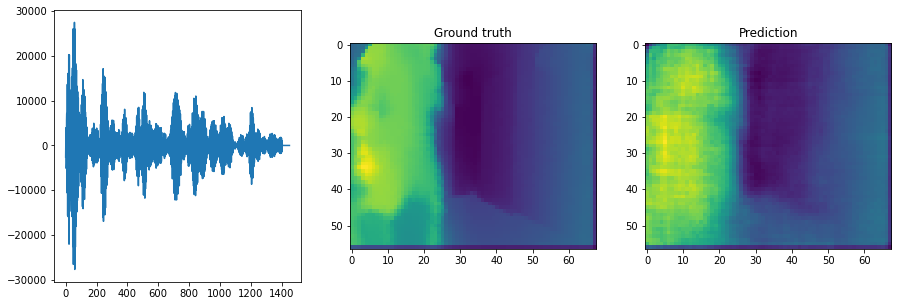

MSE 310.86102294921875


<Figure size 432x288 with 0 Axes>

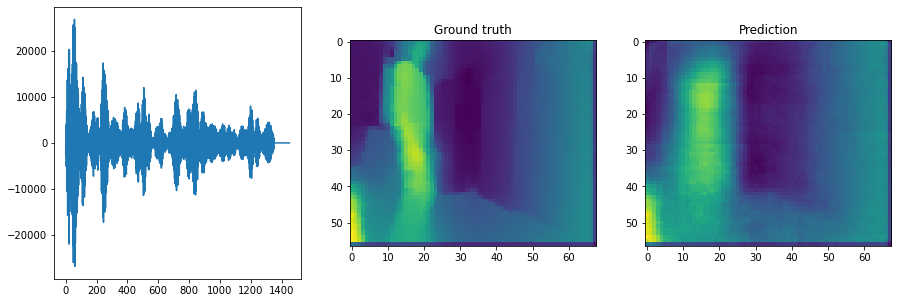

MSE 119.06095886230469


<Figure size 432x288 with 0 Axes>

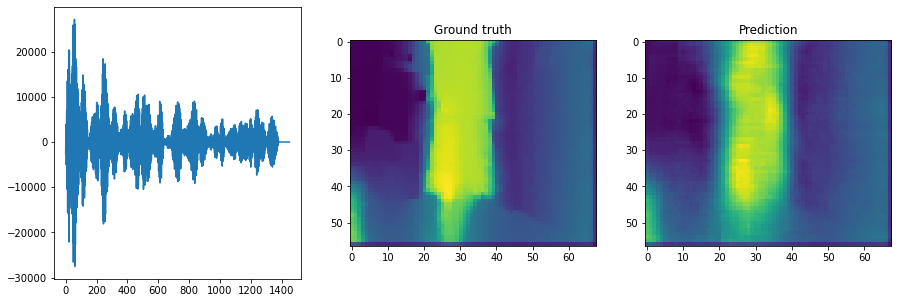

MSE 37.741607666015625


<Figure size 432x288 with 0 Axes>

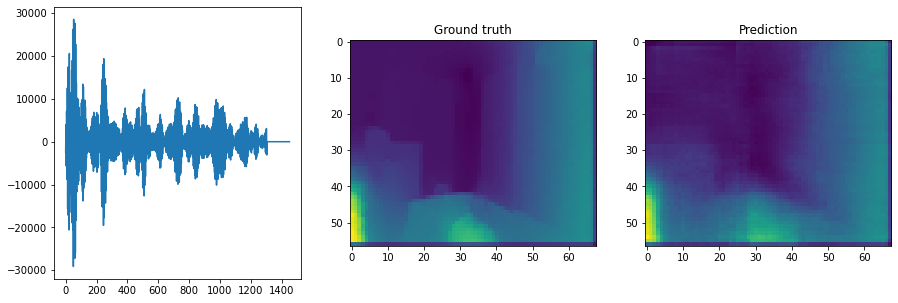

MSE 304.10626220703125


<Figure size 432x288 with 0 Axes>

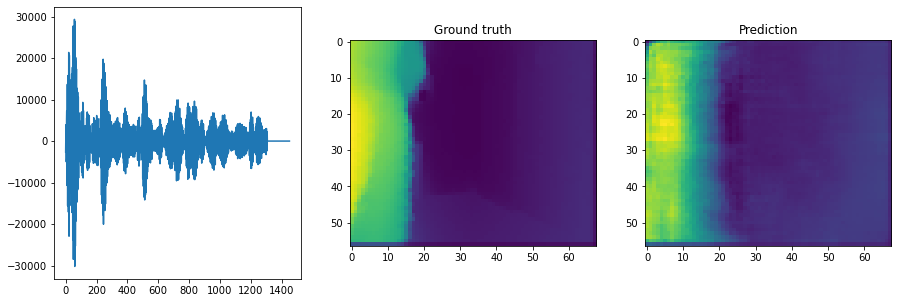

MSE 29.54731559753418


<Figure size 432x288 with 0 Axes>

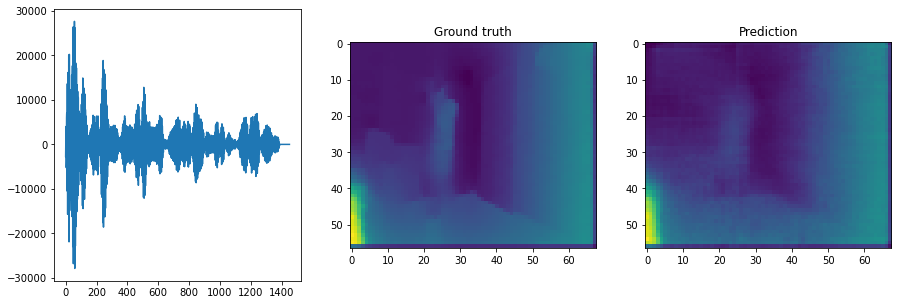

MSE 29.104202270507812


<Figure size 432x288 with 0 Axes>

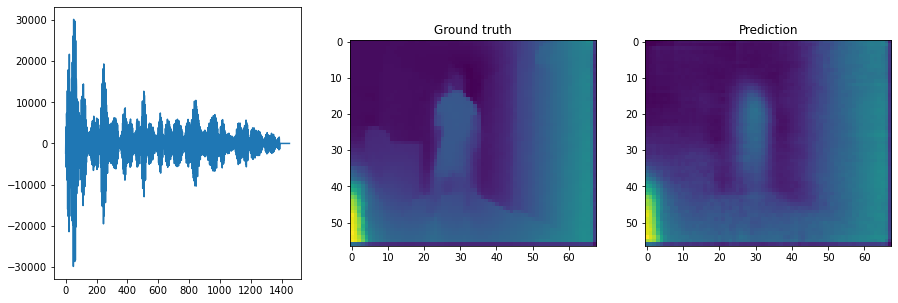

MSE 288.76123046875


<Figure size 432x288 with 0 Axes>

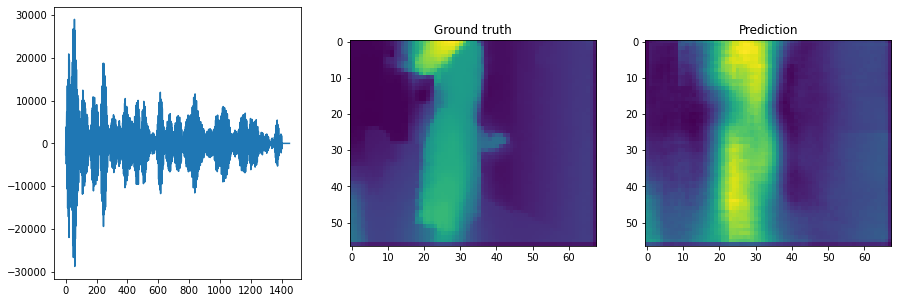

MSE 285.2620849609375


<Figure size 432x288 with 0 Axes>

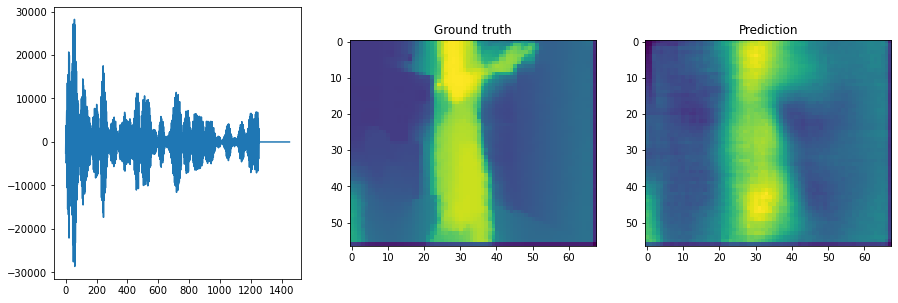

MSE 20.447246551513672


<Figure size 432x288 with 0 Axes>

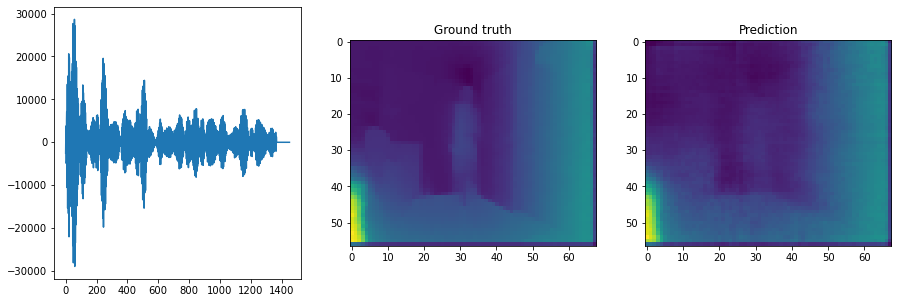

MSE 349.2268981933594


<Figure size 432x288 with 0 Axes>

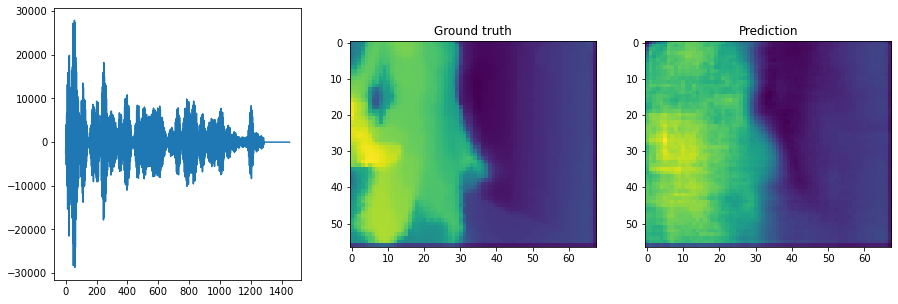

MSE 181.12020874023438


<Figure size 432x288 with 0 Axes>

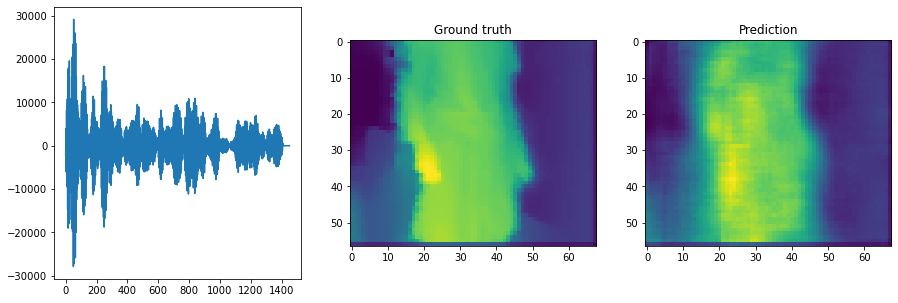

MSE 135.0850067138672


<Figure size 432x288 with 0 Axes>

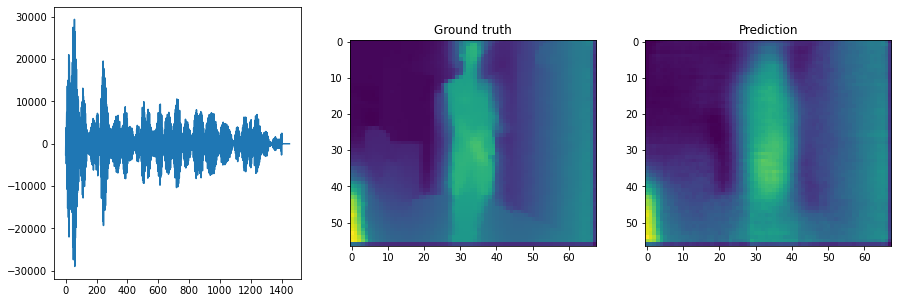

MSE 25.221899032592773


<Figure size 432x288 with 0 Axes>

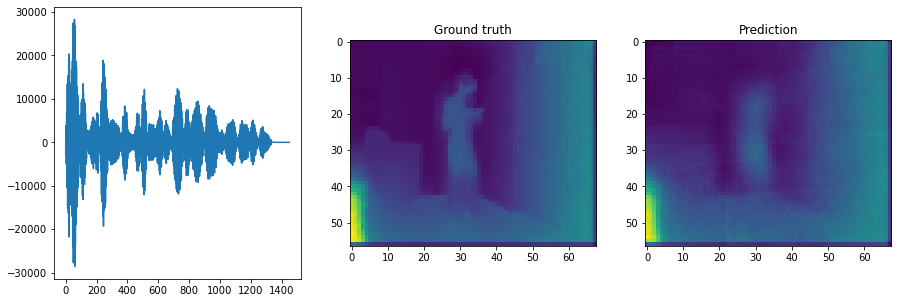

MSE 206.9199676513672


<Figure size 432x288 with 0 Axes>

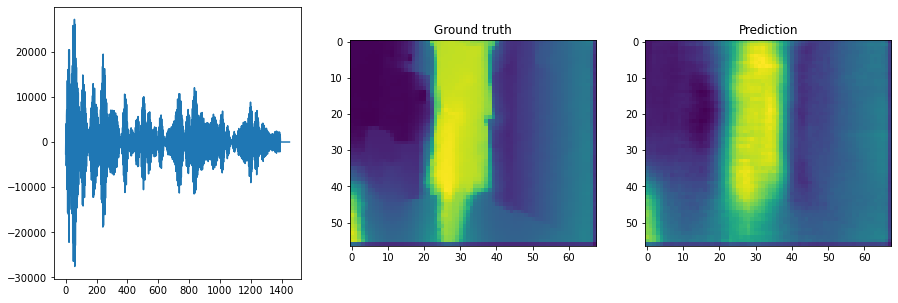

MSE 238.3360137939453


<Figure size 432x288 with 0 Axes>

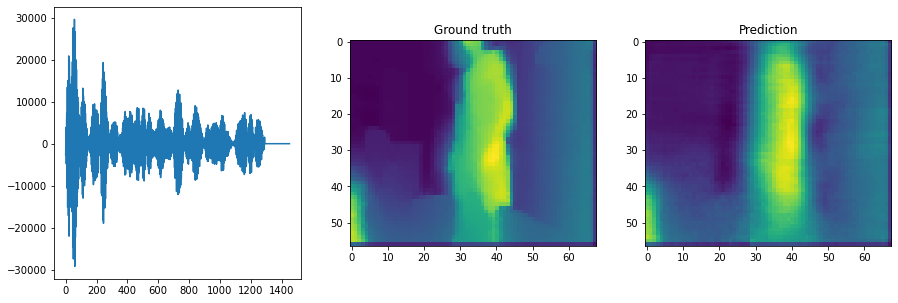

MSE 275.1924133300781


<Figure size 432x288 with 0 Axes>

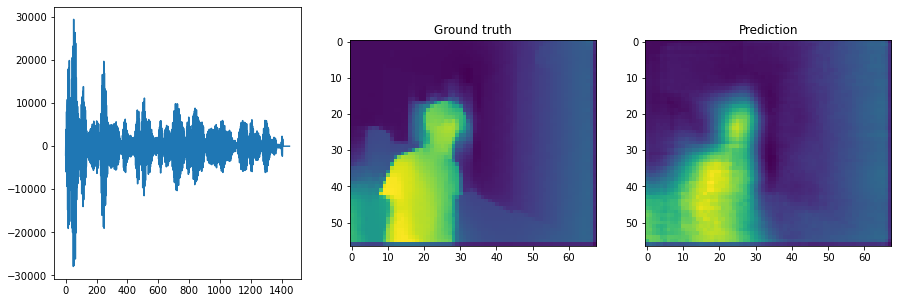

MSE 495.7991027832031


<Figure size 432x288 with 0 Axes>

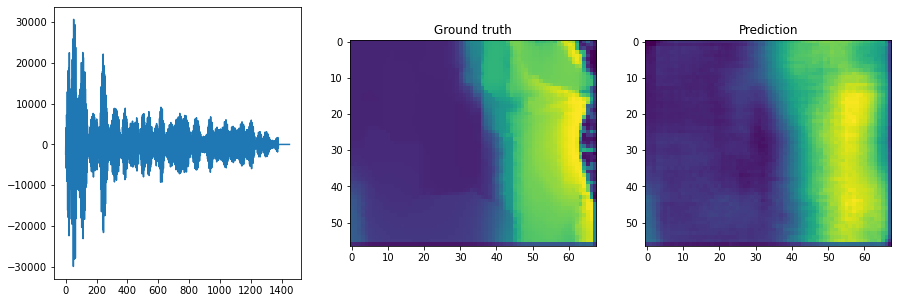

MSE 266.92156982421875


<Figure size 432x288 with 0 Axes>

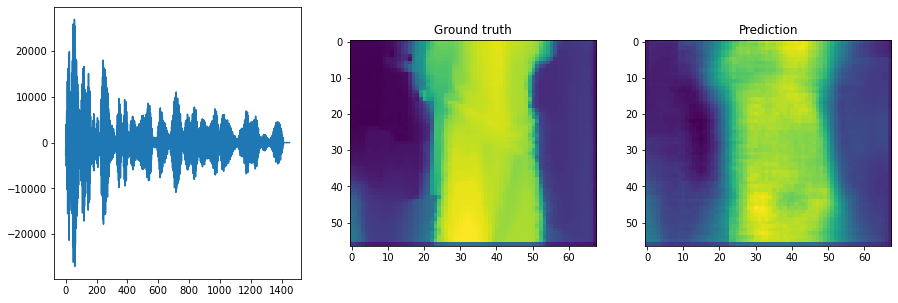

MSE 216.09483337402344


<Figure size 432x288 with 0 Axes>

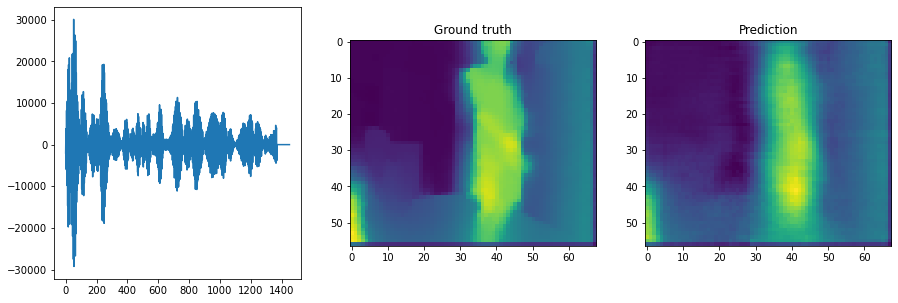

MSE 17.370285034179688


<Figure size 432x288 with 0 Axes>

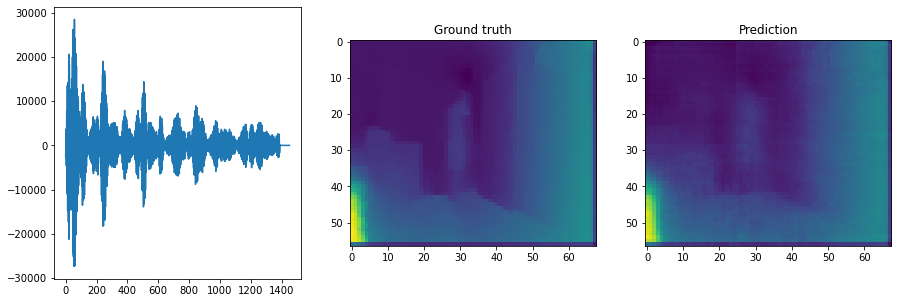

MSE 122.84622955322266


<Figure size 432x288 with 0 Axes>

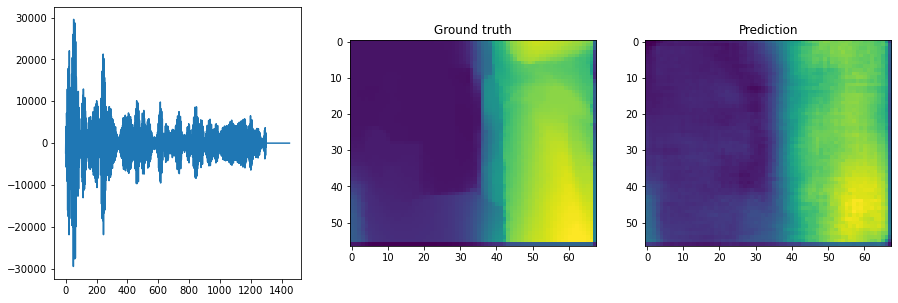

MSE 15.553110122680664


<Figure size 432x288 with 0 Axes>

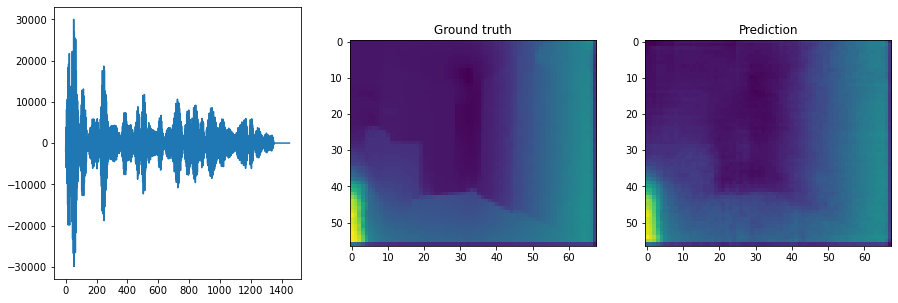

MSE 26.345998764038086


<Figure size 432x288 with 0 Axes>

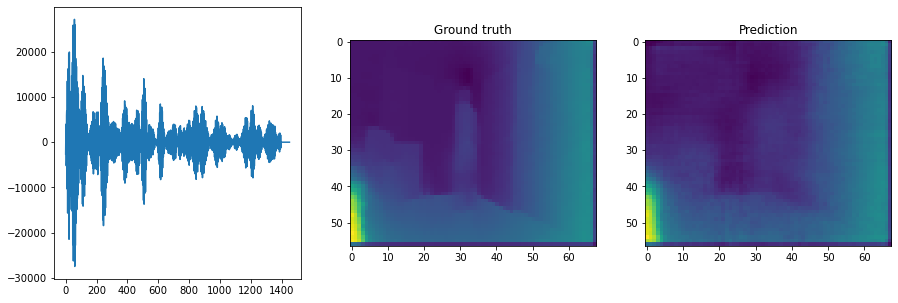

MSE 133.70272827148438


<Figure size 432x288 with 0 Axes>

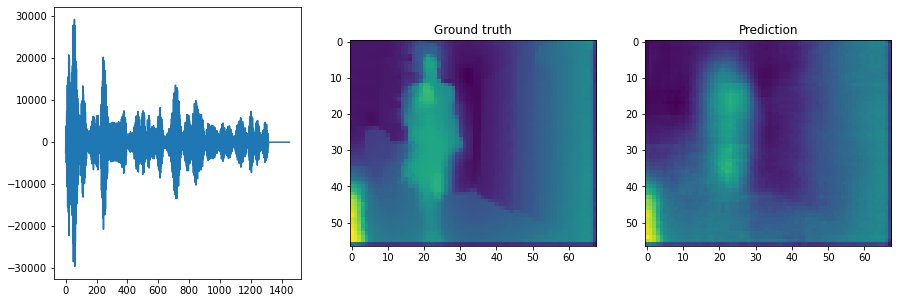

MSE 12.970715522766113


<Figure size 432x288 with 0 Axes>

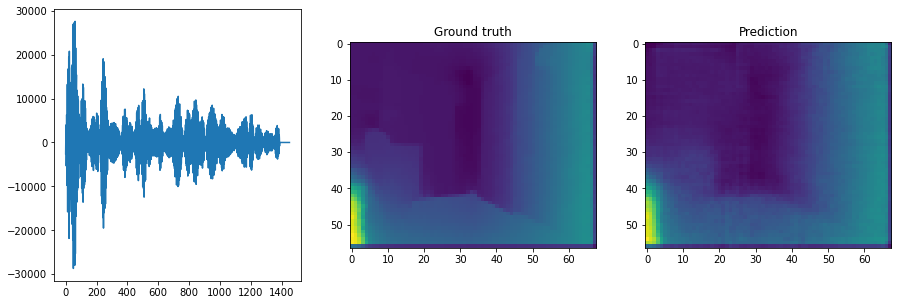

MSE 78.32592010498047


<Figure size 432x288 with 0 Axes>

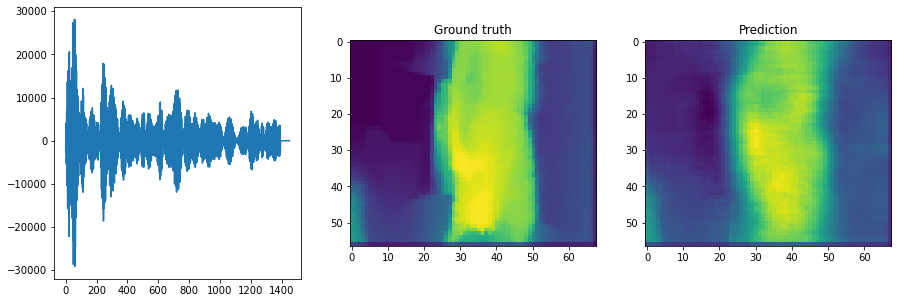

MSE 65.38092803955078


<Figure size 432x288 with 0 Axes>

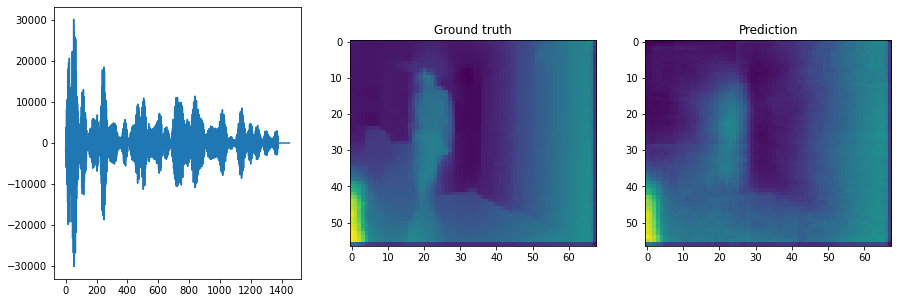

MSE 181.71937561035156


<Figure size 432x288 with 0 Axes>

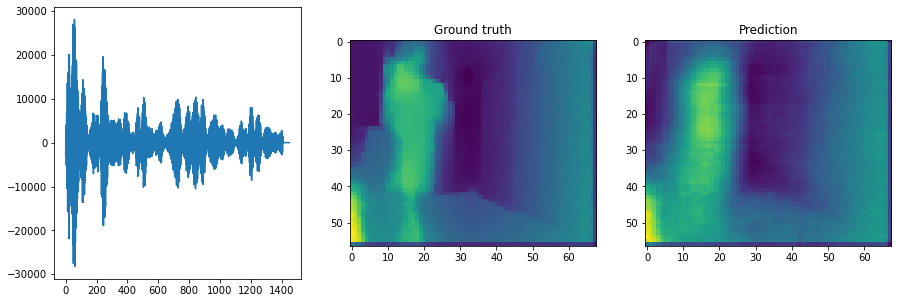

MSE 76.72539520263672


<Figure size 432x288 with 0 Axes>

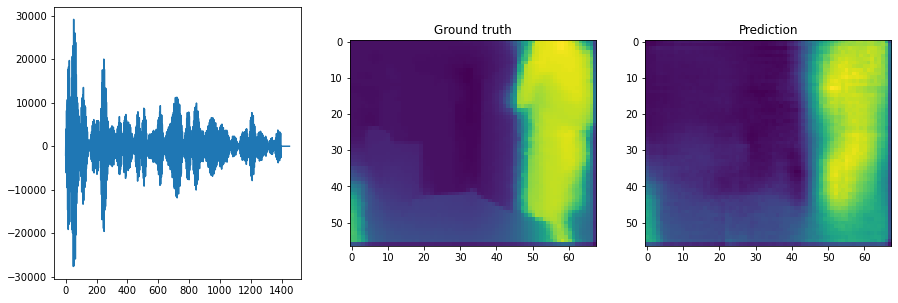

MSE 213.41409301757812


<Figure size 432x288 with 0 Axes>

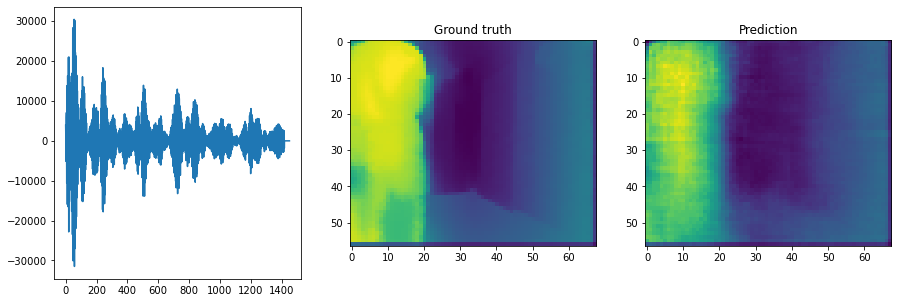

MSE 212.8271026611328


<Figure size 432x288 with 0 Axes>

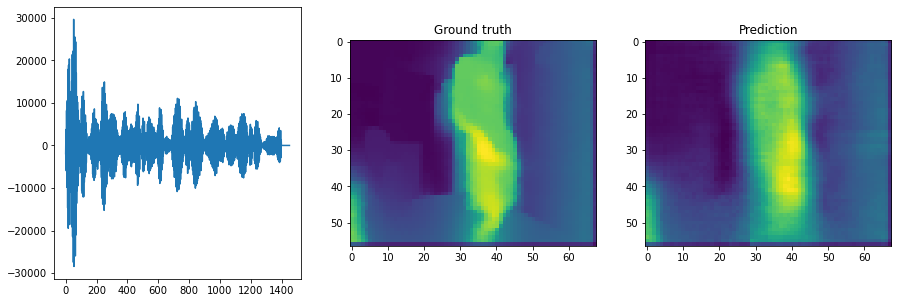

MSE 20.628803253173828


<Figure size 432x288 with 0 Axes>

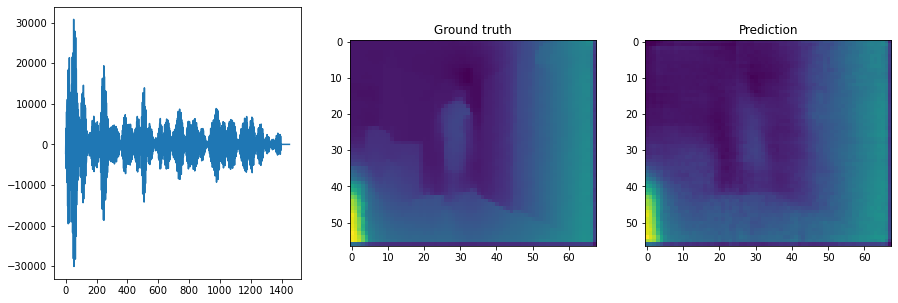

MSE 247.3412322998047


<Figure size 432x288 with 0 Axes>

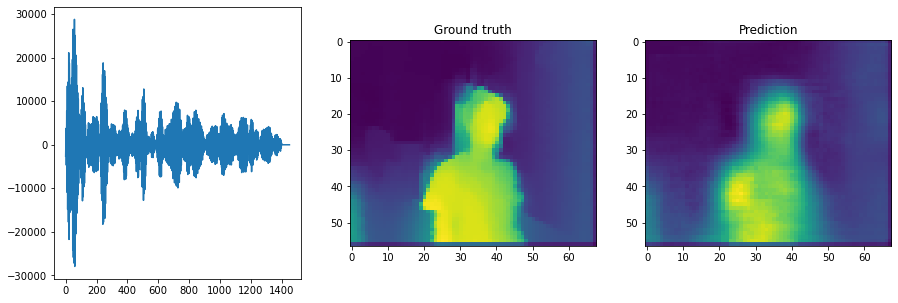

MSE 125.11199188232422


<Figure size 432x288 with 0 Axes>

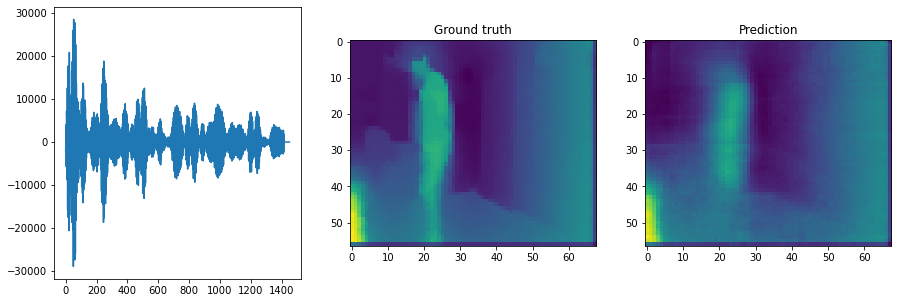

MSE 261.0765075683594


<Figure size 432x288 with 0 Axes>

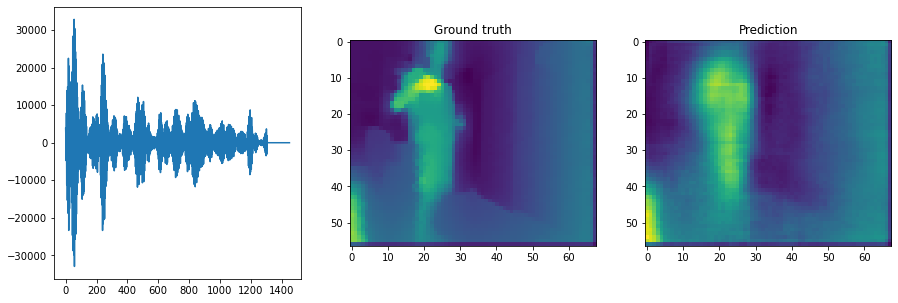

MSE 259.9001770019531


<Figure size 432x288 with 0 Axes>

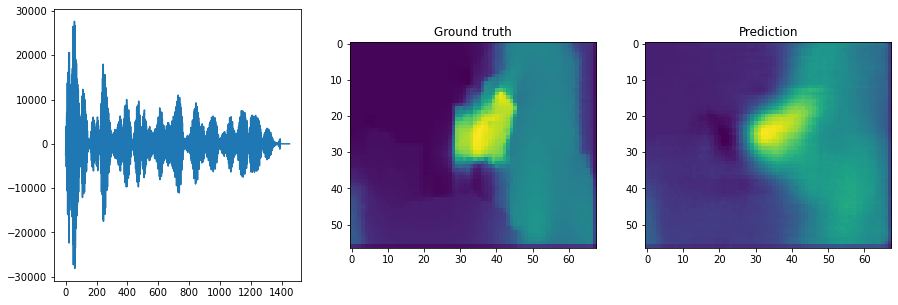

MSE 25.124916076660156


<Figure size 432x288 with 0 Axes>

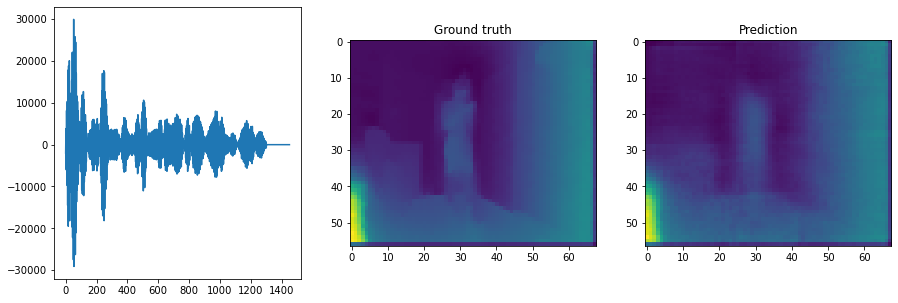

MSE 234.08633422851562


<Figure size 432x288 with 0 Axes>

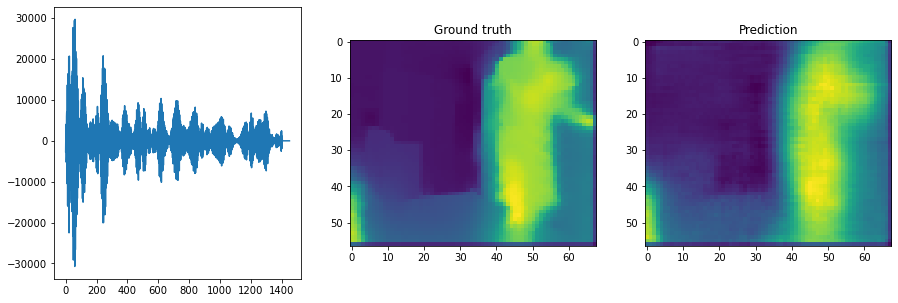

MSE 265.66046142578125


<Figure size 432x288 with 0 Axes>

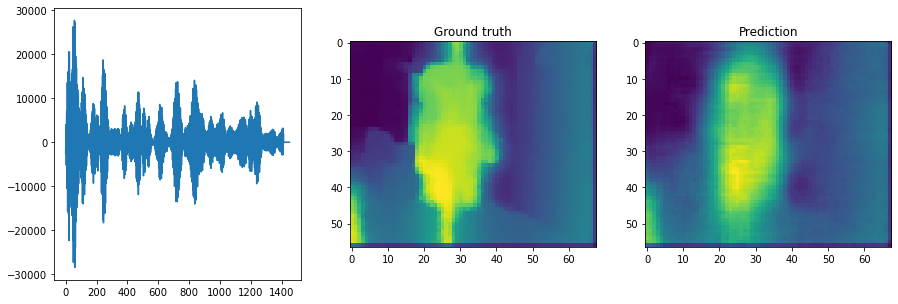

MSE 18.59694480895996


<Figure size 432x288 with 0 Axes>

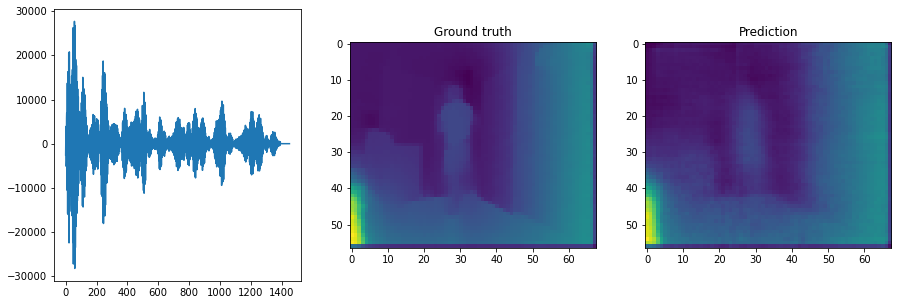

MSE 255.82492065429688


<Figure size 432x288 with 0 Axes>

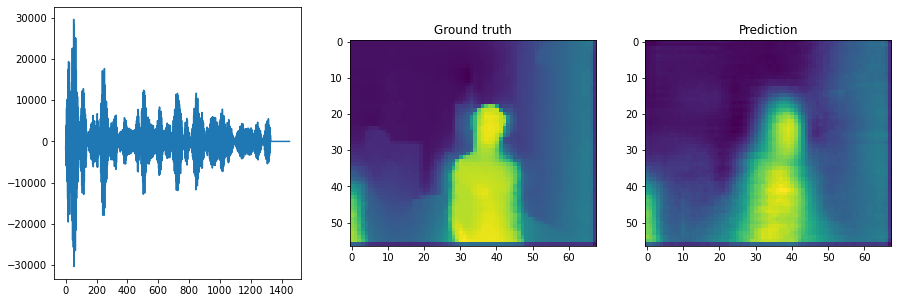

MSE 424.6181335449219


<Figure size 432x288 with 0 Axes>

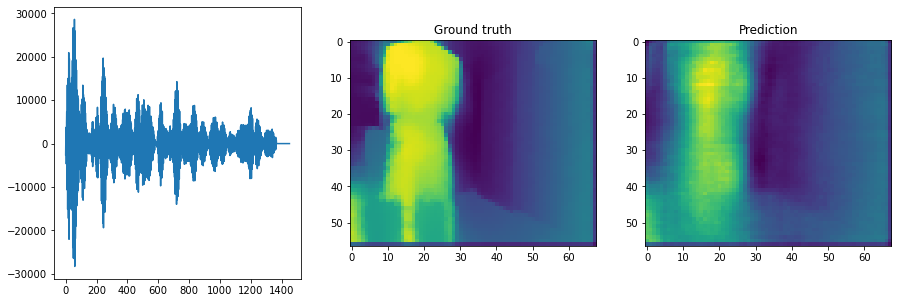

MSE 146.5516815185547


<Figure size 432x288 with 0 Axes>

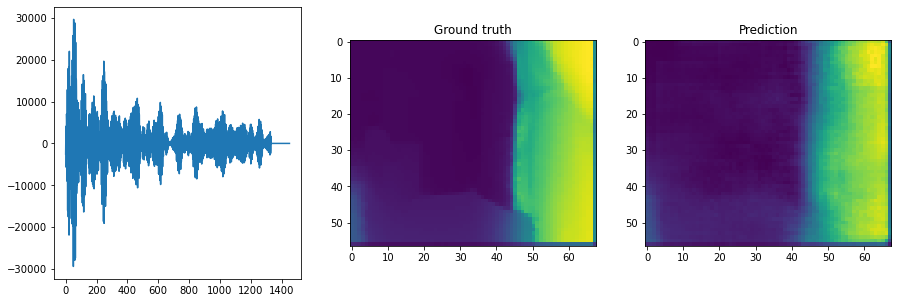

MSE 415.32958984375


<Figure size 432x288 with 0 Axes>

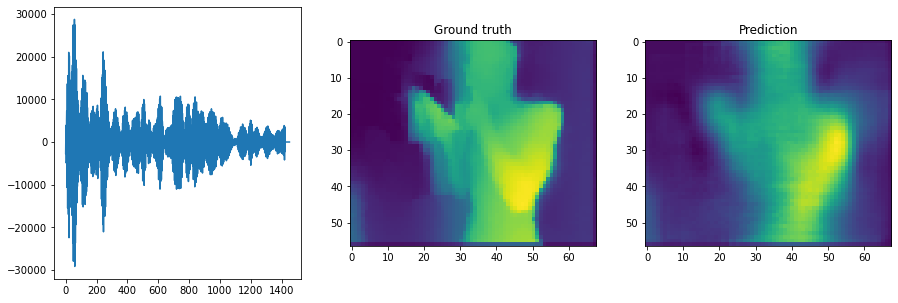

MSE 15.066925048828125


<Figure size 432x288 with 0 Axes>

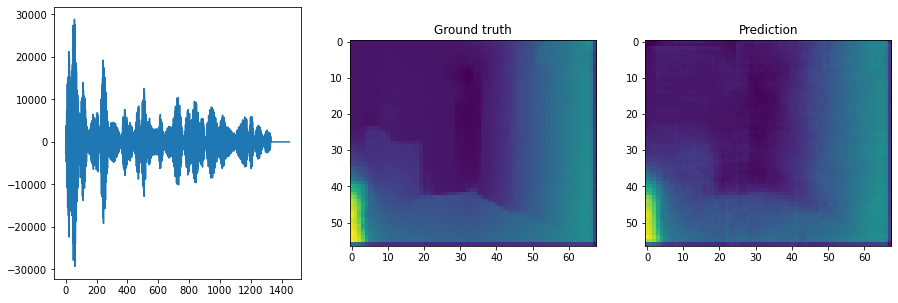

MSE 205.80267333984375


<Figure size 432x288 with 0 Axes>

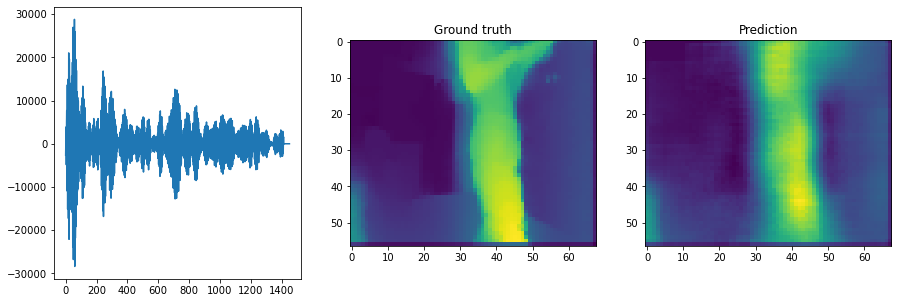

MSE 227.09658813476562


<Figure size 432x288 with 0 Axes>

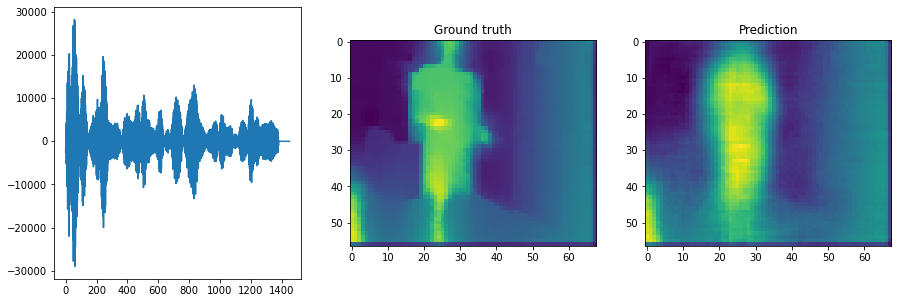

<Figure size 432x288 with 0 Axes>

In [12]:
model.eval()
for idx, (audios, images) in enumerate(train_loader):
    audios = audios.to(device)
    pred_ims = model(audios)
    print(f"\n\nBatch {idx} ###############")
    for audio, image, pred_image in zip(audios, images, pred_ims):
        print(f"MSE {criterion( pred_image, image.to(device))}")
        audio_np = np.array(audio.to('cpu').detach().numpy())
        image_np = np.array(image.to('cpu').detach().numpy())
        pred_image_np = np.array(pred_image.to('cpu').detach().numpy())
        fig, axs = plt.subplots(1,3, figsize=(15,5))
        axs[0].plot(audio_np)
        axs[1].imshow(image_np)
        axs[1].set_title("Ground truth")
        axs[2].imshow(pred_image_np)
        axs[2].set_title("Prediction")
        plt.show()
        plt.clf()
    if idx==0:
        break